<hr style="height:5px;border-width:0;color:orange;background-color:orange">
<h1 style="blackground:#FCB700; border:0; border-radius: 10px; color:white; font-size: 32px;"> <center> <b>NUCLIO DIGITAL SCHOOL -</b> MASTER EN DATA SCIENCE </center> </h1>
<h1 style="display: flex; align-items: right;">
    <div align="center"><img src="https://nuclio.school/wp-content/uploads/2018/12/nucleoDS-newBlack.png" alt="Nuclio logo" style="height: 100px; margin-right: 10px; align=right"></div>
</h1>
<h1 style='background:#FCB700; border:0; border-radius: 10px; color:white'>
    <center>Capstone Project  -  Retail</center>
</h1>
<span style="font-size: 16px;">

+ Año: **2024**
+ Autores: **Juan José Guerrero, Adrian Ortega, Ariana Puentes,  Cristina Sánchez**
+ Tutor: **Daniel Pegalajar Luque**

</span>
<hr style="height:5px;border-width:0;color:orange;background-color:orange">


# <h2 style='background:#b1b1b1; border:0; border-radius: 10px; color:black'><center>CONFIGURACION NOTEBOOK</center></h2>

## Importación librerias

In [3]:
#librerias gráficos
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#librerias generales
import pandas as pd
import datetime as dt
import numpy as np
import warnings
import holidays
from IPython.core.display import display, HTML
from ipywidgets import interact, SelectMultiple, Dropdown
from datetime import datetime
import itertools
#from google.colab import drive ## descomentar si se trabaja en google collab

C:\Users\crist\AppData\Local\Temp\ipykernel_26576\755603703.py:15: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython.display
  from IPython.core.display import display, HTML


## Configuraciones

In [4]:
pd.set_option("display.max_columns", 500)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.options.plotting.backend = 'plotly'

pio.templates.default="plotly_white"

warnings.filterwarnings("ignore")

#configuración google drive
# drive.mount('/content/drive', force_remount=True) #descomentar si se trabaja en google

##  Funciones

In [5]:
def info_dataset(list_dataset, list_name):
    for i, df in enumerate(list_dataset):
        print(f"Nombre Dataset: {list_name[i]}")
        print(f"Shape: {df.shape}")
        display(df.head(10))
        display(df.info())
        display(df.describe(include='all').T)

In [6]:
def plot_sales_and_price_parallel_faceted(df, item):
    """
    Genera dos gráficos de líneas en paralelo, cada uno facetado por 'year',
    asegurando que los gráficos en la misma fila tengan el mismo color y que los títulos sean correctos.

    Parámetros:
    df : DataFrame -> Contiene las columnas 'item', 'year', 'month', 'daily_sales', 'price'
    item : str -> Nombre del item a filtrar
    """
    # Filtrar datos para el item específico
    df_filtered = df.query(f'item == "{item}"')

    # Agrupar por año y mes, calculando ventas totales y precio promedio
    df_grouped = df_filtered.groupby(['year', 'month']).agg(
        daily_sales_sum=('daily_sales', 'sum'),
        price_avg=('sell_price', 'mean')
    ).reset_index()


    # Obtener los años únicos para facetar (después de ordenar)
    unique_years = sorted(df_grouped['year'].unique())

    # Obtener una lista de colores de Plotly
    color_palette = px.colors.qualitative.Set1  # Puedes cambiar a 'Plotly', 'Set2', etc.
    color_dict = {year: color_palette[i % len(color_palette)] for i, year in enumerate(unique_years)}

    # **Crear títulos para cada fila**
    subplot_titles = []
    for year in unique_years:
        subplot_titles.append(f"Año {year} - Ventas")
        subplot_titles.append(f"Año {year} - Precio")

    # Crear figura con subgráficos en paralelo (una columna para ventas y otra para precios)
    fig = make_subplots(
        rows=len(unique_years), cols=2,
        subplot_titles=subplot_titles,
        shared_xaxes=True,  # Compartir el eje X entre todas las filas
        vertical_spacing=0.05  # Espaciado vertical entre los gráficos
    )

    # Añadir trazas de Ventas y Precio con el mismo color
    for i, year in enumerate(unique_years):
        df_year = df_grouped[df_grouped['year'] == year]
        color = color_dict[year]  # Obtener el color asignado a este año

        # Línea de Ventas (columna 1)
        fig.add_trace(go.Scatter(
            x=df_year['month'], y=df_year['daily_sales_sum'],
            mode='lines', name=f'Ventas {year}',
            line=dict(width=2, color=color)  # Aplicar el color asignado
        ), row=i+1, col=1)

        # Línea de Precio (columna 2, con línea rayada pero mismo color)
        fig.add_trace(go.Scatter(
            x=df_year['month'], y=df_year['price_avg'],
            mode='lines', name=f'Precio {year}',
            line=dict(dash='dot', width=2, color=color)  # Mismo color pero con línea discontinua
        ), row=i+1, col=2)

    # Configuración del diseño
    fig.update_layout(
        title_text=f"Evolución de Ventas y Precio - {item}",
        height=250 * len(unique_years),  # Ajusta la altura según el número de años
        width=1700,  # Ancho del gráfico
        showlegend=False
    )

    # Ajustar el mismo rango de escala en Y para cada columna
    fig.update_yaxes(title_text="Ventas Totales", matches='y1', col=1)  # Misma escala en la columna 1
    fig.update_yaxes(title_text="Precio Promedio", matches='y2', col=2)  # Misma escala en la columna 2

    # Etiquetas de los ejes X
    fig.update_xaxes(title_text="Mes", row=len(unique_years), col=1)
    fig.update_xaxes(title_text="Mes", row=len(unique_years), col=2)

    # Mostrar gráfico
    fig.show()

In [7]:
def resume_top10_year (df, list_items, column):

    for item in list_items:
        html_code = f"""
            <div>
                <h3 style='background:#d1f9fd; border:0; border-radius: 10px; color:black'><center>{item}</center></h3>
            </div>
            """

        display(HTML(html_code))
        # Calcular el ranking anual de ventas
        annual_ranking = (
            df[df[column] == item].groupby(["year",  "item"])["daily_sales"]
            .sum()
            .reset_index()
            .sort_values(by=["year", "daily_sales"], ascending=[True, False])
        )

        # Agregar ranking dentro de cada año
        annual_ranking["rank"] = annual_ranking.groupby("year")["daily_sales"].rank(method="dense", ascending=False)

        # Filtrar solo el Top 10 de cada año
        top10_anual = annual_ranking[annual_ranking["rank"] <= 10]

        # Crear matriz de presencia en el Top 10
        top10_pivot = top10_anual.pivot(index="item", columns="year", values="rank")
        top10_pivot = top10_pivot.sort_values(by=top10_pivot.columns[-1])  # Ordenar por último año
        top10_pivot = top10_pivot.fillna(0)  # Rellenar con 0 (productos que no estuvieron en el Top 10)

        # Tabla de frecuencia de productos en el Top 10
        freq_item = top10_pivot.apply(lambda x: (x > 0).sum(), axis=1)
        freq_item = freq_item.reset_index()
        freq_item.columns = ["item", "top10_year"]
        freq_item = freq_item.sort_values(by="top10_year", ascending=False)
        display(freq_item.plot(kind="bar", x="item", y="top10_year", title=f"Frecuecia en el Top 10 - {item}"))

        #Graficar Heatmap el Top 10 por producto y año
        fig = go.Figure(
            data=go.Heatmap(
                z=top10_pivot.replace(0, np.nan).values,
                x=top10_pivot.columns,
                y=top10_pivot.index,
                colorscale="YlGnBu",
                showscale=True,
                hoverongaps=False
            )
        )
        fig.update_layout(
            title="Posición de los productos en el Top 10 por año "+ item,
            xaxis_title="Año",
            yaxis_title="Categoría - Producto",
            height=600
        )
        fig.show()

        # Obtener los productos que aparecen cada año
        item_byYear = top10_anual.groupby("year")["item"].apply(set)

        # Encontrar los productos recurrentes en todos los años
        rec_item = set.intersection(*item_byYear)
        var_item = set.union(*item_byYear) - rec_item

        html_code = f"""
            <div>
                ###########################################################
                <p>Productos recurrentes:{rec_item}</p>
                <p>Productos variables:{var_item}</p>
                ###########################################################
            </div>
            """

        display(HTML(html_code))

        # === Gráfico Sankey para ver flujo de productos entre años ===
        años = sorted(top10_anual["year"].unique())
        productos_top10 = list(set(top10_anual["item"]))

        sankey_labels = productos_top10 + [str(a) for a in años]
        sankey_source = []
        sankey_target = []
        sankey_value = []

        for i in range(len(años) - 1):
            df1 = top10_anual[top10_anual["year"] == años[i]]
            df2 = top10_anual[top10_anual["year"] == años[i + 1]]
            for prod in productos_top10:
                if prod in df1["item"].values and prod in df2["item"].values:
                    sankey_source.append(sankey_labels.index(prod))
                    sankey_target.append(sankey_labels.index(str(años[i + 1])))
                    sankey_value.append(1)

        fig = go.Figure(go.Sankey(
            node=dict(
                pad=15,
                thickness=20,
                line=dict(color="black", width=0.5),
                label=sankey_labels
            ),
            link=dict(
                source=sankey_source,
                target=sankey_target,
                value=sankey_value
            )
        ))
        fig.update_layout(title_text="Flujo de productos en el Top 10 entre años", font_size=10)
        fig.show()


        for year in top10_anual["year"].unique():
            print(f"------------------------------- {year} -------------------------------")
            df_top10_filtrado = top10_anual[(top10_anual["daily_sales"] > 0) & (top10_anual["year"]==year) ]
            # Crear gráfico de barras apiladas con Plotly
            fig = px.bar(df_top10_filtrado,
                        x="daily_sales",
                        y="item",
                        facet_row="year",
                        facet_col_spacing=0.5,
                        orientation="h",
                        title=f"Total de Ventas - {year} - (Top 10 productos)",
                        labels={"daily_sales": "Ventas Totales", "year": "Año", "item": "Producto"},
                        text_auto=True)

            # Mostrar gráfico
            fig.show()




In [8]:
def resume_top10_historical (df,list_items, column):

    top10_item = {}
    for item in list_items:
        top10_item[item] = df[(df[column]==item)].groupby(['item'])['daily_sales'].sum().sort_values(ascending=False).reset_index().item.head(10)

    for item in list_items:
        html_code = f"""
            <div>
                <h3 style='background:#d1f9fd; border:0; border-radius: 10px; color:black'><center>{item}</center></h3>
            </div>
            """

        display(HTML(html_code))

        df_rank = df[df[column] == item].groupby(['year', 'item'])['daily_sales'].sum().reset_index()
        df_rank['rank'] =  df_rank.groupby('year')['daily_sales'].rank(method="dense", ascending=False)

        # Filtrar solo los 10 productos más vendidos históricamente
        df_rank_filtered = df_rank[df_rank['item'].isin(top10_item[item])]
        df_rank_filtered['delta'] = df_rank_filtered.groupby('item')['rank'].diff() * (-1)

        # Graficar la evolución del ranking
        fig = px.line(
            df_rank_filtered,
            x="year",
            y="rank",
            color="item",
            title="Evolución del Ranking de los 10 Productos Más Vendidos dentro de " + item,
            markers=True
        )

        # Invertir eje Y para que el #1 esté arriba
        fig.update_yaxes(autorange="reversed", title="Posición en Ventas (1 = más vendido)")
        fig.update_xaxes(title="Año")

        # Mostrar gráfico
        fig.show()

        # Crear un pivot table con el delta, con 'item' como índice y 'year' como columnas
        heatmap_data = df_rank_filtered.pivot(index='item', columns='year', values='delta')

        # Graficar el heatmap
        fig = px.imshow(
            heatmap_data.iloc[:,1:-1],
            text_auto=True,      # Muestra los valores en cada celda
            aspect="auto",       # Ajusta el aspecto
            title="Variación del Ranking Año a Año - "+item,
            color_continuous_scale="RdYlGn",
            color_continuous_midpoint=0,
            range_color=[-50, 50]
        )

        fig.update_xaxes(title="Año")
        fig.update_yaxes(title="Producto")
        fig.show()

In [9]:
def plot_sales_region(df,region):
    # Filtrar datos por región
    df_region = df[df['region'] == region]

    # Agrupar ventas por tienda y fecha dentro de la región
    ventas_tienda_tiempo = df_region.groupby(['date', 'store'], observed=True)['daily_sales'].sum().reset_index()

    # Crear gráfico de líneas interactivo con Plotly
    fig = px.line(ventas_tienda_tiempo,
                x='date',
                y='daily_sales',
                color='store',
                title=f"Evolución de Ventas en Tiendas de {region.upper()}",
                labels={'daily_sales': 'Total sales'})

    # Mostrar gráfico
    fig.show()

In [10]:
# Función para obtener ventas en el rango de ±3 días
def get_sales_window(event_filter, df):
    event_dates = df[df['event_boolean'] == 1][['date', 'event']].drop_duplicates()
    # Filtrar fechas de eventos según los eventos seleccionados
    event_dates_filtered = event_dates[event_dates['event'].isin(event_filter)]

    # Crear un DataFrame con todas las fechas en el rango de ±3 días
    date_ranges = []
    for _, row in event_dates_filtered.iterrows():
        event_date = row['date']
        event_name = row['event']
        dates = pd.date_range(start=event_date - pd.Timedelta(days=3),
                              end=event_date + pd.Timedelta(days=3), freq='D')
        for d in dates:
            date_ranges.append({'date': d, 'event': event_name,
                                'days_to_event': (d - event_date).days})

    window_df = pd.DataFrame(date_ranges)

    # Unir con las ventas del DataFrame original
    window_df = window_df.merge(df[['date', 'daily_sales']],
                                on=['date'], how='left')

    # Rellenar ventas faltantes con 0
    window_df['daily_sales'] = window_df['daily_sales'].fillna(0)
    return window_df

In [11]:
# Función para graficar ventas pre-post evento
def plot_sales_window(year, selected_events, global_avg, df):
    event_dates = df[df['event_boolean'] == 1][['date', 'event']].drop_duplicates()
    # Filtrar eventos por año
    if year == 'Todos':
        event_dates_filtered = event_dates.copy()
        year_title = 'Todos los años'
    else:
        event_dates_filtered = event_dates[event_dates['date'].dt.year == int(year)]
        year_title = str(year)

    # Filtrar por eventos seleccionados
    if not selected_events or 'Todos' in selected_events:
        selected_events = event_dates_filtered['event'].unique().tolist()
    else:
        selected_events = [e for e in selected_events if e in event_dates_filtered['event'].unique()]

    if not selected_events:
        print(f"No hay eventos para Año: {year}")
        return

    # Si se selecciona "Promedio Global", calcular ventas promedio global
    if global_avg:
        # Obtener todas las fechas de eventos en el año seleccionado
        event_days_year = event_dates_filtered['date'].unique()

        # Crear un DataFrame para almacenar todas las ventas por día relativo
        all_relative_sales = []

        # Para cada fecha de evento, calcular las ventas en los días relativos
        for event_date in event_days_year:
            for days_offset in range(-3, 4):
                relative_date = event_date + pd.Timedelta(days=days_offset)
                daily_sales = df[df['date'] == relative_date]['daily_sales'].mean()

                # Si no hay ventas para esa fecha, usar 0
                if pd.isna(daily_sales):
                    daily_sales = 0

                all_relative_sales.append({
                    'days_to_event': days_offset,
                    'daily_sales': daily_sales,
                    'event': 'Promedio Global'
                })

        # Convertir a DataFrame
        all_sales_df = pd.DataFrame(all_relative_sales)

        # Calcular promedio por día relativo
        sales_by_day = all_sales_df.groupby(['event', 'days_to_event'])['daily_sales'].mean().reset_index()
    else:
        # Obtener ventas por evento
        window_df = get_sales_window(selected_events, df)

        # Calcular ventas promedio por día relativo y evento
        sales_by_day = window_df.groupby(['event', 'days_to_event'])['daily_sales'].mean().reset_index()

        # Asegurar que todos los días estén presentes
        all_days = pd.DataFrame({
            'days_to_event': list(range(-3, 4)) * len(selected_events),
            'event': [event for event in selected_events for _ in range(7)]
        })
        sales_by_day = all_days.merge(sales_by_day, on=['event', 'days_to_event'], how='left').fillna({'daily_sales': 0})

    # Crear gráfico de barras superpuestas
    fig = px.bar(sales_by_day, x='days_to_event', y='daily_sales', color='event',
                 title=f'Ventas Promedio Pre-Post Evento (Año: {year_title})',
                 labels={'days_to_event': 'Día relativo al evento', 'daily_sales': 'Ventas diarias promedio'},
                 height=500,
                 barmode='overlay')

    # Personalizar ejes
    fig.update_xaxes(tickvals=list(range(-3, 4)), ticktext=['-3', '-2', '-1', '0', '+1', '+2', '+3'])
    fig.update_layout(legend_title_text='Evento')

    # Añadir etiquetas a las barras
    fig.update_traces(texttemplate='%{y:.2f}', textposition='auto')

    fig.show()

In [12]:
# Función para graficar ventas pre-post evento por region
def plot_sales_window_region(year, selected_events, global_avg, region, df):
    event_dates = df[df['event_boolean'] == 1][['date', 'event']].drop_duplicates()
    # Filtrar eventos por año
    if year == 'Todos':
        event_dates_filtered = event_dates.copy()
        year_title = 'Todos los años'
    else:
        event_dates_filtered = event_dates[event_dates['date'].dt.year == int(year)]
        year_title = str(year)

    # Filtrar por eventos seleccionados
    if not selected_events or 'Todos' in selected_events:
        selected_events = event_dates_filtered['event'].unique().tolist()
    else:
        selected_events = [e for e in selected_events if e in event_dates_filtered['event'].unique()]

    if not selected_events:
        print(f"No hay eventos para Año: {year}")
        return

    # Si se selecciona "Promedio Global", calcular ventas promedio global
    if global_avg:
        # Obtener todas las fechas de eventos en el año seleccionado
        event_days_year = event_dates_filtered['date'].unique()

        # Crear un DataFrame para almacenar todas las ventas por día relativo
        all_relative_sales = []

        # Para cada fecha de evento, calcular las ventas en los días relativos
        for event_date in event_days_year:
            for days_offset in range(-3, 4):
                relative_date = event_date + pd.Timedelta(days=days_offset)

                # Filtrar por región si se especifica
                if region and region != 'Todas':
                    daily_sales = df[
                        (df['date'] == relative_date) &
                        (df['region'] == region)
                    ]['daily_sales'].mean()
                else:
                    daily_sales = df[df['date'] == relative_date]['daily_sales'].mean()

                # Si no hay ventas para esa fecha, usar 0
                if pd.isna(daily_sales):
                    daily_sales = 0

                all_relative_sales.append({
                    'days_to_event': days_offset,
                    'daily_sales': daily_sales,
                    'event': 'Promedio Global'
                })

        # Convertir a DataFrame
        all_sales_df = pd.DataFrame(all_relative_sales)

        # Calcular promedio por día relativo
        sales_by_day = all_sales_df.groupby(['event', 'days_to_event'])['daily_sales'].mean().reset_index()
    else:
        # Obtener ventas por evento
        window_df = get_sales_window(selected_events)

        # Calcular ventas promedio por día relativo y evento
        sales_by_day = window_df.groupby(['event', 'days_to_event'])['daily_sales'].mean().reset_index()

        # Asegurar que todos los días estén presentes
        all_days = pd.DataFrame({
            'days_to_event': list(range(-3, 4)) * len(selected_events),
            'event': [event for event in selected_events for _ in range(7)]
        })
        sales_by_day = all_days.merge(sales_by_day, on=['event', 'days_to_event'], how='left').fillna({'daily_sales': 0})

    # Crear gráfico de barras superpuestas
    fig = px.bar(sales_by_day, x='days_to_event', y='daily_sales', color='event',
                 title=f'Ventas Promedio Pre-Post Evento (Año: {year_title}, Región: {region if region != "Todas" else "Todas las regiones"})',
                 labels={'days_to_event': 'Día relativo al evento', 'daily_sales': 'Ventas diarias promedio'},
                 height=500,
                 barmode='overlay')

    # Personalizar ejes
    fig.update_xaxes(tickvals=list(range(-3, 4)), ticktext=['-3', '-2', '-1', '0', '+1', '+2', '+3'])
    fig.update_layout(legend_title_text='Evento')

    # Añadir etiquetas a las barras
    fig.update_traces(texttemplate='%{y:.2f}', textposition='auto')

    fig.show()

In [13]:
# Función para graficar ventas pre-post evento
def plot_sales_window_tienda(year, selected_events, global_avg, store_code, df):
    event_dates = df[df['event_boolean'] == 1][['date', 'event']].drop_duplicates()
    # Filtrar eventos por año
    if year == 'Todos':
        event_dates_filtered = event_dates.copy()
        year_title = 'Todos los años'
    else:
        event_dates_filtered = event_dates[event_dates['date'].dt.year == int(year)]
        year_title = str(year)

    # Filtrar por eventos seleccionados
    if not selected_events or 'Todos' in selected_events:
        selected_events = event_dates_filtered['event'].unique().tolist()
    else:
        selected_events = [e for e in selected_events if e in event_dates_filtered['event'].unique()]

    if not selected_events:
        print(f"No hay eventos para Año: {year}")
        return

    # Si se selecciona "Promedio Global", calcular ventas promedio global
    if global_avg:
        # Obtener todas las fechas de eventos en el año seleccionado
        event_days_year = event_dates_filtered['date'].unique()

        # Crear un DataFrame para almacenar todas las ventas por día relativo
        all_relative_sales = []

        # Para cada fecha de evento, calcular las ventas en los días relativos
        for event_date in event_days_year:
            for days_offset in range(-3, 4):
                relative_date = event_date + pd.Timedelta(days=days_offset)

                # Filtrar por región si se especifica
                if store_code and store_code != 'Todas':
                    daily_sales = df[
                        (df['date'] == relative_date) &
                        (df['store_code'] == store_code)
                    ]['daily_sales'].mean()
                else:
                    daily_sales = df[df['date'] == relative_date]['daily_sales'].mean()

                # Si no hay ventas para esa fecha, usar 0
                if pd.isna(daily_sales):
                    daily_sales = 0

                all_relative_sales.append({
                    'days_to_event': days_offset,
                    'daily_sales': daily_sales,
                    'event': 'Promedio Global'
                })

        # Convertir a DataFrame
        all_sales_df = pd.DataFrame(all_relative_sales)

        # Calcular promedio por día relativo
        sales_by_day = all_sales_df.groupby(['event', 'days_to_event'])['daily_sales'].mean().reset_index()
    else:
        # Obtener ventas por evento
        window_df = get_sales_window(selected_events, store_code)

        # Calcular ventas promedio por día relativo y evento
        sales_by_day = window_df.groupby(['event', 'days_to_event'])['daily_sales'].mean().reset_index()

        # Asegurar que todos los días estén presentes
        all_days = pd.DataFrame({
            'days_to_event': list(range(-3, 4)) * len(selected_events),
            'event': [event for event in selected_events for _ in range(7)]
        })
        sales_by_day = all_days.merge(sales_by_day, on=['event', 'days_to_event'], how='left').fillna({'daily_sales': 0})

    # Crear gráfico de barras superpuestas
    fig = px.bar(sales_by_day, x='days_to_event', y='daily_sales', color='event',
                 title=f'Ventas Promedio Pre-Post Evento (Año: {year_title}, Tienda: {store_code if store_code != "Todas" else "Todas las tiendas"})',
                 labels={'days_to_event': 'Día relativo al evento', 'daily_sales': 'Ventas diarias promedio'},
                 height=500,
                 barmode='overlay')

    # Personalizar ejes
    fig.update_xaxes(tickvals=list(range(-3, 4)), ticktext=['-3', '-2', '-1', '0', '+1', '+2', '+3'])
    fig.update_layout(legend_title_text='Evento')

    # Añadir etiquetas a las barras
    fig.update_traces(texttemplate='%{y:.2f}', textposition='auto')

    fig.show()

In [14]:
def plot_sales_heatmap(year, selected_regions, df):
    """
    Genera un heatmap interactivo de ventas por eventos y departamentos, con filtro por región.

    Args:
        year (str): Año seleccionado o 'Todos' para todos los años.
        selected_regions (list): Lista de regiones seleccionadas o 'Todas'.
    """
    event_dates = df[df['event_boolean'] == 1][['date', 'event']].drop_duplicates()
    # Filtrar eventos por año
    if year == 'Todos':
        event_dates_filtered = event_dates.copy()
        year_title = 'Todos los años'
    else:
        event_dates_filtered = event_dates[event_dates['date'].dt.year == int(year)]
        year_title = str(year)

    # Filtrar el DataFrame por el año y eventos seleccionados
    if year != 'Todos':
        df_filtered = df[df['date'].dt.year == int(year)]
    else:
        df_filtered = df.copy()

    df_filtered = df_filtered[df_filtered['event'] != 'No']

    # Filtrar por regiones seleccionadas (o todas si se selecciona 'Todas')
    if not selected_regions or 'Todas' in selected_regions:
        selected_regions = df['region'].unique().tolist()
        region_title = 'Todas las regiones'
    else:
        region_title = ", ".join(selected_regions)

    df_filtered = df_filtered[df_filtered['region'].isin(selected_regions)]

    # Agrupar por evento y departamento para calcular ventas promedio
    heatmap_data = df_filtered.groupby(['event', 'department'])['daily_sales'].mean().reset_index()

    # Crear pivote para el heatmap
    pivot_data = heatmap_data.pivot(index='department', columns='event', values='daily_sales').fillna(0)

    # Crear heatmap con Plotly
    fig = px.imshow(pivot_data,
                    labels=dict(x="Evento", y="Departamento", color="Ventas Promedio"),
                    x=pivot_data.columns,
                    y=pivot_data.index,
                    color_continuous_scale='Viridis',
                    title=f'Heatmap de Ventas Promedio por Evento y Departamento (Año: {year_title}, Regiones: {region_title})',
                    aspect="auto",
                    height=600)

    # Personalizar el diseño
    fig.update_layout(
        xaxis_title="Evento",
        yaxis_title="Departamento",
        coloraxis_colorbar_title="Ventas Promedio"
    )

    # Añadir texto con valores en cada celda
    fig.update_traces(text=pivot_data.values, texttemplate="%{text:.2f}")

    fig.show()

In [15]:
def plot_sales_heatmap_by_region(year, df):
    """
    Genera un heatmap interactivo de ventas por eventos y regiones.

    Args:
        year (str): Año seleccionado o 'Todos' para todos los años.
    """
    event_dates = df[df['event_boolean'] == 1][['date', 'event']].drop_duplicates()
    # Filtrar eventos por año
    if year == 'Todos':
        event_dates_filtered = event_dates.copy()
        year_title = 'Todos los años'
    else:
        event_dates_filtered = event_dates[event_dates['date'].dt.year == int(year)]
        year_title = str(year)


    # Filtrar el DataFrame por el año y eventos seleccionados
    if year != 'Todos':
        df_filtered = df[df['date'].dt.year == int(year)]
    else:
        df_filtered = df.copy()

    df_filtered = df_filtered[df_filtered['event'] != 'No']

    # Agrupar por evento y región para calcular ventas promedio
    heatmap_data = df_filtered.groupby(['event', 'region'], observed=False)['daily_sales'].mean().reset_index()

    # Crear pivote para el heatmap
    pivot_data = heatmap_data.pivot(index='region', columns='event', values='daily_sales').fillna(0)

    # Crear heatmap con Plotly
    fig = px.imshow(pivot_data,
                    labels=dict(x="Evento", y="Región", color="Ventas Promedio"),
                    x=pivot_data.columns,
                    y=pivot_data.index,
                    color_continuous_scale='Viridis',
                    title=f'Heatmap de Ventas Promedio por Evento y Región (Año: {year_title})',
                    aspect="auto",
                    height=600)

    # Personalizar el diseño
    fig.update_layout(
        xaxis_title="Evento",
        yaxis_title="Región",
        coloraxis_colorbar_title="Ventas Promedio"
    )

    # Añadir texto con valores en cada celda
    fig.update_traces(text=pivot_data.values, texttemplate="%{text:.2f}")

    fig.show()

In [16]:
# Función para generar gráfico de cada región con precio medio en eje Y2 por artículo en cada tienda
def graficar_top_ventas_por_tienda(df,region):
    # Filtrar por región
    df_region = df[df['region'] == region]

    # Agrupar ventas y precio medio por tienda y artículo dentro de la región
    ventas_tienda = df_region.groupby(['store', 'item'], observed=True).agg({'daily_sales': 'sum', 'sell_price': 'mean'}).reset_index()

    # Asignar ranking de los 5 artículos más vendidos en cada tienda
    ventas_tienda['rank'] = ventas_tienda.groupby('store')['daily_sales'].rank(method="first", ascending=False)
    top_ventas_tienda = ventas_tienda[ventas_tienda['rank'] <= 5]

    # Convertir columnas a string antes de concatenar
    top_ventas_tienda['store'] = top_ventas_tienda['store'].astype(str)
    top_ventas_tienda['item'] = top_ventas_tienda['item'].astype(str)

    # Crear una nueva columna combinando "Ranking - Tienda - Artículo" para mejor visualización en X
    top_ventas_tienda['rank_store_item'] = top_ventas_tienda['rank'].astype(int).astype(str) + " - " + top_ventas_tienda['store'] + " - " + top_ventas_tienda['item']

    # Ordenar por ranking antes de graficar
    top_ventas_tienda = top_ventas_tienda.sort_values(by=['rank', 'store'])

    # Crear figura con colores distintos para cada tienda
    fig = px.bar(top_ventas_tienda,
                x='rank_store_item',
                y='daily_sales',
                color='store',
                title=f"Top 5 Artículos Más Vendidos en Cada Tienda de {region} y su Precio Medio (Ordenado por Ranking)",
                labels={'rank_store_item': 'Ranking - Tienda - Artículo', 'daily_sales': 'Unidades Vendidas'},
                text_auto=True,
                barmode='group',
                color_discrete_sequence=px.colors.qualitative.Set1)  # Paleta de colores para tiendas

    # Convertir la figura de Plotly Express a Graph Objects para añadir el eje secundario
    fig = go.Figure(fig.data)

    # Agregar el precio medio como puntos individuales para cada artículo
    fig.add_trace(go.Scatter(
        x=top_ventas_tienda['rank_store_item'],
        y=top_ventas_tienda['sell_price'],
        name="Precio Medio",
        yaxis="y2",
        mode='markers',
        marker=dict(size=10, color='red', symbol='circle')
    ))

    # Configurar el layout con dos ejes Y
    fig.update_layout(
        xaxis_title="Ranking - Tienda - Artículo",
        yaxis=dict(title="Unidades Vendidas", showgrid=False, color='blue'),
        yaxis2=dict(title="Precio Medio", overlaying='y', side='right', showgrid=False, color='red'),
        legend_title="Tienda",
        xaxis_tickangle=-45
    )

    # Mostrar gráfico
    fig.show()



Función para calcular la importancia del evento usando ventas semanales:

In [ ]:
def calculate_weekly_event_importance(df, group_col):
    """
    Calcula la importancia de eventos y holidays usando ventas semanales en lugar de diarias.

    Parámetros:
        df (DataFrame): DataFrame con ['date', 'event_holidays', 'event_holidays_boolean', 'daily_sales', group_col].
        group_col (str): Columna por la cual agrupar ('store', 'region', 'department').

    Retorna:
        DataFrame con métricas de importancia de eventos basadas en ventas semanales.
    """

    # Agrupar por semana y grupo para obtener ventas semanales
    weekly_sales = df.groupby([group_col, 'week_start'])['daily_sales'].sum().reset_index()
    weekly_sales.rename(columns={'daily_sales': 'weekly_sales'}, inplace=True)

    # Unir las ventas semanales con la información de eventos
    df_weekly = df[['week_start', group_col, 'event_holidays', 'event_holidays_boolean']].drop_duplicates()
    df_weekly = df_weekly.merge(weekly_sales, on=[group_col, 'week_start'], how='left')

    # Obtener ventas por evento y grupo (solo semanas con eventos)
    event_sales = df_weekly.query("event_holidays_boolean == 1").groupby([group_col, 'event_holidays'])['weekly_sales'].sum().reset_index()

    # Obtener ventas promedio en semanas sin eventos por grupo
    baseline_sales = df_weekly.query("event_holidays_boolean == 0").groupby(group_col)['weekly_sales'].mean()

    # Calcular la importancia de cada evento
    event_sales['Baseline Sales'] = event_sales[group_col].map(baseline_sales)
    event_sales['Baseline Sales'] = pd.to_numeric(event_sales['Baseline Sales'], errors='coerce')
    event_sales['weekly_sales'] = pd.to_numeric(event_sales['weekly_sales'], errors='coerce')


    # Evitar división por cero reemplazando 0 con NaN
    event_sales['Baseline Sales'] = event_sales['Baseline Sales'].replace(0, np.nan)

    event_sales['Importance Score'] = (
        (event_sales['weekly_sales'] - event_sales['Baseline Sales']) / event_sales['Baseline Sales']
    ) * 100

    # Si no hay ventas base, dejamos NaN en lugar de valores erróneos
    event_sales.loc[event_sales['Baseline Sales'].isna(), 'Importance Score'] = np.nan

    # Comparación del impacto de los eventos entre grupos
    event_sales_pivot = event_sales.pivot(index='event_holidays', columns=group_col, values='Importance Score')

    # Análisis de variabilidad de impacto de eventos
    event_sales['Std Dev Impact'] = event_sales.groupby('event_holidays')['Importance Score'].transform('std')

    # Eventos con más estabilidad en su impacto
    event_sales['Stability Score'] = 1 / (1 + event_sales['Std Dev Impact'])

    # Ordenar por importancia
    event_sales = event_sales.sort_values([group_col, 'Importance Score'], ascending=[True, False])

    # Imprimir Resultados
    print(f"\n=== Importancia de los Eventos por {group_col} (Basado en Ventas Semanales) ===")
    print(event_sales[[group_col, 'event_holidays', 'weekly_sales', 'Importance Score']].round(2))

    print(f"\n=== Comparación del Impacto de los Eventos entre {group_col}s ===")
    print(event_sales_pivot.round(2))

    print("\n=== Variabilidad de Impacto de Eventos ===")
    print(event_sales[['event_holidays', 'Std Dev Impact']].drop_duplicates().round(2))

    print("\n=== Eventos con Más Estabilidad en su Impacto ===")
    print(event_sales[['event_holidays', 'Stability Score']].drop_duplicates().sort_values(by='Stability Score', ascending=False).round(2))

    return event_sales


Función para calcular la importancia del evento usando ventas diarias:

In [ ]:
def calculate_event_importance(df, group_col):
    """
    Calcula la importancia de eventos y holidays según una columna de agrupación dada.

    Parámetros:
        df (DataFrame): DataFrame con columnas ['date', 'event_holidays', 'event_holidays_boolean', 'daily_sales', group_col].
        group_col (str): Columna por la cual agrupar ('store', 'region', 'department').

    Retorna:
        DataFrame con métricas de importancia de eventos.
    """
    # Comprobar que 'date' es de tipo datetime
    df['date'] = pd.to_datetime(df['date'])

    # Convertir a string la columna de agrupación
    df[group_col] = df[group_col].astype(str)

    # Obtener ventas por evento y grupo
    event_sales = df.query("event_holidays_boolean == 1").groupby([group_col, 'event_holidays'])['daily_sales'].sum().reset_index()

    # Obtener ventas promedio en días sin eventos por grupo
    baseline_sales = df.query("event_holidays_boolean == 0").groupby(group_col)['daily_sales'].mean()

    # Calcular la importancia de cada evento
    event_sales['Baseline Sales'] = event_sales[group_col].map(baseline_sales)
    # Reemplazar valores 0 o NaN en 'Baseline Sales' con NaN para evitar valores incorrectos
    event_sales['Baseline Sales'] = event_sales['Baseline Sales'].replace(0, np.nan)
   # Calcular el Importance Score
    event_sales['Importance Score'] = (
        (event_sales['daily_sales'] - event_sales['Baseline Sales']) / event_sales['Baseline Sales']
    ) * 100

    # Donde la importancia no se pueda calcular (Baseline Sales NaN), dejar NaN en lugar de -100
    event_sales.loc[event_sales['Baseline Sales'].isna(), 'Importance Score'] = np.nan

    # Comparación del impacto de los eventos entre grupos
    event_sales_pivot = event_sales.pivot(index='event_holidays', columns=group_col, values='Importance Score')

    # Análisis de variabilidad de impacto de eventos
    event_sales['Std Dev Impact'] = event_sales.groupby('event_holidays')['Importance Score'].transform('std')

    # Eventos con más estabilidad en su impacto
    event_sales['Stability Score'] = 1 / (1 + event_sales['Std Dev Impact'])

    # Impacto de eventos según el tipo de día (laborable vs. fin de semana)
    df['weekday'] = df['date'].dt.day_name()
    df['is_weekend'] = df['weekday'].isin(['Saturday', 'Sunday'])

    weekend_impact = df.query("event_holidays_boolean == 1 and is_weekend == True").groupby([group_col, 'event_holidays'])['daily_sales'].sum()
    weekday_impact = df.query("event_holidays_boolean == 1 and is_weekend == False").groupby([group_col, 'event_holidays'])['daily_sales'].sum()

    event_sales['Weekend Impact'] = event_sales.set_index([group_col, 'event_holidays']).index.map(weekend_impact).fillna(0)
    event_sales['Weekday Impact'] = event_sales.set_index([group_col, 'event_holidays']).index.map(weekday_impact).fillna(0)
    event_sales['Weekend vs Weekday Ratio'] = event_sales['Weekend Impact'] / (event_sales['Weekday Impact'] + 1e-5)

    # Ordenar por importancia
    event_sales = event_sales.sort_values([group_col, 'Importance Score'], ascending=[True, False])

    # Imprimir Resultados
    print(f"\n=== Importancia de los Eventos por {group_col} ===")
    print(event_sales[[group_col, 'event_holidays', 'daily_sales', 'Importance Score']].round(2))

    print(f"\n=== Comparación del Impacto de los Eventos entre {group_col}s ===")
    print(event_sales_pivot.round(2))

    print("\n=== Variabilidad de Impacto de Eventos ===")
    print(event_sales[['event_holidays', 'Std Dev Impact']].drop_duplicates().round(2))

    print("\n=== Eventos con Más Estabilidad en su Impacto ===")
    print(event_sales[['event_holidays', 'Stability Score']].drop_duplicates().sort_values(by='Stability Score', ascending=False).round(2))

    print("\n=== Impacto de Eventos según Día de la Semana ===")
    print(event_sales[[group_col, 'event_holidays', 'Weekend vs Weekday Ratio']].round(2))

    return event_sales


Función para generar gráficos de importancia:

In [ ]:
def plot_event_impact(event_impact_df, group_col):
    """
    Genera gráficos del impacto de eventos y holidays según un nivel de agregación específico.
    - Excluye 'event_holidays' == 'No'.
    - No muestra valores negativos en gráficos de barras.
    - Los valores negativos en el heatmap se muestran en blanco.

    Parámetros:
        event_impact_df (DataFrame): DataFrame resultante de `calculate_event_importance()`.
        group_col (str): Columna que representa el nivel de agrupación ('region', 'store', 'department').

    Retorna:
        None (muestra los gráficos interactivos).
    """

    # Filtrar eventos válidos (excluir 'No')
    event_impact_df = event_impact_df[event_impact_df['event_holidays'] != 'No']

    # Filtrar valores negativos para gráficos 1 y 2
    event_impact_filtered = event_impact_df[event_impact_df['Importance Score'] >= 0]
    event_variability_filtered = event_impact_df[event_impact_df['Std Dev Impact'] >= 0]

    # Gráfico 1: Importancia de los eventos por agrupación (sin valores negativos)
    fig1 = px.bar(
        event_impact_filtered,
        x='event_holidays',
        y='Importance Score',
        color=group_col,
        title=f"Importancia de los Eventos y Festivos por {group_col.capitalize()}",
        labels={'Importance Score': 'Puntaje de Importancia', 'event_holidays': 'Evento'},
        barmode='group'
    )
    fig1.update_layout(xaxis=dict(tickangle=-45))
    fig1.show()

    # Gráfico 2: Variabilidad del impacto de eventos (sin valores negativos)
    fig2 = px.bar(
        event_variability_filtered[['event_holidays', 'Std Dev Impact']].drop_duplicates(),
        x='event_holidays',
        y='Std Dev Impact',
        title=f"Variabilidad del Impacto de los Eventos y Festivos entre {group_col.capitalize()}s",
        labels={'Std Dev Impact': 'Desviación Estándar del Impacto', 'event_holidays': 'Evento'},
        color='event_holidays'
    )
    fig2.update_layout(xaxis=dict(tickangle=-45))
    fig2.show()

    # Heatmap: Comparación del impacto de los eventos entre grupos (valores < 0 en blanco)
    event_pivot = event_impact_df.pivot(index='event_holidays', columns=group_col, values='Importance Score')

    if not event_pivot.empty:  # Evitar error si no hay datos suficientes para pivotear
        # Reemplazar valores < 0 por NaN para que se pinten en blanco en el heatmap
        event_pivot[event_pivot < 0] = np.nan

        fig3 = px.imshow(
            event_pivot.values,
            labels=dict(x=group_col.capitalize(), y="Evento", color="Importance Score"),
            x=event_pivot.columns,
            y=event_pivot.index,
            color_continuous_scale="Viridis",
            title=f"Comparación del Impacto de los Eventos y Festivos entre {group_col.capitalize()}s",
            aspect="auto",
            height=600
        )

        # Ajustar para que los valores negativos aparezcan en blanco
        fig3.update_traces(zmin=0, zmax=event_pivot.max().max(), hoverongaps=False)

        fig3.show()


# <h1 style='background:#b1b1b1; border:0; border-radius: 10px; color:black'><center>T0. PREPROCESAMIENTO DE DATOS</center></h1>

## <h2 style='background:#4e4e4e; border:0; border-radius: 10px; color:black'><center>OBJETIVOS</center></h2>

El objetivo del preprocesamiento de datos es garantizar que la información utilizada en el análisis y modelado sea de alta calidad, coherente y estructurada adecuadamente. Para ello, se han aplicado diversas técnicas que permiten la limpieza y transformación de los datos, eliminando inconsistencias y mejorando su utilidad.

Entre las tareas fundamentales desarrolladas en este proceso se incluyen la gestión de valores faltantes mediante la imputación o eliminación de registros incompletos, la detección y eliminación de datos duplicados para evitar redundancias, y la conversión de tipos de datos para asegurar su correcta interpretación en los análisis. A su vez se ha aplicado transformaciones y extracciones de características que optimicen la información contenida en los datos.

En conjunto, estas técnicas permiten mejorar la calidad de los datos, garantizando que sean fiables y adecuados para su posterior análisis o modelado predictivo.


## <h3 style='background:#b4b4b4; border:0; border-radius: 10px; c:\Users\Administrador\Adri\Nuclio School Data Science & AI\Nuclio-Digital-School-Modules\Proyecto_final\data_dsmarket\Series_temporales.ipynbcolor:black'><center>0.1. CARGA DE DATOS</center></h3>

In [ ]:
# cargar datos en google collab
# df_event = pd.read_csv("/daily_calendar_with_events.csv")
# df_prices = pd.read_csv("/item_prices.csv")
# df_sales = pd.read_csv("/item_sales.csv")

#cargar datos en local
df_event = pd.read_csv("daily_calendar_with_events.csv")
df_prices = pd.read_csv("item_prices.csv")
df_sales = pd.read_csv("item_sales.csv")

list_df = [df_event, df_prices, df_sales]
list_df_name = ["event", "prices", "sales"]

## <h3 style='background:#b4b4b4; border:0; border-radius: 10px; color:black'><center>0.2. CARACTERÍSTICAS DE LOS DATASET</center></h3>

Analizamos las características del dataset (nº filas y columnas, tipo de columnas y descripción)

In [ ]:
info_dataset(list_dataset=list_df, list_name=list_df_name)

Nombre Dataset: event
Shape: (1913, 5)


,date,weekday,weekday_int,d,event
0,2011-01-29,Saturday,1,d_1,NaN
1,2011-01-30,Sunday,2,d_2,NaN
2,2011-01-31,Monday,3,d_3,NaN
3,2011-02-01,Tuesday,4,d_4,NaN
4,2011-02-02,Wednesday,5,d_5,NaN
5,2011-02-03,Thursday,6,d_6,NaN
6,2011-02-04,Friday,7,d_7,NaN
7,2011-02-05,Saturday,1,d_8,NaN
8,2011-02-06,Sunday,2,d_9,SuperBowl
9,2011-02-07,Monday,3,d_10,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1913 entries, 0 to 1912
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   date         1913 non-null   object
 1   weekday      1913 non-null   object
 2   weekday_int  1913 non-null   int64 
 3   d            1913 non-null   object
 4   event        26 non-null     object
dtypes: int64(1), object(4)
memory usage: 74.9+ KB


None

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
date,1913,1913,2011-01-29,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
weekday,1913,7,Saturday,274,NaN,NaN,NaN,NaN,NaN,NaN,NaN
weekday_int,1913.000,NaN,NaN,NaN,3.997,2.001,1.000,2.000,4.000,6.000,7.000
d,1913,1913,d_1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
event,26,5,SuperBowl,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Nombre Dataset: prices
Shape: (6965706, 5)


,item,category,store_code,yearweek,sell_price
0,ACCESORIES_1_001,ACCESORIES,NYC_1,201328.000,12.741
1,ACCESORIES_1_001,ACCESORIES,NYC_1,201329.000,12.741
2,ACCESORIES_1_001,ACCESORIES,NYC_1,201330.000,10.986
3,ACCESORIES_1_001,ACCESORIES,NYC_1,201331.000,10.986
4,ACCESORIES_1_001,ACCESORIES,NYC_1,201332.000,10.986
5,ACCESORIES_1_001,ACCESORIES,NYC_1,201333.000,10.986
6,ACCESORIES_1_001,ACCESORIES,NYC_1,201334.000,10.986
7,ACCESORIES_1_001,ACCESORIES,NYC_1,201335.000,10.986
8,ACCESORIES_1_001,ACCESORIES,NYC_1,201336.000,10.986
9,ACCESORIES_1_001,ACCESORIES,NYC_1,201337.000,10.986


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6965706 entries, 0 to 6965705
Data columns (total 5 columns):
 #   Column      Dtype  
---  ------      -----  
 0   item        object 
 1   category    object 
 2   store_code  object 
 3   yearweek    float64
 4   sell_price  float64
dtypes: float64(2), object(3)
memory usage: 265.7+ MB


None

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
item,6965706,3049,SUPERMARKET_3_587,2870,NaN,NaN,NaN,NaN,NaN,NaN,NaN
category,6965706,3,SUPERMARKET,3239821,NaN,NaN,NaN,NaN,NaN,NaN,NaN
store_code,6965706,10,BOS_2,713960,NaN,NaN,NaN,NaN,NaN,NaN,NaN
yearweek,6721786.000,NaN,NaN,NaN,201382.418,145.019,201105.000,201248.000,201410.000,201515.000,201617.000
sell_price,6965706.000,NaN,NaN,NaN,5.518,4.388,0.012,2.620,4.200,7.176,134.150


Nombre Dataset: sales
Shape: (30490, 1920)


,id,item,category,department,store,store_code,region,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,d_11,d_12,d_13,d_14,d_15,d_16,d_17,d_18,d_19,d_20,d_21,d_22,d_23,d_24,d_25,d_26,d_27,d_28,d_29,d_30,d_31,d_32,d_33,d_34,d_35,d_36,d_37,d_38,d_39,d_40,d_41,d_42,d_43,d_44,d_45,d_46,d_47,d_48,d_49,d_50,d_51,d_52,d_53,d_54,d_55,d_56,d_57,d_58,d_59,d_60,d_61,d_62,d_63,d_64,d_65,d_66,d_67,d_68,d_69,d_70,d_71,d_72,d_73,d_74,d_75,d_76,d_77,d_78,d_79,d_80,d_81,d_82,d_83,d_84,d_85,d_86,d_87,d_88,d_89,d_90,d_91,d_92,d_93,d_94,d_95,d_96,d_97,d_98,d_99,d_100,d_101,d_102,d_103,d_104,d_105,d_106,d_107,d_108,d_109,d_110,d_111,d_112,d_113,d_114,d_115,d_116,d_117,d_118,d_119,d_120,d_121,d_122,d_123,d_124,d_125,d_126,d_127,d_128,d_129,d_130,d_131,d_132,d_133,d_134,d_135,d_136,d_137,d_138,d_139,d_140,d_141,d_142,d_143,d_144,d_145,d_146,d_147,d_148,d_149,d_150,d_151,d_152,d_153,d_154,d_155,d_156,d_157,d_158,d_159,d_160,d_161,d_162,d_163,d_164,d_165,d_166,d_167,d_168,d_169,d_170,d_171,d_172,d_173,d_174,d_175,d_176,d_177,d_178,d_179,d_180,d_181,d_182,d_183,d_184,d_185,d_186,d_187,d_188,d_189,d_190,d_191,d_192,d_193,d_194,d_195,d_196,d_197,d_198,d_199,d_200,d_201,d_202,d_203,d_204,d_205,d_206,d_207,d_208,d_209,d_210,d_211,d_212,d_213,d_214,d_215,d_216,d_217,d_218,d_219,d_220,d_221,d_222,d_223,d_224,d_225,d_226,d_227,d_228,d_229,d_230,d_231,d_232,d_233,d_234,d_235,d_236,d_237,d_238,d_239,d_240,d_241,d_242,d_243,...,d_1664,d_1665,d_1666,d_1667,d_1668,d_1669,d_1670,d_1671,d_1672,d_1673,d_1674,d_1675,d_1676,d_1677,d_1678,d_1679,d_1680,d_1681,d_1682,d_1683,d_1684,d_1685,d_1686,d_1687,d_1688,d_1689,d_1690,d_1691,d_1692,d_1693,d_1694,d_1695,d_1696,d_1697,d_1698,d_1699,d_1700,d_1701,d_1702,d_1703,d_1704,d_1705,d_1706,d_1707,d_1708,d_1709,d_1710,d_1711,d_1712,d_1713,d_1714,d_1715,d_1716,d_1717,d_1718,d_1719,d_1720,d_1721,d_1722,d_1723,d_1724,d_1725,d_1726,d_1727,d_1728,d_1729,d_1730,d_1731,d_1732,d_1733,d_1734,d_1735,d_1736,d_1737,d_1738,d_1739,d_1740,d_1741,d_1742,d_1743,d_1744,d_1745,d_1746,d_1747,d_1748,d_1749,d_1750,d_1751,d_1752,d_1753,d_1754,d_1755,d_1756,d_1757,d_1758,d_1759,d_1760,d_1761,d_1762,d_1763,d_1764,d_1765,d_1766,d_1767,d_1768,d_1769,d_1770,d_1771,d_1772,d_1773,d_1774,d_1775,d_1776,d_1777,d_1778,d_1779,d_1780,d_1781,d_1782,d_1783,d_1784,d_1785,d_1786,d_1787,d_1788,d_1789,d_1790,d_1791,d_1792,d_1793,d_1794,d_1795,d_1796,d_1797,d_1798,d_1799,d_1800,d_1801,d_1802,d_1803,d_1804,d_1805,d_1806,d_1807,d_1808,d_1809,d_1810,d_1811,d_1812,d_1813,d_1814,d_1815,d_1816,d_1817,d_1818,d_1819,d_1820,d_1821,d_1822,d_1823,d_1824,d_1825,d_1826,d_1827,d_1828,d_1829,d_1830,d_1831,d_1832,d_1833,d_1834,d_1835,d_1836,d_1837,d_1838,d_1839,d_1840,d_1841,d_1842,d_1843,d_1844,d_1845,d_1846,d_1847,d_1848,d_1849,d_1850,d_1851,d_1852,d_1853,d_1854,d_1855,d_1856,d_1857,d_1858,d_1859,d_1860,d_1861,d_1862,d_1863,d_1864,d_1865,d_1866,d_1867,d_1868,d_1869,d_1870,d_1871,d_1872,d_1873,d_1874,d_1875,d_1876,d_1877,d_1878,d_1879,d_1880,d_1881,d_1882,d_1883,d_1884,d_1885,d_1886,d_1887,d_1888,d_1889,d_1890,d_1891,d_1892,d_1893,d_1894,d_1895,d_1896,d_1897,d_1898,d_1899,d_1900,d_1901,d_1902,d_1903,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,2,0,2,2,0,0,0,1,1,0,2,0,1,1,2,0,1,0,0,0,2,1,0,1,1,2,0,0,0,0,0,0,0,1,0,1,0,1,0,3,1,1,0,1,1,2,0,0,0,0,1,1,0,0,0,0,3,0,1,0,0,0,0,1,1,1,0,1,0,2,0,0,0,0,2,0,0,0,0,1,1,2,0,0,0,0,2,0,0,1,1,1,1,0,0,0,0,0,1,2,2,0,1,0,0,0,0,1,2,1,0,0,0,0,0,1,0,3,0,1,2,1,0,3,

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30490 entries, 0 to 30489
Columns: 1920 entries, id to d_1913
dtypes: int64(1913), object(7)
memory usage: 446.6+ MB


None

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,30490,30490,ACCESORIES_1_001_NYC_1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
item,30490,3049,ACCESORIES_1_001,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN
category,30490,3,SUPERMARKET,14370,NaN,NaN,NaN,NaN,NaN,NaN,NaN
department,30490,7,SUPERMARKET_3,8230,NaN,NaN,NaN,NaN,NaN,NaN,NaN
store,30490,10,Greenwich_Village,3049,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
d_1909,30490.000,NaN,NaN,NaN,1.159,2.876,0.000,0.000,0.000,1.000,88.000
d_1910,30490.000,NaN,NaN,NaN,1.149,2.950,0.000,0.000,0.000,1.000,77.000
d_1911,30490.000,NaN,NaN,NaN,1.329,3.358,0.000,0.000,0.000,1.000,141.000
d_1912,30490.000,NaN,NaN,NaN,1.606,4.089,0.000,0.000,0.000,2.000,171.000


## <h3 style='background:#b4b4b4; border:0; border-radius: 10px; color:black'><center>0.3. COMPROBACIONES</center></h2>

`tabla de eventos`

+ **Fechas**

Se comprobarán que las fechas están en un formato correcto

In [ ]:
df_event[df_event.assign(checkDate=lambda x: pd.to_datetime(x.date, format="%Y-%m-%d", errors='coerce'))['checkDate'].isna()]

,date,weekday,weekday_int,d,event


In [ ]:
assert len(df_event[df_event.assign(checkDate=lambda x: pd.to_datetime(x.date, format="%Y-%m-%d", errors='coerce'))['checkDate'].isna()])==0, f"La columna fecha tiene algún valor incorrecto,revisar en el paso anterior"

No hay ninguna fecha incorrecta. Comprobaremos que tenemos todo el periodo completo de fechas.

In [ ]:
df_event = df_event.assign(date=lambda x: pd.to_datetime(x.date, format="%Y-%m-%d", errors='coerce'))
min_date = df_event.date.min()
max_date = df_event.date.max()
print(f'Fecha minima: {min_date.strftime("%Y/%m/%d")}\nFecha máxima: {max_date.strftime("%Y/%m/%d")}')
total_days = (max_date - min_date).days + 1 #Se suma uno para contar el día 0
print(f"Dias totaltes de estudio:{total_days}")

Fecha minima: 2011/01/29
Fecha máxima: 2016/04/24
Dias totaltes de estudio:1913


In [ ]:
assert len(df_event)==total_days, f"Faltan fechas en el periodo de estudio"

El número de días del periodo de estudio es el mismo que el número de registros de la tabla

+ **Duplicados**

In [ ]:
df_event[df_event.duplicated()]

,date,weekday,weekday_int,d,event


In [ ]:
assert len(df_event[df_event.duplicated()])==0, f"Hay duplicados, revise el dataset"

No existen duplicados

+ **Nulos**

In [ ]:
df_event.isna().sum()/len(df_event)*100

date           0.000
weekday        0.000
weekday_int    0.000
d              0.000
event         98.641
dtype: float64

Que existan nulos en la columna `event` es correcto, ya que cuando es nulo es que no hay ningún evento asociado

`tabla de precios`

+ **Columnas categoricas**

In [ ]:
df_prices["category"]=df_prices.category.apply(lambda x: x.replace('HOME_&_GARDEN','HOME&GARDEN'))

Remplazamos las _ para hacer split en los item y tener la misma nomenclatura en ambos campos

In [ ]:
df_prices.category.value_counts(dropna=False).reset_index()

,category,count
0,SUPERMARKET,3239821
1,HOME&GARDEN,2418627
2,ACCESORIES,1307258


Comprobamos que no exista ningún código de tienda erróneo. Observamos que hay un número similar de registros entre las tiendas, no esta desbalanceado

In [ ]:
display(df_prices.store_code.value_counts(dropna=False).sort_index().reset_index())

df_prices.store_code.value_counts(dropna=False).sort_index().reset_index().plot(kind='bar', x='store_code',y='count', color='store_code', color_discrete_map={"BOS_1": "blue", "BOS_2": "blue","BOS_3": "blue","NYC_1": "red","NYC_4": "red","NYC_2": "red","NYC_3": "red", "PHI_1": "green", "PHI_2": "green", "PHI_3": "green"})

,store_code,count
0,BOS_1,712527
1,BOS_2,713960
2,BOS_3,703682
3,NYC_1,711073
4,NYC_2,649002
5,NYC_3,706585
6,NYC_4,691375
7,PHI_1,678209
8,PHI_2,690546
9,PHI_3,708747


Dentro de la categoría, se puede ver que hay diferentes subcategorias en la columna item.

In [ ]:
df_prices["item"]=df_prices.item.apply(lambda x: x.replace('HOME_&_GARDEN','HOME&GARDEN'))

In [ ]:
df_prices["split_col"] = df_prices.item.str.split('_')
df_prices["departament"] = df_prices.split_col.apply(lambda x: x[0]+"_"+x[1])

df_prices.departament.value_counts().sort_index().reset_index()

,departament,count
0,ACCESORIES_1,977798
1,ACCESORIES_2,329460
2,HOME&GARDEN_1,1181432
3,HOME&GARDEN_2,1237195
4,SUPERMARKET_1,532740
5,SUPERMARKET_2,838410
6,SUPERMARKET_3,1868671


Sacamos el número de productos existentes por subcategoría y el número total de productos

In [ ]:
display(df_prices.groupby('departament')['item'].nunique().reset_index())

df_prices.groupby('departament')['item'].nunique().reset_index().plot(kind='bar', x='departament', y='item')


,departament,item
0,ACCESORIES_1,416
1,ACCESORIES_2,149
2,HOME&GARDEN_1,532
3,HOME&GARDEN_2,515
4,SUPERMARKET_1,216
5,SUPERMARKET_2,398
6,SUPERMARKET_3,823


Destaca la subcategoría de SUPERMARKET_3 sobre el resto en el numero de productos a venta, seguido por HOME&GARDEN, SUPERMARKET_2 Y ACCESORIES_1. Los registros agrupados por subcategoría esta repartidos proporcionalmente.

In [ ]:
print(f"total artículos vendidos : {df_prices.groupby('departament')['item'].nunique().reset_index().item.sum()}")

total artículos vendidos : 3049


+ **Fechas**

En este dataset, nos proporcionan el número de semana. Se puede comprobar si todos los items tiene registro para cada semana

In [ ]:
df_item_week = df_prices.groupby(["item", "store_code","category"]).yearweek.count().reset_index()
df_item_week=df_item_week.rename(columns={"yearweek":"sell_week"})
df_item_week = df_item_week.assign(no_sell_week = lambda x: 279 - x.sell_week)
display(df_item_week[df_item_week.no_sell_week > 0])
print("Recuento por tienda de los artículos que no se vendieron en alguna semana del periodo ")
display(df_item_week[df_item_week.no_sell_week > 0].groupby([ "store_code"]).item.count().reset_index().sort_values(by="item", ascending=False))
display(df_item_week[df_item_week.no_sell_week > 0].groupby([ "store_code"]).item.count().reset_index().sort_values(by="store_code", ascending=False).plot(kind='bar', x='store_code',y='item', color='store_code', color_discrete_map={"BOS_1": "blue", "BOS_2": "blue","BOS_3": "blue","NYC_1": "red","NYC_4": "red","NYC_2": "red","NYC_3": "red", "PHI_1": "green", "PHI_2": "green", "PHI_3": "green"}))

,item,store_code,category,sell_week,no_sell_week
0,ACCESORIES_1_001,BOS_1,ACCESORIES,149,130
1,ACCESORIES_1_001,BOS_2,ACCESORIES,147,132
2,ACCESORIES_1_001,BOS_3,ACCESORIES,147,132
3,ACCESORIES_1_001,NYC_1,ACCESORIES,149,130
4,ACCESORIES_1_001,NYC_2,ACCESORIES,147,132
...,...,...,...,...,...
30485,SUPERMARKET_3_827,NYC_3,SUPERMARKET,111,168
30486,SUPERMARKET_3_827,NYC_4,SUPERMARKET,99,180
30487,SUPERMARKET_3_827,PHI_1,SUPERMARKET,115,164
30488,SUPERMARKET_3_827,PHI_2,SUPERMARKET,80,199


Recuento por tienda de los artículos que no se vendieron en alguna semana del periodo 


,store_code,item
8,PHI_2,2164
7,PHI_1,2133
4,NYC_2,2014
6,NYC_4,1996
2,BOS_3,1950
0,BOS_1,1899
9,PHI_3,1890
3,NYC_1,1845
1,BOS_2,1841
5,NYC_3,1826


+ **Duplicados**

In [ ]:
df_prices.drop(columns="split_col",inplace =True)

In [ ]:
df_prices[df_prices.duplicated()]

,item,category,store_code,yearweek,sell_price,departament
150,ACCESORIES_1_001,ACCESORIES,NYC_1,NaN,11.145,ACCESORIES_1
151,ACCESORIES_1_001,ACCESORIES,NYC_1,NaN,11.145,ACCESORIES_1
152,ACCESORIES_1_001,ACCESORIES,NYC_1,NaN,11.145,ACCESORIES_1
153,ACCESORIES_1_001,ACCESORIES,NYC_1,NaN,11.145,ACCESORIES_1
154,ACCESORIES_1_001,ACCESORIES,NYC_1,NaN,11.145,ACCESORIES_1
...,...,...,...,...,...,...
6965701,SUPERMARKET_3_827,SUPERMARKET,PHI_3,NaN,1.200,SUPERMARKET_3
6965702,SUPERMARKET_3_827,SUPERMARKET,PHI_3,NaN,1.200,SUPERMARKET_3
6965703,SUPERMARKET_3_827,SUPERMARKET,PHI_3,NaN,1.200,SUPERMARKET_3
6965704,SUPERMARKET_3_827,SUPERMARKET,PHI_3,NaN,1.200,SUPERMARKET_3


In [ ]:
#assert len(df_prices[df_prices.duplicated()])==0, f"Hay duplicados, revise el dataset"

In [ ]:
df_prices[df_prices.duplicated()]["yearweek"].isna().sum()

212120

Se ha comprobado que todos los duplicados, tienen valores de la columna `yearweek` como nulos, por lo que se puede eliminar todos los registros duplicados ya que no aportan valor.

In [ ]:
df_prices.drop_duplicates(inplace=True) #se eliminan los duplicados

+ **Nulos**

In [ ]:
df_prices.isna().sum()

item               0
category           0
store_code         0
yearweek       31800
sell_price         0
departament        0
dtype: int64

In [ ]:
df_prices[df_prices.yearweek.isna()]

,item,category,store_code,yearweek,sell_price,departament
149,ACCESORIES_1_001,ACCESORIES,NYC_1,NaN,11.145,ACCESORIES_1
416,ACCESORIES_1_002,ACCESORIES,NYC_1,NaN,5.280,ACCESORIES_1
543,ACCESORIES_1_003,ACCESORIES,NYC_1,NaN,3.950,ACCESORIES_1
825,ACCESORIES_1_004,ACCESORIES,NYC_1,NaN,6.171,ACCESORIES_1
1096,ACCESORIES_1_005,ACCESORIES,NYC_1,NaN,3.830,ACCESORIES_1
...,...,...,...,...,...,...
6964850,SUPERMARKET_3_823,SUPERMARKET,PHI_3,NaN,3.576,SUPERMARKET_3
6965137,SUPERMARKET_3_824,SUPERMARKET,PHI_3,NaN,2.976,SUPERMARKET_3
6965424,SUPERMARKET_3_825,SUPERMARKET,PHI_3,NaN,4.776,SUPERMARKET_3
6965575,SUPERMARKET_3_826,SUPERMARKET,PHI_3,NaN,1.536,SUPERMARKET_3


In [ ]:
df_prices[df_prices.yearweek.isna()].store_code.value_counts()

store_code
NYC_3    3212
BOS_1    3201
NYC_2    3187
BOS_2    3185
PHI_3    3184
BOS_3    3179
PHI_1    3174
PHI_2    3173
NYC_1    3154
NYC_4    3151
Name: count, dtype: int64

In [ ]:
df_prices.isna().sum()/len(df_prices)*100

item          0.000
category      0.000
store_code    0.000
yearweek      0.471
sell_price    0.000
departament   0.000
dtype: float64

Que existan nulos en la columna `yearweek` asumimos que esos productos no han estado a la venta para el público durante la semana, procedemos a borrar los registro con `yearweek= null`

In [ ]:
df_prices = df_prices.dropna() #borramos valores nulos de yearweek

`tabla de ventas`

+ **Columnas categoricas**

Remplazamos las _ para hacer split en los item y tener la misma nomenclatura en ambos campos y la tabla anterior

In [ ]:
df_sales["category"]=df_sales.category.apply(lambda x: x.replace('HOME_&_GARDEN','HOME&GARDEN'))
df_sales["item"]=df_sales.item.apply(lambda x: x.replace('HOME_&_GARDEN','HOME&GARDEN'))
df_sales["id"]=df_sales.id.apply(lambda x: x.replace('HOME_&_GARDEN','HOME&GARDEN'))
df_sales["department"]=df_sales.department.apply(lambda x: x.replace('HOME_&_GARDEN','HOME&GARDEN'))

Remplazamos las _ para hacer split en los item y tener la misma nomenclatura en ambos campos y la tabla anterior. Visualizamos que la categoria predominante es SUPERMARKET, seguida de HOME&GARDEN y ACCESORIES

In [ ]:
display(df_sales.category.value_counts(dropna=False).reset_index())
df_sales.category.value_counts(dropna=False).reset_index().plot(kind='bar', x='category', y='count')

,category,count
0,SUPERMARKET,14370
1,HOME&GARDEN,10470
2,ACCESORIES,5650


Comprobamos que no exista ningún código de tienda erróneo, como se registra cada producto por columna se puedo observar que cada tienda tiene los 3049 artículos que hay en la base de precios

In [ ]:
display(df_sales.store_code.value_counts(dropna=False).sort_index().reset_index())


,store_code,count
0,BOS_1,3049
1,BOS_2,3049
2,BOS_3,3049
3,NYC_1,3049
4,NYC_2,3049
5,NYC_3,3049
6,NYC_4,3049
7,PHI_1,3049
8,PHI_2,3049
9,PHI_3,3049


La distribución es igual que en la tabla de prices

In [ ]:
display(df_sales.department.value_counts().sort_index().reset_index())
df_sales.department.value_counts(dropna=False).sort_index().reset_index().sort_values(by="department", ascending=False).plot(kind='bar', x='department',y='count')

,department,count
0,ACCESORIES_1,4160
1,ACCESORIES_2,1490
2,HOME&GARDEN_1,5320
3,HOME&GARDEN_2,5150
4,SUPERMARKET_1,2160
5,SUPERMARKET_2,3980
6,SUPERMARKET_3,8230


+ **Fechas**

En este dataset, nos proporcionan el número de día como columna y se le asigna las unidades vendidas. Para poder trabajar con ellas, asignaremos la fecha al nombre de la columna

+ **Duplicados**

In [ ]:
df_sales[df_sales.duplicated()]

,id,item,category,department,store,store_code,region,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,d_11,d_12,d_13,d_14,d_15,d_16,d_17,d_18,d_19,d_20,d_21,d_22,d_23,d_24,d_25,d_26,d_27,d_28,d_29,d_30,d_31,d_32,d_33,d_34,d_35,d_36,d_37,d_38,d_39,d_40,d_41,d_42,d_43,d_44,d_45,d_46,d_47,d_48,d_49,d_50,d_51,d_52,d_53,d_54,d_55,d_56,d_57,d_58,d_59,d_60,d_61,d_62,d_63,d_64,d_65,d_66,d_67,d_68,d_69,d_70,d_71,d_72,d_73,d_74,d_75,d_76,d_77,d_78,d_79,d_80,d_81,d_82,d_83,d_84,d_85,d_86,d_87,d_88,d_89,d_90,d_91,d_92,d_93,d_94,d_95,d_96,d_97,d_98,d_99,d_100,d_101,d_102,d_103,d_104,d_105,d_106,d_107,d_108,d_109,d_110,d_111,d_112,d_113,d_114,d_115,d_116,d_117,d_118,d_119,d_120,d_121,d_122,d_123,d_124,d_125,d_126,d_127,d_128,d_129,d_130,d_131,d_132,d_133,d_134,d_135,d_136,d_137,d_138,d_139,d_140,d_141,d_142,d_143,d_144,d_145,d_146,d_147,d_148,d_149,d_150,d_151,d_152,d_153,d_154,d_155,d_156,d_157,d_158,d_159,d_160,d_161,d_162,d_163,d_164,d_165,d_166,d_167,d_168,d_169,d_170,d_171,d_172,d_173,d_174,d_175,d_176,d_177,d_178,d_179,d_180,d_181,d_182,d_183,d_184,d_185,d_186,d_187,d_188,d_189,d_190,d_191,d_192,d_193,d_194,d_195,d_196,d_197,d_198,d_199,d_200,d_201,d_202,d_203,d_204,d_205,d_206,d_207,d_208,d_209,d_210,d_211,d_212,d_213,d_214,d_215,d_216,d_217,d_218,d_219,d_220,d_221,d_222,d_223,d_224,d_225,d_226,d_227,d_228,d_229,d_230,d_231,d_232,d_233,d_234,d_235,d_236,d_237,d_238,d_239,d_240,d_241,d_242,d_243,...,d_1664,d_1665,d_1666,d_1667,d_1668,d_1669,d_1670,d_1671,d_1672,d_1673,d_1674,d_1675,d_1676,d_1677,d_1678,d_1679,d_1680,d_1681,d_1682,d_1683,d_1684,d_1685,d_1686,d_1687,d_1688,d_1689,d_1690,d_1691,d_1692,d_1693,d_1694,d_1695,d_1696,d_1697,d_1698,d_1699,d_1700,d_1701,d_1702,d_1703,d_1704,d_1705,d_1706,d_1707,d_1708,d_1709,d_1710,d_1711,d_1712,d_1713,d_1714,d_1715,d_1716,d_1717,d_1718,d_1719,d_1720,d_1721,d_1722,d_1723,d_1724,d_1725,d_1726,d_1727,d_1728,d_1729,d_1730,d_1731,d_1732,d_1733,d_1734,d_1735,d_1736,d_1737,d_1738,d_1739,d_1740,d_1741,d_1742,d_1743,d_1744,d_1745,d_1746,d_1747,d_1748,d_1749,d_1750,d_1751,d_1752,d_1753,d_1754,d_1755,d_1756,d_1757,d_1758,d_1759,d_1760,d_1761,d_1762,d_1763,d_1764,d_1765,d_1766,d_1767,d_1768,d_1769,d_1770,d_1771,d_1772,d_1773,d_1774,d_1775,d_1776,d_1777,d_1778,d_1779,d_1780,d_1781,d_1782,d_1783,d_1784,d_1785,d_1786,d_1787,d_1788,d_1789,d_1790,d_1791,d_1792,d_1793,d_1794,d_1795,d_1796,d_1797,d_1798,d_1799,d_1800,d_1801,d_1802,d_1803,d_1804,d_1805,d_1806,d_1807,d_1808,d_1809,d_1810,d_1811,d_1812,d_1813,d_1814,d_1815,d_1816,d_1817,d_1818,d_1819,d_1820,d_1821,d_1822,d_1823,d_1824,d_1825,d_1826,d_1827,d_1828,d_1829,d_1830,d_1831,d_1832,d_1833,d_1834,d_1835,d_1836,d_1837,d_1838,d_1839,d_1840,d_1841,d_1842,d_1843,d_1844,d_1845,d_1846,d_1847,d_1848,d_1849,d_1850,d_1851,d_1852,d_1853,d_1854,d_1855,d_1856,d_1857,d_1858,d_1859,d_1860,d_1861,d_1862,d_1863,d_1864,d_1865,d_1866,d_1867,d_1868,d_1869,d_1870,d_1871,d_1872,d_1873,d_1874,d_1875,d_1876,d_1877,d_1878,d_1879,d_1880,d_1881,d_1882,d_1883,d_1884,d_1885,d_1886,d_1887,d_1888,d_1889,d_1890,d_1891,d_1892,d_1893,d_1894,d_1895,d_1896,d_1897,d_1898,d_1899,d_1900,d_1901,d_1902,d_1903,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913


In [ ]:
assert len(df_sales[df_sales.duplicated()])==0, f"Hay duplicados, revise el dataset"

No hay duplicados

+ **Nulos**

In [ ]:
null_column = df_sales.columns[df_sales.isnull().any()].tolist()
print("Columnas con valores nulos:", null_column)

Columnas con valores nulos: []


No hay nulos

## <h3 style='background:#b4b4b4; border:0; border-radius: 10px; color:black'><center>0.4. TRANSFORMACIONES DEL DATASET</center></h2>

En la tabla `df_prices` se realiza la siguientes transformaciones:
+ Convertir la columna **yearweek** a string

In [ ]:
df_prices['yearweek'] = df_prices['yearweek'].astype(int).astype(str)

+ Añadir la columna **id** para relacionarlo posteriormente con la tabla de ventas

In [ ]:
df_prices['id'] = df_prices.item + "_" + df_prices.store_code

+ Optimizar tipos de columnas

In [ ]:
cat_cols_aux = ['category', 'store_code', 'departament']

#cambiamos tipo de columna
df_prices[cat_cols_aux] = df_prices[cat_cols_aux].astype('category')

In [ ]:
df_prices.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6721786 entries, 0 to 6965697
Data columns (total 7 columns):
 #   Column       Dtype   
---  ------       -----   
 0   item         object  
 1   category     category
 2   store_code   category
 3   yearweek     object  
 4   sell_price   float64 
 5   departament  category
 6   id           object  
dtypes: category(3), float64(1), object(3)
memory usage: 275.6+ MB


In [ ]:
df_prices.head()

,item,category,store_code,yearweek,sell_price,departament,id
0,ACCESORIES_1_001,ACCESORIES,NYC_1,201328,12.741,ACCESORIES_1,ACCESORIES_1_001_NYC_1
1,ACCESORIES_1_001,ACCESORIES,NYC_1,201329,12.741,ACCESORIES_1,ACCESORIES_1_001_NYC_1
2,ACCESORIES_1_001,ACCESORIES,NYC_1,201330,10.986,ACCESORIES_1,ACCESORIES_1_001_NYC_1
3,ACCESORIES_1_001,ACCESORIES,NYC_1,201331,10.986,ACCESORIES_1,ACCESORIES_1_001_NYC_1
4,ACCESORIES_1_001,ACCESORIES,NYC_1,201332,10.986,ACCESORIES_1,ACCESORIES_1_001_NYC_1


En la tabla `df_event` se realiza las siguientes operaciones:
+ Sacar la columna yearweek, para unir posteriormente la tabla prices y sales

In [ ]:
#creamos dataframe de los dias con una frecuencia semanal
df_days =  pd.DataFrame({'d': range(1, 1914,7)})
df_days['d'] = "d_" + df_days['d'].astype(str)

# creamos lista para almacenar las yearweek unicas ordenadas
yearweek_list = sorted(df_prices['yearweek'].unique().tolist())
yearweek_list = [yw for yw in yearweek_list if yw[-2:] != '00']
yearweek_list

#añadidmos columna a df_days de yearweek
df_days['yearweek'] = yearweek_list

#juntamos con tabla df_event
df_event = df_event.merge(df_days, left_on='d', right_on='d',how='left')

In [ ]:
#rellenamos los valores nulos con el valor de la fila anterior
df_event['yearweek'] = df_event['yearweek'].ffill()

In [ ]:
df_event.head()

,date,weekday,weekday_int,d,event,yearweek
0,2011-01-29,Saturday,1,d_1,NaN,201105
1,2011-01-30,Sunday,2,d_2,NaN,201105
2,2011-01-31,Monday,3,d_3,NaN,201105
3,2011-02-01,Tuesday,4,d_4,NaN,201105
4,2011-02-02,Wednesday,5,d_5,NaN,201105


En la tabla `df_sales`  se realiza la siguientes transformaciones:
+ Transponer las columnas de **d_XXX** a filas

In [ ]:
columns = df_sales.columns.tolist()
id_col = ['id', 'item', 'category', 'department', 'store', 'store_code', 'region']
date_col = [col for col in columns if not col in id_col]
df_sales_t = pd.melt(df_sales, id_vars=id_col, value_vars=date_col, var_name='d', value_name='daily_sales')
df_sales_t

,id,item,category,department,store,store_code,region,d,daily_sales
0,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0
1,ACCESORIES_1_002_NYC_1,ACCESORIES_1_002,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0
2,ACCESORIES_1_003_NYC_1,ACCESORIES_1_003,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0
3,ACCESORIES_1_004_NYC_1,ACCESORIES_1_004,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0
4,ACCESORIES_1_005_NYC_1,ACCESORIES_1_005,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0
...,...,...,...,...,...,...,...,...,...
58327365,SUPERMARKET_3_823_PHI_3,SUPERMARKET_3_823,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,1
58327366,SUPERMARKET_3_824_PHI_3,SUPERMARKET_3_824,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,0
58327367,SUPERMARKET_3_825_PHI_3,SUPERMARKET_3_825,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,0
58327368,SUPERMARKET_3_826_PHI_3,SUPERMARKET_3_826,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,3


+ Añadir la información de df_event a df_sales_t para tener toda la información en un dataset

In [ ]:
df_sales_t = df_sales_t.merge(df_event, left_on='d', right_on='d', how='left')

+ Obtener información complementaria de la columna fecha

In [ ]:
#convertimos a fechas la columna date
df_sales_t['date'] = pd.to_datetime(df_sales_t['date'])

#extraemos en columnas el año, mes y dia
df_sales_t['year'] = df_sales_t['date'].dt.year
df_sales_t['month'] = df_sales_t['date'].dt.month
df_sales_t['quarter'] = df_sales_t['date'].dt.quarter
df_sales_t['week'] = df_sales_t['yearweek'].astype(str).apply(lambda x: x[-2:]).astype(int)
df_sales_t['day'] = df_sales_t['date'].dt.day

#para relacionarlo con los precios añadimos una columna que indique la semana del periodo
# Definir el período de estudio
start_date = df_sales_t['date'].min()

# Calcular número de columna del período (días desde la fecha inicial)
df_sales_t['d'] = (df_sales_t['date'] - start_date).dt.days + 1
df_sales_t['w'] = ((df_sales_t['date'] - start_date).dt.days//7) + 1


+ La columna **event** se ha transformado a binario, donde 1 es si existe un evento y 0 si no hay evento

In [ ]:
df_sales_t['event_boolean'] = df_sales_t.event.apply(lambda x: 1 if not pd.isna(x)  else np.nan)
df_sales_t['event_boolean'].fillna('0', inplace=True)
df_sales_t['event'].fillna('No', inplace=True)
df_sales_t.head()

,id,item,category,department,store,store_code,region,d,daily_sales,date,weekday,weekday_int,event,yearweek,year,month,quarter,week,day,w,event_boolean
0,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,1,0,2011-01-29,Saturday,1,No,201105,2011,1,1,5,29,1,0
1,ACCESORIES_1_002_NYC_1,ACCESORIES_1_002,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,1,0,2011-01-29,Saturday,1,No,201105,2011,1,1,5,29,1,0
2,ACCESORIES_1_003_NYC_1,ACCESORIES_1_003,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,1,0,2011-01-29,Saturday,1,No,201105,2011,1,1,5,29,1,0
3,ACCESORIES_1_004_NYC_1,ACCESORIES_1_004,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,1,0,2011-01-29,Saturday,1,No,201105,2011,1,1,5,29,1,0
4,ACCESORIES_1_005_NYC_1,ACCESORIES_1_005,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,1,0,2011-01-29,Saturday,1,No,201105,2011,1,1,5,29,1,0


+ Crear un df con los días festivos de las ciudades analizadas `df_holidays` y juntarlo con `df_sales_t`

In [ ]:
# Rango de años
years = range(min(df_sales_t.year), max(df_sales_t.year)+1)

# Festivos de EE.UU.
us_holidays = holidays.US(years=years)

# Festivos específicos por ciudad
ny_holidays = holidays.US(state='NY', years=years)
boston_holidays = holidays.US(state='MA', years=years)
phila_holidays = holidays.US(state='PA', years=years)

# Crear un DataFrame con los festivos
def create_holiday_df(region, holiday_list):
    return pd.DataFrame({
        "date": holiday_list.keys(),
        "holiday": holiday_list.values(),
        "region": region
    })

# Convertir los datos de Estados Unidos en un DataFrame
us_df = create_holiday_df("EEUU", us_holidays)

# Crear DataFrames para las ciudades
ny_df = create_holiday_df("New York", ny_holidays)
boston_df = create_holiday_df("Boston", boston_holidays)
phila_df = create_holiday_df("Philadelphia", phila_holidays)

# Verificar qué festivos nacionales no están reflejados en las ciudades y agregarlos
def add_missing_holidays(city_df, city_name):
    missing_holidays = us_df[~us_df["date"].isin(city_df["date"])]
    missing_holidays["region"] = city_name
    return pd.concat([city_df, missing_holidays], ignore_index=True)

# Actualizar los DataFrames de las ciudades
ny_df = add_missing_holidays(ny_df, "New York")
boston_df = add_missing_holidays(boston_df, "Boston")
phila_df = add_missing_holidays(phila_df, "Philadelphia")

# Combinar todos los festivos en un solo DataFrame
df_holidays = pd.concat([ny_df, boston_df, phila_df], ignore_index=True)

#cambiamos a tipo date la fecha para coincidir tipos en el merge
df_holidays['date'] = pd.to_datetime(df_holidays['date'])

# Mostrar el DataFrame
display(df_holidays)

df_holidays.to_pickle('df_holidays.pkl')

,date,holiday,region
0,2016-01-01,New Year's Day,New York
1,2016-05-30,Memorial Day,New York
2,2016-07-04,Independence Day,New York
3,2016-09-05,Labor Day,New York
4,2016-11-11,Veterans Day,New York
...,...,...,...
227,2015-12-25,Christmas Day,Philadelphia
228,2015-01-19,Martin Luther King Jr. Day,Philadelphia
229,2015-02-16,Washington's Birthday,Philadelphia
230,2015-10-12,Columbus Day,Philadelphia


In [ ]:
df_sales_t = df_sales_t.merge(df_holidays, on=['date', 'region'], how='left')
df_sales_t['holiday_boolean'] = df_sales_t['holiday'].apply(lambda x: 0 if pd.isna(x) else 1)
df_sales_t['holiday'] = df_sales_t['holiday'].fillna('No')

+ Optimizar el tipo de columna de los dataset

In [ ]:
cat_cols = ['category', 'department', 'store', 'store_code', 'region', 'weekday','event','holiday']
str_cols = ['item', 'yearweek']
int_cols =['daily_sales', 'year', 'month', 'quarter', 'week', 'day', 'd', 'w','event_boolean','holiday_boolean']

#cambiamos tipo de columnas
df_sales_t[int_cols] = df_sales_t[int_cols].astype('int32')
df_sales_t[cat_cols] = df_sales_t[cat_cols].astype('category')
df_sales_t[str_cols] = df_sales_t[str_cols].astype(str)

In [ ]:
df_sales_t.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58327370 entries, 0 to 58327369
Data columns (total 23 columns):
 #   Column           Dtype         
---  ------           -----         
 0   id               object        
 1   item             object        
 2   category         category      
 3   department       category      
 4   store            category      
 5   store_code       category      
 6   region           category      
 7   d                int32         
 8   daily_sales      int32         
 9   date             datetime64[ns]
 10  weekday          category      
 11  weekday_int      int64         
 12  event            category      
 13  yearweek         object        
 14  year             int32         
 15  month            int32         
 16  quarter          int32         
 17  week             int32         
 18  day              int32         
 19  w                int32         
 20  event_boolean    int32         
 21  holiday          category    

+ Crear un df nuevo uniendo el `df_prices` y `df_sales_t`

In [ ]:
df_total = pd.merge(df_sales_t, df_prices[['id','yearweek','sell_price']], on=['id', 'yearweek'], how='left')

In [ ]:
df_total

,id,item,category,department,store,store_code,region,d,daily_sales,date,weekday,weekday_int,event,yearweek,year,month,quarter,week,day,w,event_boolean,holiday,holiday_boolean,sell_price
0,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,1,0,2011-01-29,Saturday,1,No,201105,2011,1,1,5,29,1,0,No,0,NaN
1,ACCESORIES_1_002_NYC_1,ACCESORIES_1_002,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,1,0,2011-01-29,Saturday,1,No,201105,2011,1,1,5,29,1,0,No,0,NaN
2,ACCESORIES_1_003_NYC_1,ACCESORIES_1_003,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,1,0,2011-01-29,Saturday,1,No,201105,2011,1,1,5,29,1,0,No,0,NaN
3,ACCESORIES_1_004_NYC_1,ACCESORIES_1_004,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,1,0,2011-01-29,Saturday,1,No,201105,2011,1,1,5,29,1,0,No,0,NaN
4,ACCESORIES_1_005_NYC_1,ACCESORIES_1_005,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,1,0,2011-01-29,Saturday,1,No,201105,2011,1,1,5,29,1,0,No,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58327365,SUPERMARKET_3_823_PHI_3,SUPERMARKET_3_823,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,1913,1,2016-04-24,Sunday,2,No,201617,2016,4,2,17,24,274,0,No,0,3.576
58327366,SUPERMARKET_3_824_PHI_3,SUPERMARKET_3_824,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,1913,0,2016-04-24,Sunday,2,No,201617,2016,4,2,17,24,274,0,No,0,2.976
58327367,SUPERMARKET_3_825_PHI_3,SUPERMARKET_3_825,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,1913,0,2016-04-24,Sunday,2,No,201617,2016,4,2,17,24,274,0,No,0,4.776
58327368,SUPERMARKET_3_826_PHI_3,SUPERMARKET_3_826,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,1913,3,2016-04-24,Sunday,2,No,201617,2016,4,2,17,24,274,0,No,0,1.536


Se ha localizado el 20% de nulos sobre el total en la columna sell_prices, se añalizará si existen ventas en eso periodos. Si no existen ventas, significa que el producto no estuvo a la venta esa semana

In [ ]:
df_total.isna().sum() / len(df_total)

id                0.000
item              0.000
category          0.000
department        0.000
store             0.000
store_code        0.000
region            0.000
d                 0.000
daily_sales       0.000
date              0.000
weekday           0.000
weekday_int       0.000
event             0.000
yearweek          0.000
year              0.000
month             0.000
quarter           0.000
week              0.000
day               0.000
w                 0.000
event_boolean     0.000
holiday           0.000
holiday_boolean   0.000
sell_price        0.211
dtype: float64

Se verifica que los productos que tienen sell_prices con nulos, son productos que no se han vendido esa semana. Por lo que se rellenará sell_prices con 0

In [ ]:
df_total[(df_total.sell_price.isna()) & (df_total.daily_sales != 0)]

,id,item,category,department,store,store_code,region,d,daily_sales,date,weekday,weekday_int,event,yearweek,year,month,quarter,week,day,w,event_boolean,holiday,holiday_boolean,sell_price


In [ ]:
df_total['sell_price'] = df_total['sell_price'].fillna(0)
df_total ['revenue'] = df_total.sell_price*df_total.daily_sales
df_total

,id,item,category,department,store,store_code,region,d,daily_sales,date,weekday,weekday_int,event,yearweek,year,month,quarter,week,day,w,event_boolean,holiday,holiday_boolean,sell_price,revenue
0,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,1,0,2011-01-29,Saturday,1,No,201105,2011,1,1,5,29,1,0,No,0,0.000,0.000
1,ACCESORIES_1_002_NYC_1,ACCESORIES_1_002,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,1,0,2011-01-29,Saturday,1,No,201105,2011,1,1,5,29,1,0,No,0,0.000,0.000
2,ACCESORIES_1_003_NYC_1,ACCESORIES_1_003,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,1,0,2011-01-29,Saturday,1,No,201105,2011,1,1,5,29,1,0,No,0,0.000,0.000
3,ACCESORIES_1_004_NYC_1,ACCESORIES_1_004,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,1,0,2011-01-29,Saturday,1,No,201105,2011,1,1,5,29,1,0,No,0,0.000,0.000
4,ACCESORIES_1_005_NYC_1,ACCESORIES_1_005,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,1,0,2011-01-29,Saturday,1,No,201105,2011,1,1,5,29,1,0,No,0,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58327365,SUPERMARKET_3_823_PHI_3,SUPERMARKET_3_823,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,1913,1,2016-04-24,Sunday,2,No,201617,2016,4,2,17,24,274,0,No,0,3.576,3.576
58327366,SUPERMARKET_3_824_PHI_3,SUPERMARKET_3_824,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,1913,0,2016-04-24,Sunday,2,No,201617,2016,4,2,17,24,274,0,No,0,2.976,0.000
58327367,SUPERMARKET_3_825_PHI_3,SUPERMARKET_3_825,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,1913,0,2016-04-24,Sunday,2,No,201617,2016,4,2,17,24,274,0,No,0,4.776,0.000
58327368,SUPERMARKET_3_826_PHI_3,SUPERMARKET_3_826,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,1913,3,2016-04-24,Sunday,2,No,201617,2016,4,2,17,24,274,0,No,0,1.536,4.608


## <h3 style='background:#b4b4b4; border:0; border-radius: 10px; color:black'><center>0.5. CORRELACIÓN VARIABLES</center></h2>

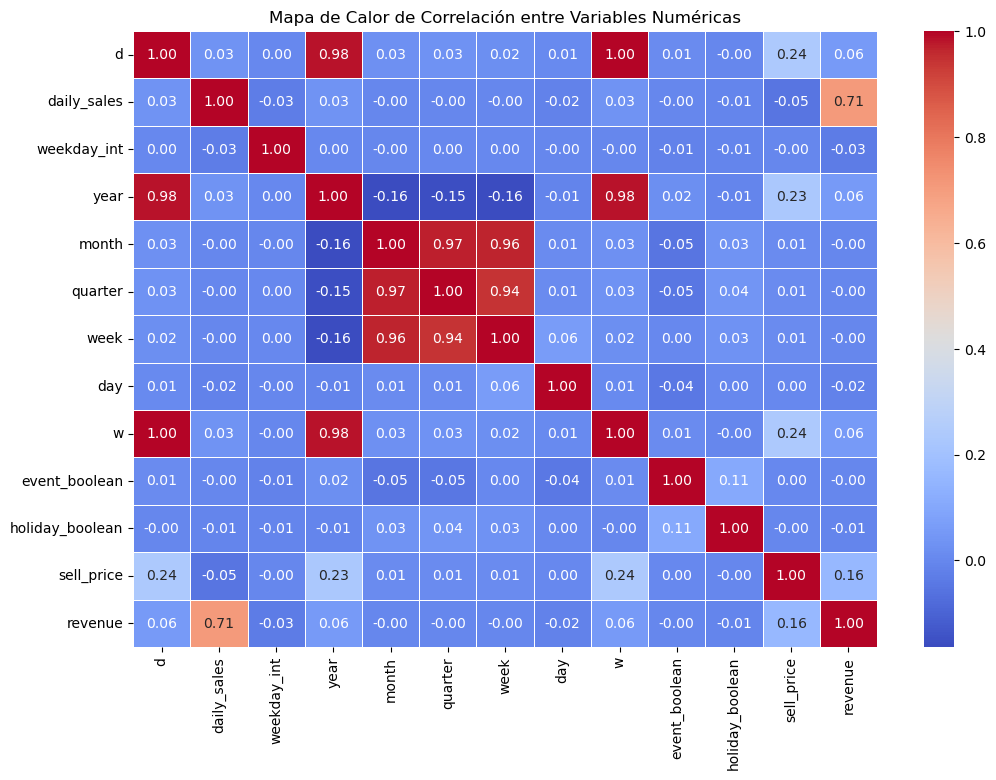

In [ ]:
# Seleccionar solo las columnas numéricas para calcular la correlación
df_numerico = df_total.select_dtypes(include=['number'])

# Calcular la matriz de correlación
correlation_matrix = df_numerico.corr()

# Crear un mapa de calor con Seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)

# Mejorar diseño
plt.title("Mapa de Calor de Correlación entre Variables Numéricas")

# Mostrar gráfico
plt.show()

Con respecto la correlación , no se ha detectado una correlación alta entre variables que no estuvieran relacionadas.

## <h3 style='background:#b4b4b4; border:0; border-radius: 10px; color:black'><center>0.6. EXPORTACIÓN DATOS TRATADOS</center></h2>

Exportación de los datos procesados, descomentar si es necesario exportalos

In [ ]:
# df_total.to_csv('df_total.csv')

In [ ]:
df_total.to_pickle('df_total.pkl')

## <h2 style='background:#4e4e4e; border:0; border-radius: 10px; color:black'><center>RESULTADOS</center></h2>

Los datos proporcionados para este proyecto están formados por: una tabla donde se registran los eventos, una tabla de productos/tienda con registro de diario de sus ventas y una tabla con el precios medios semanal de cada producto/tienda.

En el preprocesamieto de los datos se han observado las siguientes características del dataset de datos utilizado:

- Se cuenta con 6 años de estudio, de los cuales 4 de ellos están completos. El primer año, el mes de enero no se encuentra registrado y su último año solo cuenta con datos hasta abril. El número de días registrados son de 1913 (Fecha minima: 2011/01/29 - Fecha máxima: 2016/04/24), no se ha encontrado en el dataset fechas con falta de recogida de datos. No se ha encontrado ningún valor duplicado ni error en las fechas. Los nulos existentes son aquellos días que no hay eventos.

- Con respecto los eventos se han registrado 5 tipo ('SuperBowl', 'Ramadan starts', 'Thanksgiving', 'NewYear', 'Easter'), el más usual es el de la Superbowl.

- En la tabla de precios, se recogen las semanas del año para registrar los precios medios semanales. Se recogen los datos diferenciados por tienda y producto. La dispersión de los datos en este conjunto es amplia, reflejando una distribución altamente asimétrica. El valor mínimo registrado es 0.1, mientras que el máximo alcanza 134.15, lo que indica una gran variabilidad en los datos. Dado el amplio rango intercuartílico (Q3 - Q1 = 72.55), se puede inferir que los datos presentan una gran dispersión y posibles valores atípicos en la cola superior de la distribución. Las columnas categóricas se han revisado para comprobar que no hay errores tipográficos que puedan dar una inconsistencia en los datos, asegurando la calidad y estandarización de los datos. Se observa que los datos recopilados por tienda son similares y no hay un desbalanceo de los datos recogidos. Se ha observado que todos los valores duplicados tienen la columna yearweek nula. También se ha localizado un 0.4% de nulos adicionales en esa columna.

-  Se cuenta con un total de 3049 artículos vendidos en 10 tiendas, distribuidas en 3 ciudades (BOSTON - 3 tiendas, NUEVA YORK - 4 tiendas y  FILADELFIA - 3 tiendas). Estos artículos están divididos en 3 categorías, a su vez estas están dividas en 7 departamentos:
    + SUPERMARKET (1473 artículos asociados)--> SUPERMARKET_1 - 216 artículos, SUPERMARKET_2 - 398 artículos, SUPERMARKET_3 - 823 artículos
    + HOME&GARDEN (1047 artículos asociados)--> HOME&GARDEN_1 - 532 artículos, HOME&GARDEN_2 - 515 artículos
    + ACCESORIES (565 artículos asociados)--> ACCESORIES_1 - 416 artículos, ACCESORIES_2 - 149 artículos

- En la tabla de sales, se recogen por fila el producto por tienda. Las ventas se representan en columna por día por producto/tienda. Al igual que en la tabla de precios, se comprueban las columnas categóricas para revisar errores tipográficos y asegurar la calidad de los datos. Se comprueba también que todos los productos estén registrados en todas las tiendas. No existen duplicados, ni valores nulos.

Las operaciones realizadas en el procesamiento de datos han sido las siguientes:

+ **Tabla price**:
    - Creación del campo `id` , para posteriormente unirlo con la tabla de sales.
    - Optimización de las columnas, las categóricas  `'category', 'store_code', 'departament'` se cambian a category.
    - Eliminación de registros duplicados y nulos.


+ **Tabla event**:
    - Para poder relacionar el precio medio semanal con las ventas en la tabla de sales, es necesario sacar el yearweek para cada día registrado. El campo yearweek en la tabla de prices no sigue el estándar ISOCALENDAR, sino que inicia la semana los sábados y asigna 00 a aquellas semanas con días del año anterior al cambiar de año, comenzando en 01 para aquellos días que si que pertenecen al año nuevo. Para alinear los datos correctamente, se creó un DataFrame df_days con días de referencia en intervalos de 7 días, al que se le asignó una lista ordenada de yearweek excluyendo las semanas 00. Luego, se realizó un merge con la tabla de event y se rellenaron valores nulos con la última semana válida mediante ffill(), asegurando una correcta correspondencia de semanas en los análisis posteriores.

+ **Tabla sales**:
    - Se ha pivotado la tabla para tener registro de venta diaria por producto/tienda. Se ha pasado de tener una dimensión de 30.490 filas a 58M de filas.
    - Se crean las siguientes columnas adicionales:
        -   Event, event_boolean: Para añadir los eventos ocurridos en el periodo de ventas. Event_boolean se ha creado para transformar el evento a un valor que entienda los modelos de predicción.
        -   year, week, quarter, week, day: Esto permite un análisis más granular de las ventas por diferentes periodos de tiempo (año, semana, mes, trimestre y día).
        -   w : determina la semana relativa del histórico de datos.
        -   holiday, holiday_boolean: Para añadir los festivos ocurridos en el periodo de ventas por región. holiday_boolean se ha creado para transformar el evento a un valor que entienda los modelos de predicción.
    - Optimización del dataset según la tipología de columnas.
        -   categorical = ['category', 'department', 'store', 'store_code', 'region', 'weekday','event','boolean']
        -   string = ['item', 'yearweek']
        -   integer =['daily_sales', 'year', 'month', 'day', 'd', 'w','event_boolean','holiday_boolean']

+ Adicionalmente, se ha añadido una **tabla holidays** con el registro de los días festivos, tanto del país como locales de las ciudades donde se encuentran las tiendas analizadas.

+ Finalmente, se ha creado un dataset con los datos postprocesados, en el cual se ha unido los precios medios semanales por producto/tienda de la tabla prices. Rellenando los precios nulos (semanas que no se han vendido los productos) con 0 y  comprobando que no se vendieron ningún producto en esas semanas, siendo un 20% del total de datos. En este nuevo dataset, se ha creado el campo `revenue` para saber las ganancias (ventas*precio). Este dataset serán los datos de partida para el análisis exploratorio de los dato (EDA).

# <h1 style='background:#b1b1b1; border:0; border-radius: 10px; color:black'><center>T1. EDA</center></h1>

## <h2 style='background:#4e4e4e; border:0; border-radius: 10px; color:black'><center>OBJETIVOS</center></h2>

El análisis exploratorio de datos permite comprender el comportamiento de las ventas y optimizar la gestión del negocio de manera estratégica. Uno de los aspectos clave es conocer cómo se comportan las ventas a lo largo del tiempo. Esto implica identificar cuáles son los productos más vendidos y cuáles tienen menor rotación, permitiendo a los gerentes y responsables de compras tomar decisiones sobre qué productos deben mantenerse en stock y cuáles podrían ser retirados o promocionados. Además, se analiza la variación de las ventas en diferentes periodos, como a nivel diario, semanal o mensual, con el objetivo de detectar patrones de consumo y prever la demanda.

Otro aspecto fundamental en la gestión es la optimización del inventario. Un análisis detallado de las ventas y los patrones de compra permite prever la demanda de cada producto, evitando así problemas como el desabastecimiento o el exceso de stock. La falta de productos en los estantes puede generar pérdida de clientes y afectar la reputación del negocio, mientras que el exceso de inventario representa un costo innecesario y puede llevar a pérdidas económicas si los productos perecederos no se venden a tiempo. Identificar aquellos productos con baja rotación también es crucial para tomar decisiones sobre promociones, cambios en la estrategia de precios o incluso la eliminación de ciertos artículos del catálogo.

El análisis de precios y promociones es otro componente esencial dentro del análisis de datos en un supermercado. Evaluar el impacto de descuentos y ofertas permite entender si realmente se están generando mayores ingresos o si la reducción de precios no se traduce en un aumento significativo de la demanda. Además, comparar diferentes estrategias de precios ayuda a optimizar la rentabilidad, encontrando el equilibrio entre precios atractivos para los clientes y márgenes de ganancia sostenibles para el negocio.

En resumen, el análisis exploratorio de datos en un supermercado es una herramienta poderosa que permite mejorar la toma de decisiones en diversas áreas del negocio. Desde conocer el comportamiento de las ventas hasta optimizar el inventario, analizar precios y promociones, cada uno de estos aspectos contribuye a mejorar la rentabilidad. Con un enfoque basado en datos, los supermercados pueden optimizar sus operaciones y mantenerse competitivos en un mercado en constante evolución.

Cabe destacar que la ausencia de datos de enero en 2011 y la limitación de datos en 2016 (con solo cuatro meses) requieren cautela al interpretar la evolución en esos años. Sin embargo, en el resto del período, la información se muestra completa y consistente.

In [21]:
df_total = pd.read_pickle(r'C:\Users\crist\Documents\GitHub\nuclioDataScience24\ENTREGABLES\Proyecto final\df_total.pkl')


## <h3 style='background:#b4b4b4; border:0; border-radius: 10px; color:black'><center>1.1. ANÁLISIS DE LOS ARTÍCULOS</center></h3>

El análisis de las unidades vendidas permite observar tanto tendencias generales como comportamientos particulares entre los productos recurrentes y los variables.

### Resumen general

+ Nº Total productos vendido (HISTÓRICO)

In [ ]:
print(f"Nº de Productos vendidos en toda la historia: {df_total.daily_sales.sum()}")

Nº de Productos vendidos en toda la historia: 65695409


+ Nº Total productos vendido (POR AÑO Y VARIACIÓN ANUAL)

El segundo año el de mayor crecimiento de las ventas (36,2% se tiene que tener en cuenta que no tenemos datos del mes de enero de 2011), en 2014 el total ventas disminuyen un 0,4 % recuperándose en 2015 con un 5,4%. El año 2016, no se puede realizar la comparativa con otros años, ya que solo se tiene los primeros 4 meses del año.

In [ ]:
df_total.groupby('year').daily_sales.sum().reset_index()\
    .rename(columns={'daily_sales': 'total_sales'})\
    .assign(total_sales=lambda df: df['total_sales'] / 1_000_000)\
    .assign(pct_variation=lambda df: df['total_sales'].pct_change() * 100)\
    .assign(text=lambda df: df.apply(lambda row: f"{row['total_sales']:.2f}M ({row['pct_variation']:.1f}%)" if not pd.isna(row['pct_variation']) else f"{row['total_sales']:.2f}M", axis=1))\
    .plot(kind='bar', x='year', y='total_sales', title='Total de productos vendidos por AÑO (variación anual)', text="text")

+ Nº Total productos vendido (POR REGIÓN)

Se observa una diferencia significativa entre New York y las demás regiones, lo que indica que esta región tiene una mayor demanda o una estrategia de ventas más efectiva.
La diferencia entre Boston y Philadelphia es menor, lo que sugiere un comportamiento de ventas similar entre estas dos regiones.

In [ ]:
df_total.groupby(['region']).daily_sales.sum().reset_index()\
    .rename(columns={'daily_sales': 'total_sales'})\
    .plot(kind='bar', x='region', y='total_sales',color = 'region',title='Total de productos vendidos por REGIÓN', text="total_sales")

+ Nº Total productos vendido (POR REGIÓN Y AÑO)

Se sigue observado una diferencia clara entre New York y las demás regiones en todos los años, confirmando que esta región tiene una mayor demanda o una estrategia de ventas más efectiva.

En la gran parte de años y regiones se observa que un crecimiento de las ventas, exceptuando en 2014 para la región de Boston. Destaca el crecimiento del primer año en todo las regiones, superando el 30% en todos los casos. Cabe destacar que las variación anual máxima se da en Philadelphia en todos los años registrados.

In [ ]:
df_total.groupby(['region','year']).daily_sales.sum().reset_index()\
    .rename(columns={'daily_sales': 'total_sales'})\
    .assign(total_sales=lambda df: df['total_sales'] / 1_000_000)\
    .assign(pct_variation=lambda df: df.groupby('region')['total_sales'].pct_change() * 100)\
    .assign(year = lambda df:df["year"].astype(str))\
    .assign(text=lambda df: df.apply(lambda row: f"{row['total_sales']:.2f}M ({row['pct_variation']:.1f}%)" if not pd.isna(row['pct_variation']) else f"{row['total_sales']:.2f}M", axis=1))\
    .plot(kind='bar', x='region', y='total_sales',color = 'year',barmode='group' ,title='Total de productos vendidos por REGIÓN/AÑO',text="text")

+ Nº Total productos vendido (POR REGION/TIENDA)

La tienda con mayores ventas históricas es Tribeca (New York), seguido de Green Village (New York) y Roxbury (Boston). Filadelfia y Boston tienen ventas similares, aunque Boston muestra una distribución más equitativa entre las tiendas. South End y Back Bay en Boston tienen ventas similares, lo que sugiere una competencia equilibrada entre ambas tiendas en esa región.

In [ ]:
df_total.groupby(['region','store']).daily_sales.sum().reset_index()\
    .rename(columns={'daily_sales': 'total_sales'})\
    .assign(total_sales=lambda df: df['total_sales'] / 1_000_000)\
    .assign(text=lambda df: df.apply(lambda row: f"{row['total_sales']:.2f}M", axis=1))\
    .plot(kind='bar', x='region', y='total_sales', color= 'store',title='Total de productos vendidos por REGIÓN, desglosado por TIENDA (en Millones)', text="text")

In [ ]:
df_total.groupby(['region','store']).daily_sales.sum().reset_index()\
    .rename(columns={'daily_sales': 'total_sales'})\
    .assign(total_sales=lambda df: df['total_sales'] / 1_000_000)\
    .assign(text=lambda df: df.apply(lambda row: f"{row['total_sales']:.2f}M", axis=1))\
    .plot(kind='bar', x='store', y='total_sales', color= 'region',title='Total de productos vendidos por TIENDA (en Millones)', text="text")

+ Nº Total productos vendido (POR REGION/TIENDA x AÑO)

La tienda de Tribeca es la que despunta dodos los años. En 2011 y 2012, la siguen las tiendas de Greenwich, Queen y Roxbury con valores alrededor del 1M-1.5M de productos, respectivamente. A partir de 2013, Queen reduce sus ventas y se mete en el grupo Yorktown con valores semejante a Greenwich y Roxbury. Finalmente en 2015, el top 3 esta formado por Tribeca, Greenwich y Yorktown. el resto de tiendas tiene unos valores similares.  

Brooklyn es la tienda con menores ventas anuales en el histórico.

La gráfica evidencia que, a pesar de la variación entre tiendas, existe una tendencia general al alza de 2011 a 2015. Se puede destacar las siguientes variaciones:

    - En 2011-12, se observan las variaciones anuales mas altas en general (aprox. 30-39%) y en particular Yorktown con un 79%
    - En 2012-13, se suaviza la venta de productos y se produce un crecimiento moderado (aprox. 5-10%), exceptuando la tiendas de Midtown y Yorktown que alcanza un crecimiento mayor de 35% y Queen que registra una caída en las ventas del 16%
    - En 2013-14, se reduce el crecimiento de las tiendas con una variación media de 2%, este año se produce una caída en las ventas en las tiendas de Harlem, Roxbury y Queen por segundo año consecutivo.
    - Finalmente entre 2014-15, vuelve a tener todas las tiendas un crecimiento bajo en las ventas ( 6de las 10 tiendas aumentan alrededor del 3% mientas que el resto alcanza un máximo del 19,4%)


In [ ]:
df_var_store_year = df_total.groupby(['store','year']).daily_sales.sum().reset_index()\
    .rename(columns={'daily_sales': 'total_sales'})\
    .assign(total_sales=lambda df: df['total_sales'] / 1_000_000)\
    .assign(pct_variation=lambda df: df.groupby('store')['total_sales'].pct_change() * 100)\
    .assign(text=lambda df: df.apply(lambda row: f"{row['total_sales']:.2f}M ({row['pct_variation']:.1f}%)" if not pd.isna(row['pct_variation']) else f"{row['total_sales']:.2f}M", axis=1))
df_var_store_year = df_var_store_year.pivot_table(index='store', columns='year', values='pct_variation')

# Crear heatmap con Plotly Express
fig = px.imshow(df_var_store_year.iloc[:, :-1] ,
                labels=dict(x="Año", y="Tienda", color="Valor"),
                x=df_var_store_year.iloc[:, :-1].columns,
                y=df_var_store_year.index,
                color_continuous_scale="RdBu_r",
                range_color=[-100,100],title='Variación anual de productos vendidos por TIENDA')  # Escala de colores de rojo a azul

# Mostrar gráfico
fig.show()

In [ ]:
df_total.groupby(['store','year']).daily_sales.sum().reset_index()\
    .rename(columns={'daily_sales': 'total_sales'})\
    .assign(total_sales=lambda df: df['total_sales'] / 1_000_000)\
    .assign(pct_variation=lambda df: df.groupby('store')['total_sales'].pct_change() * 100)\
    .assign(text=lambda df: df.apply(lambda row: f"{row['total_sales']:.2f}M", axis=1))\
    .plot(kind='bar', x='year', y='total_sales',  color= 'store',  title='Total de productos vendidos por TIENDA/AÑO (en Millones)', text="text",
        barmode='group')

+ Nº Total productos vendido (POR CATEGORÍA)

Se observa que la categoría más vendida es SUPERMARKET, con aproximadamente 45 M de ventas, seguida de HOME&GARDEN con alrededor de 14,48M, y finalmente ACCESORIES, que registra ventas diarias de 6,12M. Nos permite identificar qué la categoría tienen un mayor impacto en las ventas totales.

In [ ]:
df_total.groupby(['category', 'item'], observed=True)['daily_sales'].sum().reset_index() \
    .rename(columns={'daily_sales': 'total_sales'}) \
    .groupby('category', observed=True)['total_sales'].sum().reset_index() \
    .assign(total_sales=lambda df: df['total_sales'] / 1_000_000)\
    .assign(text=lambda df: df.apply(lambda row: f"{row['total_sales']:.2f}M", axis=1))\
    .plot(kind='bar', x='category', y='total_sales', color='category', text='text',  title='Total productos vendidos por CATEGORÍA (en Millones)')


+ Nº Total productos vendido (POR CATEGORÍA x AÑO)

A continuación se muestra como ha evolucionado estas categorías durante todos los años. Como se observa, todas las categorías han tenido una tendencia positiva. Destaca la categoría de SUPERMARKET, seguidos por HOME&GARDEN y la categoría con menor venta anual.

    - Se observa que para la categoría SUPERMARKET, excepto el primer año que aumenta un 38% el resto de años no supera al 4%. El mínimo de variación positiva es del 0.05 en  2014  

    - La categoría HOME&GARDEN, la variación con respecto el primer año alcanza hasta el 47% y el resto varia entre 20-15%, exceptuando el 2014 que disminuye un <1%

    - La categoría ACCESORIES, la variación con respecto el primer año alcanza es baja (2%) y el resto varia entre 20-25%, exceptuando el 2014 que disminuye un 2%.

In [ ]:
df_total.groupby(['category', 'item', 'year'], observed=True)['daily_sales'].sum().reset_index() \
    .rename(columns={'daily_sales': 'total_sales'}) \
    .groupby(['category','year'], observed=True)['total_sales'].sum().reset_index() \
    .assign(total_sales=lambda df: df['total_sales'] / 1_000_000)\
    .assign(text=lambda df: df.apply(lambda row: f"{row['total_sales']:.2f}M", axis=1))\
    .plot(kind='bar', x='year', y='total_sales', color='category', text='text',  title='Total productos vendidos por CATEGORÍA/AÑO (en Millones)',barmode='group')

In [ ]:
df_var_category_year = df_total.groupby(['category', 'item', 'year']).daily_sales.sum().reset_index()\
    .rename(columns={'daily_sales': 'total_sales'})\
    .groupby(['category','year'], observed=True)['total_sales'].sum().reset_index() \
    .assign(total_sales=lambda df: df['total_sales'] / 1_000_000)\
    .assign(pct_variation=lambda df: df.groupby('category')['total_sales'].pct_change() * 100)\
    .assign(text=lambda df: df.apply(lambda row: f"{row['total_sales']:.2f}M ({row['pct_variation']:.1f}%)" if not pd.isna(row['pct_variation']) else f"{row['total_sales']:.2f}M", axis=1))
df_var_category_year = df_var_category_year.pivot_table(index='category', columns='year', values='pct_variation')

# Crear heatmap con Plotly Express
fig = px.imshow(df_var_category_year.iloc[:, :-1] ,
                labels=dict(x="Año", y="Categoria", color="Valor"),
                x=df_var_category_year.iloc[:, :-1].columns,
                y=df_var_category_year.index,
                color_continuous_scale="RdBu_r",
                range_color=[-100,100],title='Variación anual de productos vendidos por CATEGORÍA')  # Escala de colores de rojo a azul

# Mostrar gráfico
fig.show()

+ Nº Total productos vendido (POR DEPARTAMENTO)

El valor más alto corresponde a SUPERMARKET_3, con 32,37 M, superando por un margen amplio al resto de departamentos. Le sigue HOME&GARDEN_1, que alcanza los 11,50 M, mientras que SUPERMARKET_2 se sitúa en 7,63 M. Por otro lado, ACCESORIES_1 y SUPERMARKET_1 rondan los 5 M, mientras que HOME&GARDEN_2 y ACCESORIES_2 presentan cifras más modestas, con 2,98 y 0,53 M respectivamente. Este panorama muestra que el canal SUPERMARKET_3 domina las ventas, seguido de cerca por la sección HOME&GARDEN_1, dejando ver diferencias claras entre cada categoría.

In [ ]:
df_total.groupby(['department', 'item'], observed=True)['daily_sales'].sum().reset_index() \
    .rename(columns={'daily_sales': 'total_sales'}) \
    .groupby('department', observed=True)['total_sales'].sum().reset_index() \
    .assign(total_sales=lambda df: df['total_sales'] / 1_000_000)\
    .assign(text=lambda df: df.apply(lambda row: f"{row['total_sales']:.2f}M", axis=1))\
    .plot(kind='bar', x='department', y='total_sales', color='department', text='text',  title='Total productos vendidos por DEPARTAMENTO (en Millones)')


+ Nº Total productos vendido (POR DEPARTAMENTO x AÑO)

A continuación se muestra como ha evolucionado los departamentos durante todos los años. Destaca el departamento de SUPERMARKET_3, este sobresale por su volumen total de ventas en comparación con los demás.

    - En 2011-12: Se produce un crecimiento de ventas alto en los departamento HOME&GARDEN_1 y SUPERMARKET_1 (> 60%), SUPERMARKET_3 (>40%). Mientras que los departamentos de ACCESORIES_2, HOME&GARDEN_2 y SUPERMARKET_2 tiene un crecimiento medio, reflejando un desempeño más estable y sostenible a largo plazo. Se produce una fluctuación minima positiva > 1% en ACCESORIES_1.

    - En 2012-13: En este caso, se puede dividir en dos grupos según su variación de ventas, los departamentos de SUPERMARKET tiene un tendencia de crecimiento leve (<10%), lo que se puede interpretar como una estabilización de las ventas. Los departamentos de ACCESORIES_1 y HOME&GARDEN_1 tiene un crecimiento del > 25 %, se considera un incremento robusto y significativo.

    - En 2013-14: En este periodo en general es un periodo de bajada de ventas al analizarlo de forma generalizada. Pero si observamos los departamentos de ACCESORIES_2, que tiene un crecimiento robusto y significativo del 33%, y HOME&GARDEN_2 y SUPERMARKET_2 que tiene una variación anual de las ventas leve (>10%). El resto de departamentos tiene perdidas leves que no superan el 5% en ningún caso.

    - En 2014-15: Excepto SUPERMARKET_3 que tiene una disminución de ventas del 5%, el resto de departamentos vuelven a tener un crecimiento de sus ventas medio 10 - 25%.


In [ ]:
df_total.groupby(['department', 'item', 'year'], observed=True)['daily_sales'].sum().reset_index() \
    .rename(columns={'daily_sales': 'total_sales'}) \
    .groupby(['department','year'], observed=True)['total_sales'].sum().reset_index() \
    .assign(total_sales=lambda df: df['total_sales'] / 1_000_000)\
    .assign(text=lambda df: df.apply(lambda row: f"{row['total_sales']:.2f}M", axis=1))\
    .plot(kind='bar', x='year', y='total_sales', color='department', text='text',  title='Total productos vendidos por DEPARTAMENTO/AÑO (en Millones)',barmode='group')

In [ ]:
df_var_department_year = df_total.groupby(['department', 'item', 'year']).daily_sales.sum().reset_index()\
    .rename(columns={'daily_sales': 'total_sales'})\
    .groupby(['department','year'], observed=True)['total_sales'].sum().reset_index() \
    .assign(total_sales=lambda df: df['total_sales'] / 1_000_000)\
    .assign(pct_variation=lambda df: df.groupby('department')['total_sales'].pct_change() * 100)\
    .assign(text=lambda df: df.apply(lambda row: f"{row['total_sales']:.2f}M ({row['pct_variation']:.1f}%)" if not pd.isna(row['pct_variation']) else f"{row['total_sales']:.2f}M", axis=1))
df_var_department_year = df_var_department_year.pivot_table(index='department', columns='year', values='pct_variation')

# Crear heatmap con Plotly Express
fig = px.imshow(df_var_department_year.iloc[:, :-1] ,
                labels=dict(x="Año", y="Departamento", color="Valor"),
                x=df_var_department_year.iloc[:, :-1].columns,
                y=df_var_department_year.index,
                color_continuous_scale="RdBu_r",
                range_color=[-100,100],title='Variación anual de productos vendidos por DEPARTAMENTO')  # Escala de colores de rojo a azul

# Mostrar gráfico
fig.show()

### ¿Cuáles son los artículos más vendidos en general?

#### TOP 50 - HISTÓRICO

In [ ]:
df_total.groupby('item')['daily_sales'].sum().sort_values(ascending=False).reset_index().head(50).plot(kind='bar', x='item', y='daily_sales',title ='Top 50 artículos vendidos - histórico',text="daily_sales" )

In [ ]:
list_top50 = df_total.groupby('item')['daily_sales'].sum().sort_values(ascending=False).reset_index().item.head(50)
list_top50_cat=list_top50.apply(lambda x: x.split('_')).apply(lambda x: ['_'.join(x[:2])] + x[2:])
list_top50_cat = list_top50_cat.apply(lambda x: x[0])
count_cat = list_top50_cat.value_counts().reset_index()

# Crear gráfico de pie
fig = px.pie(count_cat,
             names='item',
             values='count',
             title="Distribución de departamentos en el Top 50 de Ventas",
             hole=0.3)  # Puedes ajustar 'hole' para un gráfico tipo donut

# Mostrar gráfico
fig.show()

In [ ]:
# Obtener los 50 artículos más vendidos históricamente
df_top50 = (
    df_total.groupby("item")["daily_sales"]
    .sum()
    .sort_values(ascending=False)
    .reset_index()
    .head(50)
)

# Lista de los 50 productos más vendidos históricamente
top_items = df_top50['item'].tolist()

# Calcular ventas totales por año y producto
df_rank = df_total.groupby(['year', 'item'])['daily_sales'].sum().reset_index()

# Asignar ranking dentro de cada año
df_rank['rank'] = df_rank.groupby('year')['daily_sales'].rank(method="dense", ascending=False)

# Filtrar solo los 10 productos más vendidos históricamente
df_rank_filtered = df_rank[df_rank['item'].isin(top_items)]

# Graficar la evolución del ranking
fig = px.line(
    df_rank_filtered,
    x="year",
    y="rank",
    color="item",
    title="Evolución del Ranking de los 50 Productos Más Vendidos Históricamente",
    markers=True
)

# Invertir eje Y para que el #1 esté arriba
fig.update_yaxes(autorange="reversed", title="Posición en Ventas (1 = más vendido)")
fig.update_xaxes(title="Año")

# Mostrar gráfico
fig.show()

Se observa en la gráfica de las posiciones anuales de los productos **top50 - históricos**, hay varios items que tiene un comportamiento anormal en determinados años. Se procede a revisarlos individualmente.

##### Análisis productos destacados

+ HOME&GARDEN_1_334

El puesto del primer año se debe a que no se vendió hasta abril de 2012. Ese mismo año despunto en los meses de julio y septiembre, el precio se ha mantenido constante desde de julio de 2012. La distribución de las ventas, se observa un pequeño repunte en los primeros meses y un bajada de ventas en el mes de diciembre

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "HOME&GARDEN_1_334")

+ HOME&GARDEN_1_459

Comportamiento similar al producto HOME&GARDEN_1_334

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "HOME&GARDEN_1_459")


+ SUPERMARKET_2_128

Se observa en los dos primero años un crecimiento tanto del precio como del número de unidades, pero a partir del año 2013 se observa una caída de las ventas en los últimos meses del año, sin variar el precio. En años posteriores se observa, como en el primer y último trimestre del año disminuyen las ventas. Con respecto los precios se observa que a partir del 2014, se estable una subida de precio en verano.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_2_128")


+ SUPERMARKET_3_030

En el primer mes, al subir el precio las ventas desciende los 4 primeros mese y a partir de julio 2011, se restablecen las ventas en el rango de 4000 ventas mensuales. La bajada de precio de junio 2013 a marzo de 2014 repercute positivamente en las ventas de los productos, llegando a la venta de 8000 unidades mensaules. Al incrementar el precio al anterior se produce una caida de ventas ( aprox. 2000 ud/mensuales)

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_030")


+ SUPERMARKET_3_120

El primer año del histórico, este producto no estuvo a la venta. Se empezó a vender a partir de enero de 2012, se observa que el incremento del precio en ese año fue paulatino. Al aproximarse a su precio máximo, se observa que las ventas se reducen considerablemente, hasta mínimos históricos. Se comienza a recuperar las ventas a partir de enero de 2013, sufriendo una caída de las ventas en los últimos meses del 2013. A partir de ese momento las ventas es ha mantenido constantes entre 6000-7000 ud/mes.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_120")


+ SUPERMARKET_3_281

Se observa que es un producto que su precio tiene una gran influencia en sus ventas. En el primer año, cuando alcanzan el precio máximo las ventas se reducen considerablemente (llegando a ser menores de 100 ud/mes). Cuando su precio empieza a descender en marzo de 2012 hasta junio, se observa un pico de ventas que llega a los 10k ud/mes. En junio 2012, se produce una subida de precio y vuelven a descender en febrero 2014 las ventas a menos de 5k ud/mes.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_281")


+ SUPERMARKET_3_282

El producto se empieza a vender en Julio de 2013, el precio se mantiene constante desde el 3 mes de venta. En los años posteriores se ve un patrón similar en los datos de venta, hay un pico de ventas en Enero y descienden progresivamente a lo largo del año. Los últimos años están dentro del TOP 10 de ventas.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_282")


+ SUPERMARKET_3_288

La venta de este producto empieza en enero de 2013, el precio se estabiliza en crece hasta alcanzar su valor constante hasta mayo de 2013. Se ve una bajada puntual en junio de los meses de 2014 y 2015

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_288")


+ SUPERMARKET_3_319

Se puede observar de forma generalizada como aumenta las ventas en la temporada de verano y una bajada en los meses de otoño, subiendo progresivamente los mese de invierno excepto en los últimos dos años que se produce una caída en los mese de primavera.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_319")


+ SUPERMARKET_3_412

A partir del tercer año de ventas, las ventas totales anuales del producto desciende manteniendo un patrón mensual parecido en resto de años.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_412")


+ SUPERMARKET_3_541

Es un producto que su pico de ventas se registra en la temporada de verano, pero en el verano de 2015 se puede observar una caída atípica de las ventas en los meses de abril y mayo. Así como, una disminución de las ventas en el pico de verano, esto se produce cuando se da una bajada del precio en el producto respecto los años.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_541")


+ SUPERMARKET_3_587

En los dos primeros años se observa una caída de ventas progresiva al incrementar el precio, hasta alcanzar el máximo. Pero en el primer mes de 2013, se produce una caída repentina de las ventas  que aumenta con la baja del precio. En 2014, se observa como al disminuir el precio cuando se produce una bajada de ventas se produce al mes siguiente una subida. A finales de 2014, se recuperan las ventas de los primeros años.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_587")


+ SUPERMARKET_3_607

El producto se comienza a vender en enero 2012. En los primero 5 meses de venta, se produce un pico de ventas que se reducen a la mitad en la otra mitad del año. En 2013 con la bajada de los precios, se recuperan las ventas a partir de agosto. Manteniéndose hasta el otoño de 2014, que empieza una tendencia de caída que se mantiene hasta ahora.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_607")


+ SUPERMARKET_3_635

Tiene un comportamiento similar a los productos SUPERMARKET_3_635 y SUPERMARKET_3_319, en los primero tres años hay un repunte en los meses de verano que es progresivo, disminuyendo en los mese de otoño. En 2014 se observa como el repunte de verano no alcanza las ventas de los últimos años. En 2015 hay un repunto en el mes de marzo, después disminuye hasta alcanzar valores similares a marzo en los meses de verano. Ya no se observa ese repunte máximo. Con respecto a los precios, se mantiene constante a lo largo del año disminuyendo progresivamente desde su puesta a la venta.


In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_635")


+ SUPERMARKET_3_681

La tendencia de este producto, está muy condicionada a la variación de sus precios. Aumentando las ventas cuando este disminuye. Se observa que la variación del precio no se suele hacer de forma progresiva.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_681")


+ SUPERMARKET_3_714

Un producto con bastante estabilidad, se reconoce un patrón claro en todos los años. Sus ventas aumentan en verano, disminuyendo para finales de años. Su precio ha sido estable, aumentando en los últimos dos años sin que afenten a sus ventas relativamente.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_714")


+ SUPERMARKET_3_723

En los dos primero meses de 2011, se produjeron unas ventas mínimas que descendieron hasta valores nulos hasta septiembre de ese año (se ha comprobado que estaba en venta porque en todas las tiendas entre esos meses, se ha obtenido un precio semanal de 1,5). Se observa que la variación del precio afecta a la ventas. Cuando el precio no varía en todo el año como puede verse en 2014 y 2015, se observa el mismo patrón.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_723")


In [ ]:
df_total.query('item == "SUPERMARKET_3_723"').query('year == 2011').query('month < 8').plot (x = "yearweek", y = "sell_price", kind = "line", color='store', title = "Precio de SUPERMARKET_3_723 entre enero-agosto 2011")

+ SUPERMARKET_3_752

Se observa que los últimos años han bajado las ventas, no superando los 4k producto vendidos en ningún mes como en los primeros dos años. En esos últimos años no ha variado le precio.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_752")


+ SUPERMARKET_3_764

Se inicia su venta en septiembre de 2011, el precio se mantiene constante a lo largo de los años.  El año 2012, es donde se produce el máximo de ventas. En 2013, se produce una caída de ventas relevante en los meses de marzo y abril, recuperando hasta los 4k en ventas. En 2014 se mantiene constante, pero en 2015 no se producen ventas a lo largo de todo el año, excepto en los últimos meses.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_764")


+ SUPERMARKET_3_808

Tiene un comportamiento similar a los productos SUPERMARKET_3_319 , SUPERMARKET_3_635 y SUPERMARKET_3_541. Picos de ventas en verano, caída en otoño y recuperación en invierno/primavera. A partir de 2015 cambian las tendencia y el pico de verano se iguala al mes de marzo, en el periodo intermedio sufre un descenso considerable de las ventas.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_808")


+ SUPERMARKET_3_811

El puesto del primer año se debe a que no se vendió hasta enero de 2012. Ese mismo año despunto en el ultimo mes de verano y primeros de otoño, el precio se ha mantenido constante desde de octubre de 2012. La distribución de las ventas, se observa despuntes en los meses de verano, peor en 2015 cambia a un aumento más progresivo pero se da una caída relevante respecto los otros años en el último mes de verano.

In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_811")


#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

Los productos que destacan son SUPERMARKET_3_090 Y SUPERMARKET_3_586, lso cuales tienen ventas significativamente más altas en comparación con el resto. Después de las primeras 5 categorías, las ventas muestran una disminución constante. Las últimas categorías en la lista tienen valores cercanos a 200,000 - 300,000, lo que representa una diferencia considerable con respecto a las primeras posiciones.

Al representar, las categorías de este TOP50, se observa que la totalidad de los productos son del departamento SUPERMARKET_3 y categoría SUPERMARKET.

🔎 Recomendaciones

    + Profundizar en las categorías más exitosas: entender qué factores contribuyen a su alto rendimiento.
    + Revisar la estrategia de las categorías con menor desempeño: analizar si es un problema de demanda, precios, disponibilidad o promoción.
    + Realizar comparaciones temporales: para ver si esta tendencia se mantiene en el tiempo o si hay variaciones estacionales.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

#### TOP 10 - AÑO

In [ ]:
for year in df_total.year.unique():
    display(df_total[df_total.year==year].groupby('item')['daily_sales']
            .sum().sort_values(ascending=False).reset_index().head(10)
            .plot(kind='bar', x='item', y='daily_sales',title ='Top 10 artículos vendidos - '+str(year),text="daily_sales"))

In [ ]:
# Agrupar ventas por producto y año
annul_sales = df_total.groupby(['year', 'item'])['daily_sales'].sum().reset_index()
# Asignar ranking dentro de cada año
annul_sales['position'] = annul_sales.groupby('year')['daily_sales'].rank(method='dense', ascending=False).astype(int)
annul_sales.rename(columns={'daily_sales': 'total_sales'}, inplace=True)
annul_sales['var_annual_%'] = annul_sales.groupby('item')['total_sales'].pct_change() * 100

##### Análisis productos destacados

`AÑO 2011`

+ SUPERMARKET_3_150

 El año 2011, es donde se produce el máximo de ventas, cuando el precio estaba en su punto más bajo. Al subir los precios en agosto 2011 se produce una caída en las ventas progresiva hasta agosto de 2013 que parece elevar sus ventas con una mínima bajada del precio a mediados de año. El año 2014, tiene el mismo patron de ventas y modificación de precios, pero no alcanza los máximos de septiembre. En 2015, las ventas caen a mínimos históricos no superando la venta de 100 ud/mes. El inicio de 2016, con las bajada de precio parece establecer las compras en las medias de 2014.

 Como observamos en el resumen anual, que su posición es muy variable según el año solo entra en el top 10 en el primer año puede darse por aumentar sus ventas dado el precio bajo que tuvo hasta finalizar el verano

In [ ]:
annul_sales.query('item == "SUPERMARKET_3_150"')

,year,item,total_sales,position,var_annual_%
2374,2011,SUPERMARKET_3_150,62816,8,NaN
5423,2012,SUPERMARKET_3_150,40145,38,-36.091
8472,2013,SUPERMARKET_3_150,17640,143,-56.059
11521,2014,SUPERMARKET_3_150,15364,160,-12.902
14570,2015,SUPERMARKET_3_150,156,2415,-98.985
17619,2016,SUPERMARKET_3_150,11411,38,7214.744


In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_150")


+ SUPERMARKET_2_360

En los dos primero años tienen una tendencia similar, tanto las ventas como los precios exceptuando el mes de abril 2012 que hay una caída de ventas a la mitad por una subida más fuerte del precio. En los últimos tres años se observa como sus ventas al inicio y al fin del año disminuyen al mínimo y se centralizan de marzo a septiembre.

In [ ]:
annul_sales.query('item == "SUPERMARKET_2_360"')

,year,item,total_sales,position,var_annual_%
2186,2011,SUPERMARKET_2_360,62546,9,NaN
5235,2012,SUPERMARKET_2_360,67020,13,7.153
8284,2013,SUPERMARKET_2_360,55035,16,-17.883
11333,2014,SUPERMARKET_2_360,28193,59,-48.773
14382,2015,SUPERMARKET_2_360,35176,33,24.769
17431,2016,SUPERMARKET_2_360,9149,54,-73.991


In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_2_360")


+ SUPERMARKET_3_080

Los dos primeros años se observa que las ventas son similares. También se puede observar como disminuye progresivamente las ventas anuales en los años sucesivos, pero el patrón de las ventas es similar en todos los años. La variación del precio no afecta a la tendencia de sus ventas.

In [ ]:
annul_sales.query('item == "SUPERMARKET_3_080"')

,year,item,total_sales,position,var_annual_%
2304,2011,SUPERMARKET_3_080,57886,10,NaN
5353,2012,SUPERMARKET_3_080,57571,18,-0.544
8402,2013,SUPERMARKET_3_080,49491,24,-14.035
11451,2014,SUPERMARKET_3_080,44785,22,-9.509
14500,2015,SUPERMARKET_3_080,40902,23,-8.670
17549,2016,SUPERMARKET_3_080,12015,32,-70.625


In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_080")


`AÑO 2012`

Los datos han sido graficados y explicados en las excepciones encontradas en el TOP50
+ SUPERMARKET_1_218: bastante variabilidad en las ventas anuales (excepto en los últimos dos años completos) y sus posiciones, su mejor año fue 2012.
+ SUPERMARKET_3_635: durante los 4 primeros años se encuentra en el TOP 15, las ventas anuales máximas se dan 2013.  En 2015, se redujo un 45% de las ventas del año anterior.


In [ ]:
annul_sales.query('item == "SUPERMARKET_1_218"')

,year,item,total_sales,position,var_annual_%
1826,2011,SUPERMARKET_1_218,27414,42,NaN
4875,2012,SUPERMARKET_1_218,69045,9,151.860
7924,2013,SUPERMARKET_1_218,38478,41,-44.271
10973,2014,SUPERMARKET_1_218,41932,26,8.977
14022,2015,SUPERMARKET_1_218,45478,15,8.457
17071,2016,SUPERMARKET_1_218,12247,30,-73.070


In [ ]:
annul_sales.query('item == "SUPERMARKET_3_635"')

,year,item,total_sales,position,var_annual_%
2859,2011,SUPERMARKET_3_635,50102,15,NaN
5908,2012,SUPERMARKET_3_635,68401,10,36.523
8957,2013,SUPERMARKET_3_635,72148,11,5.478
12006,2014,SUPERMARKET_3_635,53952,13,-25.220
15055,2015,SUPERMARKET_3_635,29656,49,-45.033
18104,2016,SUPERMARKET_3_635,7875,77,-73.446


`AÑO 2013`

+ SUPERMARKET_3_318:

Repunte de ventas entre 2012 y 2013 aumenta el 87% comparado con el primer año, el resto de los años se encuentra 40-30 k aproximadamente reduciendo las ventas en un 50% aproximadamente. En febrero de 2011, hubo un pico de ventas, pero desde marzo a septiembre de 2011 no se ha vendido nada. Comparando el precio/ventas en este año se ve como al aumentar el precio aumenta las ventas. En 2013, se produce una bajada de precio acompañada con un pico de ventas siendo el año con mayor ventas anuales. Al subir el precio en el 2014, se produce una disminución importante de las ventas (49.8%) con respecto el año anterior. El 2015 sigue disminuyendo pero solo un 21%

In [ ]:
annul_sales.query('item == "SUPERMARKET_3_318"')

,year,item,total_sales,position,var_annual_%
2542,2011,SUPERMARKET_3_318,36272,24,NaN
5591,2012,SUPERMARKET_3_318,68041,11,87.585
8640,2013,SUPERMARKET_3_318,76014,7,11.718
11689,2014,SUPERMARKET_3_318,38130,39,-49.838
14738,2015,SUPERMARKET_3_318,29870,47,-21.663
17787,2016,SUPERMARKET_3_318,12271,29,-58.919


In [ ]:
plot_sales_and_price_parallel_faceted(df_total, "SUPERMARKET_3_318")


Los datos han sido graficados y explicados en las excepciones encontradas en el TOP50
+ SUPERMARKET_3_808: durante los 4 primeros años se encuentra en el TOP 20, las ventas anuales máximas se dan 2013.  Los años sucesivos disminuyeron las ventas un 29% en los dos años posteriores.


In [ ]:
annul_sales.query('item == "SUPERMARKET_3_808"')

,year,item,total_sales,position,var_annual_%
3029,2011,SUPERMARKET_3_808,41721,18,NaN
6078,2012,SUPERMARKET_3_808,65569,17,57.161
9127,2013,SUPERMARKET_3_808,75226,10,14.728
12176,2014,SUPERMARKET_3_808,53173,14,-29.316
15225,2015,SUPERMARKET_3_808,37427,28,-29.613
18274,2016,SUPERMARKET_3_808,8763,58,-76.586


`AÑO 2014`

Los datos han sido graficados y explicados en las excepciones encontradas en el TOP50
+ SUPERMARKET_3_607: bastante variabilidad en las ventas anuales y sus posiciones, su mejor año fue 2014.
+ SUPERMARKET_3_635: los dos primeros años, no se ha vendido los productos. Se observa un crecimiento del 101% respecto el primer año de venta que se mantienen en el siguiente (dentro del TOP10)

In [ ]:
annul_sales.query('item == "SUPERMARKET_3_607"')

,year,item,total_sales,position,var_annual_%
2831,2011,SUPERMARKET_3_607,0,1620,NaN
5880,2012,SUPERMARKET_3_607,50480,23,inf
8929,2013,SUPERMARKET_3_607,36038,46,-28.609
11978,2014,SUPERMARKET_3_607,82169,4,128.007
15027,2015,SUPERMARKET_3_607,42113,19,-48.748
18076,2016,SUPERMARKET_3_607,11794,34,-71.994


In [ ]:
annul_sales.query('item == "SUPERMARKET_3_282"')

,year,item,total_sales,position,var_annual_%
2506,2011,SUPERMARKET_3_282,0,1620,NaN
5555,2012,SUPERMARKET_3_282,0,1978,NaN
8604,2013,SUPERMARKET_3_282,33005,55,inf
11653,2014,SUPERMARKET_3_282,66582,10,101.733
14702,2015,SUPERMARKET_3_282,63006,10,-5.371
17751,2016,SUPERMARKET_3_282,24198,7,-61.594


`AÑO 2015`

Los datos han sido graficados y explicados en las excepciones encontradas en el TOP50
+ SUPERMARKET_3_120: el primer año no se vendió el producto,  los últimos años aumentas las ventas aproximadamente el 40%
+ SUPERMARKET_3_282: explicado en el apartado anterior.


In [ ]:
annul_sales.query('item == "SUPERMARKET_3_120"')

,year,item,total_sales,position,var_annual_%
2344,2011,SUPERMARKET_3_120,0,1620,NaN
5393,2012,SUPERMARKET_3_120,50935,22,inf
8442,2013,SUPERMARKET_3_120,45968,30,-9.752
11491,2014,SUPERMARKET_3_120,65194,11,41.825
14540,2015,SUPERMARKET_3_120,94404,4,44.805
17589,2016,SUPERMARKET_3_120,26603,5,-71.820


#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

Los productos SUPERMARKET_3_090 Y SUPERMARKET_3_586 se encuentran todos los años entre el TOP3 de productos. El SUPERMARKET_3_252 forma parte de ese TOP 3, exceptuando el primer año que se encuentra en el puesto 4 del ranking.

Hay otros que suben y bajan en el ranking, lo que indica cambios en las preferencias de los consumidores a lo largo de los años.  Se realizará un análisis de aquellos productos que aparecen esporádicamente en el TOP 10 para ver posibles causas.

En todos los años, la categoría por excelencia en este TOP 10 es SUPERMARKET (SUPERMARKET_3), exceptuando los departamento en los años 2011 (entra en el TOP 10 un producto del SUPERMARKET_2) y en 2012 (entra en el TOP 10 un producto del SUPERMARKET_1)

🔎 Recomendaciones

    + Podría ser interesante analizar si hay patrones estacionales en las ventas.
    + También podrías revisar si hay una correlación con campañas publicitarias, promociones o cambios de precios que puedan haber afectado el ranking de los productos.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### ¿Cuáles son los artículos más vendidos por región?


#### TOP 10 / REGIÓN - HISTÓRICO

In [ ]:
for region in df_total.region.unique():
    display(df_total[(df_total.region==region)].groupby(['item'])['daily_sales']
            .sum().sort_values(ascending=False).reset_index().head(10)
            .plot(kind='bar', x='item', y='daily_sales',title ='Top 10 articulos  - '+region, text="daily_sales"))

Se realiza un análisis la posición anual en el ranking de los producto englobados en el TOP10 por región.

In [ ]:
resume_top10_historical (df_total,df_total.region.unique().to_list(), 'region')

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

> NEW YORK

New York presenta la cifra de ventas más alta en su producto líder, con alrededor de 486k, casi el doble que el segundo lugar (~318k). Esto sugiere un fuerte producto dominante y una diferencia notable entre el primer puesto y el resto. El líder se mantiene en el primer puesto a lo largo de los años. La gran parte de productos mantienen posiciones con fluctuaciones moderadas. Sin embargo, se aprecian caídas abruptas en productos como SUPERMARKET_3_587 en 2013, volviendo a recuperar una posición similar a antes de la caída en 2014.

> BOSTON

Como en el caso anterior también su producto líder destacado con ~455k, pero la brecha respecto al segundo lugar (~329k) es algo menor que la observada en New York. se puede observar como tiene un volumen algo menor que New York. l líder se mantiene en el primer puesto a lo largo de los años. La gran parte de productos mantienen posiciones con fluctuaciones moderadas, unicamente existe un producto con descenso drásticos y recuperación de posición al siguiente año. Refleja un TOP10 bastante competitivo y sujeto a bajas fluctuaciones.

> PHILADELPHIA

Registra cifras de ventas más bajas en su primer lugar, pero mantiene un ranking relativamente estable en la mayoría de sus productos, con una sola excepción de caída/recuperación muy abrupta. La diferencia entre el líder y el segundo (~188k) es menor en comparación con la disparidad de New York, indicando un mercado algo más repartido y con un techo de ventas más bajo.
   
Como conclusiones generales, New York y Boston tienen un TOP3 compuesto por los mismos productos (el resto de productos "estrellas" varían entre regiones) y su rango de ventas en el TOP10 es similar variando la venta de sus productos del 480-10k , mientras que Philadelphia se caracteriza por volúmenes menores y una estabilidad relativa en sus rango de ventas en el TOP10, ya que desciende gradualmente y no hay un gran gap entre los primeros puesto y la cola del TOP10. En Philadelphia el TOP3 se compone por productos diferentes al resto de regiones, exceptuando SUPERMARKET_3_090, lo que representa comportamientos diferentes en los clientes.


<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

#### TOP 10 / REGIÓN - AÑO

In [ ]:
resume_top10_year(df_total, df_total['region'].unique().to_list(),'region')

------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

> NEW YORK

En New York se observa que algunos productos mantienen una presencia sólida en el Top 10 a lo largo de los años. Se observa una presencia regular de los productos posicionados en la parte más alta del ranking siendo de mayor variabilidad los productos posicionados en la cola del ranking, evidenciando su relevancia sostenida en el mercado.

El análisis año a año revela una notable evolución en los volúmenes de venta. En 2011, el rango de ventas oscila entre aproximadamente 22k y 53k, mientras que en 2012 se observa una escalada en el líder, alcanzando cerca de 136k, lo que evidencia una brecha muy amplia respecto a los demás productos. En 2013, aunque el líder se mantiene con ventas cercanas a 123k, se registra una disminución respecto a 2012. Los años 2014 y 2015 muestran una reducción y estabilización de las ventas, con rangos que se acercan a los 74k para el líder y cifras más próximas entre el resto, lo que sugiere un mercado que se equilibra tras el pico de 2012.

> BOSTON

En Boston se observa que 6 de los productos mantienen una presencia sólida en el Top 10 a lo largo de los años. Se observa una presencia regular de los productos posicionados en la parte más alta del ranking superando al caso de New York, siendo de mayor variabilidad los productos posicionados en la cola del ranking. Lo que evidencia una demanda relativamente estable para estos artículos a lo largo de los años.

Durante el período analizado se observa que, en los primeros años, las ventas presentan picos que posicionan de forma muy destacada al producto líder, lo que genera una marcada diferencia entre el primer puesto y el resto del Top 10. Con el paso del tiempo, estas cifras tienden a estabilizarse: el líder mantiene su posición, aunque con ligeros descensos o variaciones, mientras que los demás productos del ranking convergen en rangos de ventas más cercanos entre sí.

> PHILADELPHIA

Las cifras muestran un crecimiento a partir de 2012, llegando a su pico alrededor de 2013-2014 (más de 54-20k) y estabilizándose en 2015 (~49-18k). Los primeros 3 años se puede observar que hay varios competidores manteniéndose en niveles cercanos, pero en los años consecutivos el producto más vendido despunta sobre el resto alcanzando los 49k. El resto del Top 10 registra ventas menores, generalmente por debajo de los 25k-30k.

Philadelphia respecto el resto de regiones tiene una mayor variabilidad en el ranking, rl diagrama de flujo confirma que ciertos productos  se mantienen varios años en el Top 10, mientras que otros entran o salen, reflejando un mercado dinámico.  Aun así, se observan variaciones anuales en puestos intermedios, lo que indica que las preferencias de los consumidores pueden cambiar y que la competencia no se limita únicamente al primer lugar.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### ¿Cuáles son los artículos más vendidos por tienda?


#### TOP 10 - HISTÓRICO

In [ ]:
for store in df_total.store.unique():
    display(df_total[(df_total.store==store)].groupby(['item'])['daily_sales']
            .sum().sort_values(ascending=False).reset_index().head(10)
            .plot(kind='bar', x='item', y='daily_sales',title ='Top 10 articulos  - '+store, text="daily_sales"))

Se realiza un análisis la posición anual en el ranking de los producto englobados en el TOP10 por tienda.

In [ ]:
resume_top10_historical (df_total,df_total.store.unique().to_list(), 'store')

#### TOP 10 - AÑO

In [ ]:
resume_top10_year(df_total, df_total['store'].unique().to_list(),'store')

------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


### ¿Existen diferencias significativas entre las tiendas en cuanto a los artículos más vendidos?


In [ ]:
top_sales_store = df_total.groupby(['store', 'item'], observed=True)['daily_sales'].sum().reset_index()\
                        .sort_values(['store', 'daily_sales'], ascending=[True, False]).groupby('store', observed=True).head(5)
# Crear un diccionario con los artículos más vendidos por tienda
dict_top_sales_store = top_sales_store.groupby('store')['item'].apply(set).to_dict()
# Crear matriz de similitud
similary_store_matrix = pd.DataFrame(index=df_total.store.unique(), columns=df_total.store.unique(), dtype=float)
# Calcular la similitud entre tiendas (intersección de productos más vendidos)
for store1, store2 in itertools.combinations(df_total.store.unique(), 2):
    intersection = len(dict_top_sales_store[store1] & dict_top_sales_store[store2])
    union = len(dict_top_sales_store[store1] | dict_top_sales_store[store2])
    similarity = intersection / union if union != 0 else 0
    similary_store_matrix.loc[store1, store2] = similarity
    similary_store_matrix.loc[store2, store1] = similarity
# Rellenamos diagonal de tiendas con 1
similary_store_matrix.fillna(1,inplace=True)

# Convertir la matriz en un formato largo (tidy) para Plotly
similary_store_matrix = similary_store_matrix.stack().reset_index()
similary_store_matrix.columns = ['store1', 'store2', 'similarity']

# Graficar con Plotly
fig = px.density_heatmap(similary_store_matrix,
                         x='store1',
                         y='store2',
                         z='similarity',
                         title="Similitud de los Artículos Más Vendidos entre las Tiendas",
                         labels={'similarity': 'Índice de Similitud'},
                         color_continuous_scale='blues')

fig.show()

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

Algunas tiendas, como  Roxbury y Black_Bay coinciden con un índice de similitud de 1, es decir su TOP5 lo componen los mismos artículos.Algunas combinaciones de tiendas tienen colores muy claros o blancos, lo que indica que no tienen productos más vendidos en común.  Destacando Yorktown qu eno tiene similitud con ninguna de las tiendas, esto sugiere que pueden tener públicos o estrategias de venta muy diferentes

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### ¿Cuáles son los artículos más vendidos en cada categoría?


#### TOP 10 / CATEGORÍA - HISTÓRICO  

In [ ]:
for category in df_total.category.unique():
    display(df_total[(df_total.category==category)].groupby(['item'])['daily_sales']
            .sum().sort_values(ascending=False).reset_index().head(10)
            .plot(kind='bar', x='item', y='daily_sales',title ='Top 10 artículos vendidos POR CATEGORÍA - '+category, text="daily_sales"))

Se realiza un análisis la posición anual en el ranking de los productos englobados en el TOP10 por categoría.

In [ ]:
resume_top10_historical (df_total,df_total.category.unique().to_list(), 'category')

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

> ACCESORIES

En la categoria de ACCESORIES, el TOP10 de productos más vendidos se encuentra en un rango de ventas históricas de 120K-80K. La diferencia entre los puestos del ranking es gradual, no se parecia ningún producto destacado por encima del resto. El único departamento que aparece en el TOP10 por categoria es ACCESORIES_1.

En este caso, la mayoría de productos en 2012 sufren una caida significativa en el ranking (entre 10-25 puestos) , solamente dos productos aumenta en el ranking ( ACCESORIES_1_256 y ACCESORIES_1_370 muestran saltos hacia valores positivos). Posteriormente, 2013 se caracteriza por fluctuaciones más moderadas, y hacia 2014-2015 la mayoría mantiene variaciones entre ligeras caídas (por ejemplo, −4, −6, −9) y pequeños aumentos (como 2, 5), lo que sugiere un repunte puntual en 2012 seguido de un comportamiento más inestable y en general tendiente a leves descensos en los años finales.

> HOME&GARDEN

En esta categoria, el rango de ventas dentro del TOP10 se establece entre 170k - 120k. No hay ningún despunte que destacar entre el TOP10, la variación de ventas es productos es significativamente progresiva. Solamente encotramos productos del departamento de HOME&GARDEN_1 entre el TOP10

En conjunto, la mayoría de productos de HOME&GARDEN muestran valores muy altos en los primeros años (HOME&GARDEN_1_019, HOME&GARDEN_1_110, HOME&GARDEN_1_334 y HOME&GARDEN_1_459 debido a que no se vendieron hasta 2012 )  mientras que en años posteriores aparecen fluctuaciones marcadas, con caídas y recuperaciones parciales que varían según el producto. Esta volatilidad refleja un comportamiento inestable en el desempeño del ranking HOME&GARDEN a lo largo de todo el periodo.

> SUPERMARKET

Esta es la categoria con el valor máximo de ventas totales , destaca que el rango en mucho mas elevado que en las anteriores categorias dentro de los productos del TOP10 (1M - 290K). Se puede observar en el resumen del TOP10, como se produce un salto sustancial entre los valores de los dos primeros articulos (aporx. 1M) con el resto de productos que tienes una variación mucho más gradual (500K-290K).

En general, la mayoría de productos muestran variaciones relativamente pequeñas a lo largo de los años, con algunas excepciones muy marcadas: SUPERMARKET_3_587 registra el mayor salto negativo en 2013 (−112) seguido de una recuperación notable en 2014 (+112), mientras que SUPERMARKET_3_723 presenta un incremento destacado en 2012 (35) antes de caer a −17 en 2014 y volver a subir en 2015 (11). El resto de productos mantiene fluctuaciones más moderadas, lo que sugiere un comportamiento mayoritariamente estable con algunos cambios bruscos puntuales en el ranking.


<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

#### TOP 10 / CATEGORÍA - AÑO

In [ ]:
resume_top10_year(df_total, df_total['category'].unique(),'category')

------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


------------------------------- 2011 -------------------------------


------------------------------- 2012 -------------------------------


------------------------------- 2013 -------------------------------


------------------------------- 2014 -------------------------------


------------------------------- 2015 -------------------------------


------------------------------- 2016 -------------------------------


#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

> ACCESORIES

**Productos más constantes y populares:** Se identifican algunos productos que aparecen repetidamente en el Top 10 a lo largo de varios años, mostrando su relevancia sostenida.

**Cambios en el liderazgo:** Algunos productos que antes ocupaban los primeros lugares pierden posición o salen del Top 10, mientras que otros ingresan por primera vez o escalan posiciones, evidenciando cambios en la preferencia de los clientes.

**Evolución de las ventas:**  El rango de ventas en el TOP 10 de ACCESORIES tiene una caída considerable entre el primer y segundo año (28-17k disminuyendo a  17-12k), en 2013 se recupera 26-17k manteniendo las ventas en 2014, y en el último año completo (2015) vuelve a disminuir (22-16k) indicando que puede haberse producido un cambio negativo en la demanda o en la estrategia comercial, siendo insuficientes las medidas aplicadas para la reactivación de las ventas en 2015.

**Rotación en el ranking:** El diagrama de flujo muestra que, aunque existen “favoritos” que permanecen, hay una rotación considerable en algunos periodos, lo que indica que la oferta y la demanda dentro de la categoría ACCESORIES son dinámicas. Se ve claramente cómo ciertos productos se mantienen de forma estable, mientras que otros tienen fluctuaciones notables año con año, reflejando posibles tendencias estacionales o de mercado.

> HOME&GARDEN

**Productos más constantes y populares:** En esta categoría se ha observado que la variabilidad en los primeros años en es mayor, evolucionando a estabilizarse el TOP10 en los últimos años, evidenciando que son los más relevantes o con ventas más consistentes.

**Cambios en el liderazgo:** Varios productos mantienen o mejoran su lugar en el Top 10 de forma sostenida, mientras otros suben y bajan según el año, reflejando posibles efectos de estacionalidad, promociones o cambios en la demanda.

**Evolución de las ventas:**  El pico en el rango de ventas en el TOP 10 de HOME&GARDEN se da en 2013 (50-32k), mostrando una tendencia creciente hasta ese año. En 2014 sufre una caída considerable (36-24k) recuperándose  en el 2015 (42-28k) pero no alcanzando los valores máximos alcanzados en 2013.

**Rotación en el ranking:** El diagrama de flujo muestra que, hay productos que son indispensables y sus líneas en el diagrama no se interrumpen, lo que indica que conservan un nivel de ventas suficiente para seguir entre los más vendidos de manera constante.Si bien en este caso la mayoría se mantiene o sale por completo, algunos pueden haber cambiado de posición dentro del Top 10 o alternado brevemente su lugar en años puntuales.

> SUPERMARKET

**Productos más constantes y populares:** Se identifican claramente los productos "estrella" de esta categoría, ya que se establecen en el TOP3 durante los últimos 4 años. A su vez se observa que esta categoría es mucho mas estable ya que 6 productos aparecen en el ranking de forma recurrente a lo largo de los años. Esto sugiere que son productos de alta demanda sostenida.

**Evolución de las ventas:**  Al comparar los gráficos de barras por año (2011-2015), se ve un pico notable en 2012 (cerca de los 290k-300k para el producto líder ese año) y, posteriormente, una tendencia decreciente 2013 baja a ~260k en su mejor caso, 2014 ronda ~195k, 2015 se ubica alrededor de ~150k. La evolución de ventas para la categoría SUPERMARKET muestra una marcada diferencia entre los líderes y el resto del Top 10 en todos los años.

**Rotación en el ranking:**  Algunas líneas se mantienen constantes, lo que indica productos con demanda estable que permanecen en el Top 10 de principio a fin, mientras otras aparecen tardíamente o se interrumpen, evidenciando entradas y salidas del ranking. Asimismo, la intersección de líneas refleja la rotación en los puestos, mostrando la dinámica del mercado y permitiendo identificar productos “estrella” (presentes todos los años), nuevas incorporaciones que pueden crecer y otros que pierden relevancia y salen del Top 10.


<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### ¿Existe una gran variabilidad en las ventas a lo largo del tiempo?


#### GENERAL

In [ ]:
df_cv = df_total.query('year!= 2016').groupby(['item','year','category'])['daily_sales'].sum().reset_index().groupby(['item','category'])['daily_sales'].agg(
    mean='mean',
    std='std'
).reset_index()

# Calcular el coeficiente de variación
df_cv['CV'] = (df_cv['std'] / df_cv['mean']) * 100
df_cv.loc[df_cv['mean'] == 0, 'CV'] = None
df_cv = df_cv.sort_values(by='CV', ascending=False)

bins = [0, 10, 50, 100 , 200, float('inf')]  # Límites de los rangos
labels = ['Muy Bajo (0-10)','Bajo (10-50)', 'Medio (50-100)', 'Alto (100-200)', 'Muy Alto (>200)']  # Etiquetas

# Crear la nueva columna de categorías
df_cv['label_CV'] = pd.cut(df_cv['CV'], bins=bins, labels=labels)
# Contar la cantidad de elementos en cada categoría
df_cv.groupby(['label_CV','category']).CV.count().reset_index()\
    .rename(columns={'CV':'count', 'label_CV' : 'CV'})\
    .plot(kind='bar', x="CV", y='count',title="Distribución de la variabilidad de los productos según categoría", color="category", color_discrete_sequence=px.colors.qualitative.Plotly)


In [ ]:
# Contar la cantidad de elementos en cada categoría
df_cv.groupby('label_CV').CV.count().reset_index()\
    .rename(columns={'CV':'count', 'label_CV' : 'CV'})\
    .plot(kind='bar', x="CV", y='count',title="Distribución de la variabilidad de los productos", color="CV", color_discrete_sequence=px.colors.qualitative.Plotly, text_auto=True)


In [ ]:
fig = px.histogram(df_cv, x="CV", nbins=20, title="Distribución de los valores de CV",
                   marginal="box")

# Mostrar gráfico
fig.show()

#### POR REGIÓN

In [ ]:
df_cv = df_total.query('year!= 2016').groupby(['item','year','region'])['daily_sales'].sum().reset_index().groupby(['item','region'])['daily_sales'].agg(
    mean='mean',
    std='std'
).reset_index()

# Calcular el coeficiente de variación (evitando división por cero)
df_cv['CV'] = (df_cv['std'] / df_cv['mean']) * 100
df_cv.loc[df_cv['mean'] == 0, 'CV'] = None  # Evita división por cero
df_cv = df_cv.sort_values(by='CV', ascending=False)

bins = [0, 10, 50, 100 , 200, float('inf')]  # Límites de los rangos
labels = ['Muy Bajo (0-10)','Bajo (10-50)', 'Medio (50-100)', 'Alto (100-200)', 'Muy Alto (>200)']  # Etiquetas

# Crear la nueva columna de categorías
df_cv['label_CV'] = pd.cut(df_cv['CV'], bins=bins, labels=labels)

display(df_cv.groupby(['label_CV','region']).CV.count().reset_index())

region_labels = sorted(df_cv["region"].unique())

# Gráfico de Barras
fig1 = px.bar(df_cv.groupby(['label_CV','region']).CV.count().reset_index()\
    .rename(columns={'CV':'count', 'label_CV' : 'CV'}), x="region", y="count", color="CV",
              title="Distribución de la variabilidad de los productos por REGIÓN",barmode='group',
              category_orders={"region": region_labels})  # Establecemos el orden fijo

fig1.show()

#  Gráfico de Violines
fig2 = px.violin(df_cv, x="region", y="CV", color="region", box=True, points="outliers",
                 title="Distribución de CV por REGIÓN",
                 category_orders={"region": region_labels})  # Usamos el mismo orden

fig2.show()


,label_CV,region,CV
0,Muy Bajo (0-10),Boston,72
1,Muy Bajo (0-10),New York,109
2,Muy Bajo (0-10),Philadelphia,74
3,Bajo (10-50),Boston,1413
4,Bajo (10-50),New York,1406
5,Bajo (10-50),Philadelphia,1364
6,Medio (50-100),Boston,907
7,Medio (50-100),New York,871
8,Medio (50-100),Philadelphia,966
9,Alto (100-200),Boston,579


#### POR TIENDA

In [ ]:
df_cv = df_total.query('year!= 2016').groupby(['item','year','store'])['daily_sales'].sum().reset_index().groupby(['item','store'])['daily_sales'].agg(
    mean='mean',
    std='std'
).reset_index()

# Calcular el coeficiente de variación (evitando división por cero)
df_cv['CV'] = (df_cv['std'] / df_cv['mean']) * 100
df_cv.loc[df_cv['mean'] == 0, 'CV'] = None  # Evita división por cero
df_cv = df_cv.sort_values(by='CV', ascending=False)

bins = [0, 10, 50, 100 , 200, float('inf')]  # Límites de los rangos
labels = ['Muy Bajo (0-10)','Bajo (10-50)', 'Medio (50-100)', 'Alto (100-200)', 'Muy Alto (>200)']  # Etiquetas

# Crear la nueva columna de categorías
df_cv['label_CV'] = pd.cut(df_cv['CV'], bins=bins, labels=labels)

display(df_cv.groupby(['label_CV','store']).CV.count().reset_index())

store_labels = sorted(df_cv["store"].unique())

# Gráfico de Barras
fig1 = px.bar(df_cv.groupby(['label_CV','store']).CV.count().reset_index()\
    .rename(columns={'CV':'count', 'label_CV' : 'CV'}), x="store", y="count", color="CV",
              title="Distribución de la variabilidad de los productos",barmode='group',
              category_orders={"store": store_labels})  # Establecemos el orden fijo

fig1.show()

#  Gráfico de Violines
fig2 = px.violin(df_cv, x="store", y="CV", color="store", box=True, points="outliers",
                 title="Distribución de CV por Tienda",
                 category_orders={"store": store_labels})  # Usamos el mismo orden

fig2.show()

,label_CV,store,CV
0,Muy Bajo (0-10),Back_Bay,42
1,Muy Bajo (0-10),Brooklyn,38
2,Muy Bajo (0-10),Greenwich_Village,67
3,Muy Bajo (0-10),Harlem,26
4,Muy Bajo (0-10),Midtown_Village,45
5,Muy Bajo (0-10),Queen_Village,15
6,Muy Bajo (0-10),Roxbury,34
7,Muy Bajo (0-10),South_End,30
8,Muy Bajo (0-10),Tribeca,39
9,Muy Bajo (0-10),Yorktown,19


In [ ]:
df_cv = df_total.query('year!= 2016').groupby(['item','year'])['daily_sales'].sum().reset_index().groupby(['item'])['daily_sales'].agg(
    sum='sum',
    mean='mean',
    std='std'
).reset_index()

# Calcular el coeficiente de variación (evitando división por cero)
df_cv['CV'] = (df_cv['std'] / df_cv['mean']) * 100
df_cv.loc[df_cv['mean'] == 0, 'CV'] = None  # Evita división por cero
df_cv = df_cv.sort_values(by='CV', ascending=False)

bins = [0, 10, 50, 100 , 200, float('inf')]  # Límites de los rangos
labels = ['Muy Bajo (0-10)','Bajo (10-50)', 'Medio (50-100)', 'Alto (100-200)', 'Muy Alto (>200)']  # Etiquetas

# Crear la nueva columna de categorías
df_cv['label_CV'] = pd.cut(df_cv['CV'], bins=bins, labels=labels)

df_cv[df_cv['label_CV']=='Muy Alto (>200)'].item.to_list()

df_total[df_total.item.isin(df_cv[df_cv['CV']>200].item.to_list())].groupby(['item', 'year']).daily_sales.sum().reset_index()\
    .pivot_table(index="item", columns="year", values="daily_sales", aggfunc="sum")\
    .plot(kind='imshow', color_continuous_scale='viridis', title='Ventas por producto de MUY ALTA CV por año',  height=1200).show()

df_total[df_total.item.isin(df_cv[(df_cv['CV']>100)&(df_cv['CV']<200)].item.to_list())].groupby(['item', 'year']).daily_sales.sum().reset_index()\
    .pivot_table(index="item", columns="year", values="daily_sales", aggfunc="sum")\
    .plot(kind='imshow', color_continuous_scale='viridis', title='Ventas por producto de  ALTA CV por año',  height=1200).show()


#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

Con respecto la variabilidad de la venta de los productos en cada tiene se observa que la mayoría de los productos en todas las tiendas tienen una variabilidad baja, con pocos productos alcanzando niveles medios o altos, siendo similar a los valores detectados a nivel global.

Como se observa en el gráfico por tiendas de forma generalizada observamos que la distribución de variabilidad de los productos se puede dividir en tres grupos de tiendas:
 - Tiendas como Back_bay, Brooklyn, Greenwich_village, Queen_Village, Roxbury, South_end, Tribeca presentan medianas más bajas (en torno a 60-70), reflejando ventas algo más estables. Hay ciertos productos en  estas tiendas experimentan picos de variabilidad muy marcados, pero se interpretan como outliers.
 - Harlem es la tienda con un mayor de número de productos con una alto CV, lo que se refleja en el gráfico ocn una distribución mas uniforme en las puntas aumentado el rango intercuartílico.
 - El resto de tiendas presentan una distribución más amplia, lo que indica que tienen más productos con variabilidad en diferentes niveles.

Se observa una alta presencia de productos con baja variabilidad (0-50) en la mayoría de las tiendas. En la mayoría de los casos, la categoría "Muy Bajo (0-10)" es la más predominante, seguida de la categoría "Bajo (10-50)".Las categorías "Medio (50-100)" y "Alto (100-200)" tienen una menor representación, lo que sugiere que pocos productos presentan una variabilidad moderada o alta. La categoría "Muy Alto (>200)" es casi inexistente en todas las tiendas, lo que indica que los productos con una gran variabilidad son muy escasos.

El análisis de la variabilidad en las ventas por producto a lo largo de los años revela que algunos productos han experimentado un crecimiento explosivo en ventas después de un período de baja o nula demanda. Identificamos estos productos analizando la varianza en sus ventas anuales y detectando aquellos cuyo comportamiento ha sido significativamente inestable. En particular, se observa que ciertos artículos pasaron de volúmenes de ventas inferiores a 1,000 unidades en los primeros años a incrementos abruptos en periodos posteriores, lo que sugiere la influencia de factores como cambios en la demanda del mercado, estrategias de promoción o expansiones en la distribución.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### ¿Existen artículos que se venden más en algunas tiendas pero no en otras?


Se comparan las ventas de tiendas por regiones ya que se ha observado diferentes distribución de ventas entre regiones que puede distorsionar la varianza entre tiendas

In [ ]:
df_pivot = df_total.groupby(['item','store']).daily_sales.sum().pivot_table(index="item", columns="store", values="daily_sales", aggfunc="sum")
df_pivot

store,Back_Bay,Brooklyn,Greenwich_Village,Harlem,Midtown_Village,Queen_Village,Roxbury,South_End,Tribeca,Yorktown
item,,,,,,,,,,
ACCESORIES_1_001,385,635,600,542,178,218,402,260,758,115
ACCESORIES_1_002,358,323,493,328,1143,662,300,220,452,780
ACCESORIES_1_003,178,161,288,145,176,43,101,99,137,107
ACCESORIES_1_004,3174,1588,3288,7503,905,5181,3570,2951,10442,573
ACCESORIES_1_005,1002,930,1849,2039,1324,1079,2016,1124,2663,595
...,...,...,...,...,...,...,...,...,...,...
SUPERMARKET_3_823,396,1030,1098,3307,926,1022,942,962,4805,900
SUPERMARKET_3_824,419,630,1364,900,619,720,796,547,1563,767
SUPERMARKET_3_825,1201,1221,1834,1208,758,1712,1822,714,1933,1123


In [ ]:
def class_CV(cv):
    if cv < 0.1:
        return "Baja"
    elif 0.1 <= cv < 0.5:
        return "Moderada"
    elif 0.8 <= cv < 1:
        return "Alta"
    else:
        return "Muy Alta"


for region in df_total.region.unique():
    list_store = df_total[df_total.region == region].store.unique()
    df_var_store = df_pivot[list_store]
    df_var_store['total_region'] = df_var_store.iloc[:, :].sum(axis=1)
    n_column = len(list_store)
    df_var_store['Max/Min'] = df_var_store.iloc[:, :n_column].max(axis=1) / df_var_store.iloc[:, :n_column].min(axis=1)
    df_var_store['CV'] = df_var_store.iloc[:, :n_column].std(axis=1) / df_var_store.iloc[:, :n_column].mean(axis=1)

    for store in list_store:
        prc_store = f'%_{store}'
        df_var_store[prc_store] = df_var_store[store] / df_var_store['total_region'] * 100

    df_sorted_ratio = df_var_store.sort_values(by="CV", ascending=False)
    df_sorted_ratio["label_cv"] = df_sorted_ratio["CV"].apply(class_CV)
    display(df_sorted_ratio)
    print("########################    "+region+"    ########################")
    list_labelCV=['Baja','Moderada','Alta','Muy Alta',]
    display(df_sorted_ratio.groupby('label_cv').CV.count().reset_index()\
            .rename(columns={'CV': 'count'})\
            .plot(kind='bar', x='label_cv', y='count', category_orders={"label_cv": list_labelCV} ,title=f'Variabilidad de venta entre tiendas {region.upper()}'))

    #  Gráfico de Violines
    fig1 = px.violin(df_sorted_ratio.filter(like='%').melt(var_name="store", value_name="prc_sales_region"), x="store", y="prc_sales_region", color="store", box=True, points="outliers",
                    title=f"Distribución de % de ventas sobre la región por tienda de {region.upper()} ",
                    category_orders={"store": list_store})

    fig1.show()




store,Greenwich_Village,Harlem,Tribeca,Brooklyn,total_region,Max/Min,CV,%_Greenwich_Village,%_Harlem,%_Tribeca,%_Brooklyn,label_cv
item,,,,,,,,,,,,
ACCESORIES_1_234,1718,2149,29742,1949,35558,17.312,1.564,4.832,6.044,83.644,5.481,Muy Alta
SUPERMARKET_3_595,82,435,88,1641,2246,20.012,1.315,3.651,19.368,3.918,73.063,Muy Alta
SUPERMARKET_3_093,1529,350,6346,628,8853,18.131,1.265,17.271,3.953,71.682,7.094,Muy Alta
SUPERMARKET_2_296,514,122,1522,74,2232,20.568,1.205,23.029,5.466,68.190,3.315,Muy Alta
HOME&GARDEN_1_506,3408,5017,20606,1026,30057,20.084,1.182,11.338,16.692,68.556,3.414,Muy Alta
...,...,...,...,...,...,...,...,...,...,...,...,...
ACCESORIES_1_330,1913,1716,2052,2046,7727,1.196,0.082,24.757,22.208,26.556,26.479,Baja
SUPERMARKET_2_178,576,591,582,499,2248,1.184,0.076,25.623,26.290,25.890,22.198,Baja
ACCESORIES_1_020,615,535,548,611,2309,1.150,0.072,26.635,23.170,23.733,26.462,Baja


########################    New York    ########################


store,South_End,Roxbury,Back_Bay,total_region,Max/Min,CV,%_South_End,%_Roxbury,%_Back_Bay,label_cv
item,,,,,,,,,,
SUPERMARKET_3_659,65,899,116,1080,13.831,1.299,6.019,83.241,10.741,Muy Alta
SUPERMARKET_1_079,46,64,484,594,10.522,1.252,7.744,10.774,81.481,Muy Alta
SUPERMARKET_2_192,63,1012,194,1269,16.063,1.216,4.965,79.748,15.288,Muy Alta
SUPERMARKET_1_107,218,342,2078,2638,9.532,1.183,8.264,12.964,78.772,Muy Alta
SUPERMARKET_1_098,293,311,1767,2371,6.031,1.070,12.358,13.117,74.526,Muy Alta
...,...,...,...,...,...,...,...,...,...,...
HOME&GARDEN_1_236,3211,3267,3282,9760,1.022,0.012,32.900,33.473,33.627,Baja
HOME&GARDEN_1_321,3306,3313,3370,9989,1.019,0.011,33.096,33.166,33.737,Baja
HOME&GARDEN_1_491,900,896,905,2701,1.010,0.005,33.321,33.173,33.506,Baja


########################    Boston    ########################


store,Midtown_Village,Yorktown,Queen_Village,total_region,Max/Min,CV,%_Midtown_Village,%_Yorktown,%_Queen_Village,label_cv
item,,,,,,,,,,
HOME&GARDEN_1_118,655,382,13845,14882,36.243,1.551,4.401,2.567,93.032,Muy Alta
HOME&GARDEN_1_373,1072,622,8924,10618,14.347,1.319,10.096,5.858,84.046,Muy Alta
HOME&GARDEN_1_173,329,586,3430,4345,10.426,1.188,7.572,13.487,78.941,Muy Alta
SUPERMARKET_3_451,116,112,856,1084,7.643,1.186,10.701,10.332,78.967,Muy Alta
ACCESORIES_1_004,905,573,5181,6659,9.042,1.158,13.591,8.605,77.804,Muy Alta
...,...,...,...,...,...,...,...,...,...,...
HOME&GARDEN_1_284,431,426,419,1276,1.029,0.014,33.777,33.386,32.837,Baja
SUPERMARKET_2_025,1004,1001,1024,3029,1.023,0.012,33.146,33.047,33.807,Baja
ACCESORIES_1_029,656,646,643,1945,1.020,0.010,33.728,33.213,33.059,Baja


########################    Philadelphia    ########################


#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

Los gráficos muestran que las ventas de productos varían significativamente entre tiendas y regiones. La primera gráfica de cada conjunto muestra la variabilidad de ventas agrupando las tiendas en distintas categorías: Alta, Moderada y Muy Alta, lo que nos da una idea de qué tan estables o inestables son las ventas en cada tienda.

Por otro lado, los gráficos de violín nos permiten analizar la distribución del porcentaje de ventas por tienda en cada región, ayudando a identificar qué tiendas tienen ventas más concentradas o dispersas.

> NEW YORK

La variabilidad en la región de New york de los productos entre sus tiendas mayoritariamente es MODERADA (1761 productos) y MUY ALTA (1140 productos). Se observa que la tienda con mayor peso en ventas es Tribeca, llegando alcanzar en producto hasta el 83% sobre el total y con una media de 35% en sus productos. En cambio Brooklyn destaca por ser la tienda con el menor porcentaje de ventas en los productos sobre el total, la gran parte de uss productos no alcanza el 20%.

> BOSTON

En este caso, el 80% de sus productos tiene una variabilidad MODERADA entre tiendas. En el gráfico de distribuciones se observa una distribución mas homogénea de las tiendas, Roxbury es la tienda que sobresale sobre el resto de tiendas, la media de productos alcanza el 38% de ventas sobre el resto.

> PHILADELPHIA

En el caso de Philadelphia el 70% de sus productos tiene una variabilidad MODERADA, pero destaca que la variación MUY ALTA tiene un mayor peso que en el caso anterior, llegando alcanzar el 20% de los productos. AL distribución del peso de ventas por tienda es más homogéneo que en el resto de regiones. Queen_village destaca por tener una concentración entre el 20-40% de ventas sobre el total. Mientras que Midtown_village tiene una distribución mucho mas homogénea.


<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### ¿Existen productos que no se vendan?

Se ha analizado el número de artículos que no se han vendido a lo largo del tiempo, tanto de forma global como local para ver la variación entre las tiendas.

In [ ]:
#como 2016 no esta completo, eliminamos ese año de los datos para que no false lo productos no vendidos
df_total.query('year!= 2016').groupby(['year', 'item'])['daily_sales'].sum().reset_index() \
    .query('daily_sales == 0') \
    .groupby('item')['year'].count().reset_index() \
    .assign(category = lambda x: x.item.str.split("_").str[0],
           department = lambda x: x.item.str.split("_").str[0]+ "_" + x.item.str.split("_").str[1]
                               )\
    .rename(columns={'year': 'count_zero_sales'})\
    .groupby(['category', 'count_zero_sales']).size().unstack(fill_value=0).reset_index()\
    .melt(id_vars="category", var_name="year_no_sales", value_name="n_item _no_sales")\
    .plot(kind="bar",x="year_no_sales",y="n_item _no_sales", color='category',text="n_item _no_sales",barmode='group', title='Nº de artículos no vendidos / nº de años no vendidos - HISTÓRICO')


In [ ]:
for region in df_total.region.unique():
    display(df_total[df_total.region == region].query('year!= 2016').groupby(['year', 'item'])['daily_sales'].sum().reset_index() \
        .query('daily_sales == 0') \
        .groupby('item')['year'].count().reset_index() \
        .assign(category = lambda x: x.item.str.split("_").str[0],
                department = lambda x: x.item.str.split("_").str[0]+ "_" + x.item.str.split("_").str[1]
                                    )\
        .rename(columns={'year': 'count_zero_sales'})\
        .groupby(['category', 'count_zero_sales']).size().unstack(fill_value=0).reset_index()\
        .melt(id_vars="category", var_name="year_no_sales", value_name="n_item _no_sales")\
        .plot(kind="bar", x="year_no_sales", y="n_item _no_sales", color='category',text="n_item _no_sales" , barmode='group', title='Nº de artículos no vendidos / nº años no vendidos - ' + region.upper()))


In [ ]:
for store in df_total.store.unique():
    display(df_total[df_total.store == store].groupby(['year', 'item'])['daily_sales'].sum().reset_index() \
        .query('daily_sales == 0') \
        .groupby('item')['year'].count().reset_index() \
        .assign(category = lambda x: x.item.str.split("_").str[0],
                department = lambda x: x.item.str.split("_").str[0]+ "_" + x.item.str.split("_").str[1]
                                    )\
        .rename(columns={'year': 'count_zero_sales'})\
        .groupby(['category', 'count_zero_sales']).size().unstack(fill_value=0).reset_index()\
        .melt(id_vars="category", var_name="year_no_sales", value_name="n_item _no_sales")\
        .plot(kind="bar", x="year_no_sales", y="n_item _no_sales", color='category', text="n_item _no_sales", barmode='group', title='Nº de artículos no vendidos / nº años no vendidos - ' + store.upper()))


#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

El 39% de los productos inventariados no se ha vendido al menos un año del histórico. En general, la cantidad de productos no vendidos en las distintas ciudades sigue un patrón similar al global. Sin embargo, hay diferencias en las cantidades absolutas, Philadelphia tiene la mayor cantidad de productos no vendidos en SUPERMARKET en comparación con otras ciudades. Boston y New York tienen cifras similares, pero Boston parece tener un problema ligeramente mayor en la categoría HOME&GARDEN.

SUPERMARKET es la categoría con más productos afectados en todos los niveles de tiempo. A pesar de esto, sufre una caída notable en los productos sin vender cuando el tiempo sin ventas aumenta de 1 a 4 años, lo que sugiere que hay estrategias de liquidación o ajuste de inventario después de ciertos periodos. simplemente que hay menos productos en esta categoría en comparación con las otras.

Con respecto las tiendas,  se observa la misma tendencia que a nivel de región y global. En el análisis por tiendas, en general aparecen producto que no se han vendido en 5 años (máx. 5). Destaca tiendas como MIDTOWN_VILLAGE donde la categoría de SUPERMARKET tiene un valor muy por encima de la media llegando a los 476 productos no vendidos al menos un año, y HARLEM donde el número de productos no vendidos en 4 años se ha elevado hasta 300 en la categoría de SUPERMARKET.

Esto indica la necesidad de una evaluación continua de los inventarios y la implementación de estrategias más efectivas para reducir el número de productos no vendidos, especialmente en categorías que muestran un comportamiento consistente en el tiempo.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">


## <h3 style='background:#b4b4b4; border:0; border-radius: 10px; color:black'><center>1.2. ANÁLISIS TEMPORAL Y TENDENCIAS </center></h3>

### ¿Cuáles son los días de la semana con mayor y menor volumen de ventas?

#### HISTÓRICO

In [ ]:
# Ordenar los días de la semana correctamente
list_weekday_order = ['Saturday', 'Sunday','Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
df_total['weekday'] = pd.Categorical(df_total['weekday'], categories=list_weekday_order , ordered=True)

# Agrupar ventas por día de la semana
fig = px.bar(df_total.groupby('weekday', observed=True)['daily_sales'].sum().reset_index().sort_values(by='weekday', ascending=True),
            x='weekday',
            y='daily_sales',
            title="Volumen de Ventas por Día de la Semana - HISTÓRICO",
            labels={ 'daily_sales': 'Total sales'},
            text_auto=True,
            color='daily_sales',
            color_continuous_scale='blues')
fig.show()

#### POR AÑO

In [ ]:
fig = px.bar(df_total.groupby(['weekday', 'year'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='weekday', ascending=True).assign(year = lambda df:df["year"].astype(str)),
            x='weekday',
            y='daily_sales',
            title="Volumen de Ventas por Día de la Semana por AÑO",
            labels={ 'daily_sales': 'Total sales'},
            text_auto=True,
            barmode='group',
            color='year')
fig.show()

#### POR REGIÓN

In [ ]:
fig = px.bar(df_total.groupby(['weekday', 'region'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='weekday', ascending=True),
            x='weekday',
            y='daily_sales',
            title="Volumen de Ventas por Día de la Semana por REGIÓN",
            labels={ 'daily_sales': 'Total sales'},
            text_auto=True,
            barmode='group',
            color='region')
fig.show()

#### POR TIENDA

In [ ]:
fig = px.bar(df_total.groupby(['weekday', 'store'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='weekday', ascending=True),
            x='weekday',
            y='daily_sales',
            title="Volumen de Ventas por Día de la Semana por TIENDA",
            labels={ 'daily_sales': 'Total sales'},
            text_auto=True,
            barmode='group',
            color='store')
fig.show()

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

El gráfico muestra el volumen de ventas por día de la semana, donde se observa que los días de mayor facturación son sábado y domingo, con valores que superan los 11 millones de dólares cada uno. En contraste, los días de menor facturación son martes, miércoles y jueves, con cifras en torno a los 8.2 - 8.3 millones. El viernes muestra un incremento respecto a los días laborales, alcanzando aproximadamente 9.3 millones.

Además, se ha realizado el mismo análisis desglosando los datos por año, región y tienda, encontrando que la distribución semanal de las ventas se mantiene constante en todos los casos. Esto indica un patrón de consumo estable donde los fines de semana son los días con mayor actividad comercial, mientras que los días laborables presentan una menor demanda. Esta tendencia sugiere que las compras están más concentradas en momentos de mayor disponibilidad de los consumidores, como fines de semana.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### ¿Cuáles son los meses con mayor y menor volumen de ventas?

#### HISTÓRICO

In [ ]:
month_dict = {
    1: "January", 2: "February", 3: "March", 4: "April",
    5: "May", 6: "June", 7: "July", 8: "August",
    9: "September", 10: "October", 11: "November", 12: "December"
}

# Convertir números de mes a nombres usando map()
df_total['month_txt'] = df_total['month'].map(month_dict)

# Agrupar ventas por mes
fig = px.bar(df_total.groupby(['month', 'month_txt'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='month', ascending=True),
            x='month_txt',
            y='daily_sales',
            title="Volumen de Ventas por Mes - HISTÓRICO",
            labels={ 'daily_sales': 'Total sales', 'month_txt': 'Month'},
            text_auto=True,
            color='daily_sales',
            color_continuous_scale='blues')
fig.show()

#### POR AÑO

In [ ]:
fig = px.bar(df_total.groupby(['month', 'month_txt','year'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='month', ascending=True).assign(year = lambda df:df["year"].astype(str)),
            x='month_txt',
            y='daily_sales',
            title="Volumen de Ventas por Mes por AÑO",
            labels={ 'daily_sales': 'Total sales', 'month_txt': 'Month'},
            text_auto=True,
            barmode='group',
            color='year')
fig.show()

#### POR REGIÓN

In [ ]:
fig = px.bar(df_total.groupby(['month', 'month_txt','region'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='month', ascending=True),
            x='month_txt',
            y='daily_sales',
            title="Volumen de Ventas por Mes por REGIÓN",
            labels={ 'daily_sales': 'Total sales', 'month_txt': 'Month'},
            text_auto=True,
            barmode='group',
            color='region')
fig.show()

#### POR TIENDA

In [ ]:
fig = px.bar(df_total.groupby(['month', 'month_txt','store'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='month', ascending=True),
            x='month_txt',
            y='daily_sales',
            title="Volumen de Ventas por Mes por TIENDA",
            labels={ 'daily_sales': 'Total sales', 'month_txt': 'Month'},
            text_auto=True,
            barmode='group',
            color='store')
fig.show()

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

Observamos que marzo es el mes con mayores ventas, seguido de febrero y abril. Por otro lado, noviembre y mayo presentan los valores más bajos de ventas. Esto sugiere que las ventas tienen un comportamiento estacional, con picos en ciertos meses del año.

Donde las ventas se agrupan por región, se observa que Nueva York lidera las ventas en todos los meses, seguido por Boston y Filadelfia. La tendencia en ventas por mes se mantiene similar a la distribución histórica, con marzo, febrero y abril como los meses con más ingresos. No obstante, se observa una menor variabilidad entre los meses en algunas regiones, como Boston y Filadelfia, donde las ventas parecen ser más estables a lo largo del año.

Donde las ventas por mes en función de cada tienda. Se puede notar que la distribución de ventas se mantiene similar a la tendencia histórica, es decir, los meses con mayor volumen de ventas a nivel global también lo son a nivel de tienda. Sin embargo, algunas tiendas, como Tribeca, muestran valores más altos en comparación con otras.

En general, la distribución de ventas por mes se mantiene consistente cuando se analiza por tienda, región y año. Sin embargo, se destacan algunas diferencias:

    - Nueva York domina las ventas a nivel regional.
    - Tribeca se posiciona como una de las tiendas con mayor facturación.
    - En los años más recientes, las ventas tienden a ser más altas en todos los meses en comparación con años anteriores.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### ¿Cuáles son los cuatrimestres del año con mayor y menor volumen de ventas?

#### HISTÓRICO

In [ ]:
quarter_dict = {
    1: "Q1", 2: "Q2", 3: "Q3", 4: "Q4"
}

# Convertir números de mes a nombres usando map()
df_total['quarter_txt'] = df_total['quarter'].map(quarter_dict)

# Agrupar ventas por cuatrimestre
fig = px.bar(df_total.query('year != 2016').groupby(['quarter', 'quarter_txt'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='quarter', ascending=True),
            x='quarter_txt',
            y='daily_sales',
            title="Volumen de Ventas por Cuatrimestre - HISTÓRICO",
            labels={ 'daily_sales': 'Total sales', 'quarter_txt': 'Quarter'},
            text_auto=True,
            color='daily_sales',
            color_continuous_scale='blues')
fig.show()

#### POR AÑO

In [ ]:
fig = px.bar(df_total.query('year != 2016').groupby(['quarter', 'quarter_txt','year'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='quarter', ascending=True).assign(year = lambda df:df["year"].astype(str)),
            x='quarter_txt',
            y='daily_sales',
            title="Volumen de Ventas por Cuatrimestre por AÑO",
            labels={ 'daily_sales': 'Total sales', 'quarter_txt': 'Month'},
            text_auto=True,
            barmode='group',
            color='year')
fig.show()

#### POR REGIÓN

In [ ]:
fig = px.bar(df_total.query('year != 2016').groupby(['quarter', 'quarter_txt','region'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='quarter', ascending=True),
            x='quarter_txt',
            y='daily_sales',
            title="Volumen de Ventas por Cuatrimestre por REGIÓN",
            labels={ 'daily_sales': 'Total sales', 'quarter_txt': 'quarter'},
            text_auto=True,
            barmode='group',
            color='region')
fig.show()

#### POR TIENDA

In [ ]:
fig = px.bar(df_total.query('year != 2016').groupby(['quarter', 'quarter_txt','store'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='quarter', ascending=True),
            x='quarter_txt',
            y='daily_sales',
            title="Volumen de Ventas por Cuatrimestre por TIENDA",
            labels={ 'daily_sales': 'Total sales', 'quarter_txt': 'quarter'},
            text_auto=True,
            barmode='group',
            color='store')
fig.show()

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

El primer gráfico indica que el tercer cuatrimestre (Q3) es el que registra mayores ventas con aproximadamente 16.3M, seguido por Q2 y Q4, mientras que Q1 tiene la menor facturación, con 13.9M. Esto sugiere que las ventas suelen ser más altas en los primeros meses del año y disminuyen en el último cuatrimestre.En las ventas por año se observa que, en general, Q3 es el cuatrimestre con más ventas en todos los años, lo que confirma la tendencia histórica.

se observa que Nueva York lidera las ventas en todos los cuatrimestres, con una diferencia considerable respecto a Boston y Filadelfia. Además, se mantiene la tendencia general de que Q3 tiene la mayor facturación en todas las regiones. Sin embargo, en Filadelfia y Boston, las ventas son más equilibradas a lo largo del año, sin grandes diferencias entre cuatrimestres. Se confirma que Tribeca sigue siendo la tienda con mayor facturación, con un volumen de ventas superior en todos los cuatrimestres.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### ¿Cuáles son los días de la semana con mayor y menor volumen de facturación?

#### HISTÓRICO

In [ ]:
# Ordenar los días de la semana correctamente
list_weekday_order = ['Saturday', 'Sunday','Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
df_total['weekday'] = pd.Categorical(df_total['weekday'], categories=list_weekday_order , ordered=True)

# Agrupar ventas por día de la semana
fig = px.bar(df_total.groupby('weekday', observed=True)['revenue'].sum().reset_index().sort_values(by='weekday', ascending=True),
            x='weekday',
            y='revenue',
            title="Volumen de Facturación por Día de la Semana - HISTÓRICO",
            labels={ 'revenue': 'Total revenue ($)'},
            text_auto=True,
            color='revenue',
            color_continuous_scale='blues')
fig.show()

#### POR AÑO

In [ ]:
fig = px.bar(df_total.groupby(['weekday', 'year'], observed=True)['revenue'].sum().reset_index().sort_values(by='weekday', ascending=True).assign(year = lambda df:df["year"].astype(str)),
            x='weekday',
            y='revenue',
            title="Volumen de Facturación por Día de la Semana por AÑO",
            labels={ 'revenue': 'Total revenue ($)'},
            text_auto=True,
            barmode='group',
            color='year')
fig.show()

#### POR REGIÓN

In [ ]:
fig = px.bar(df_total.groupby(['weekday', 'region'], observed=True)['revenue'].sum().reset_index().sort_values(by='weekday', ascending=True),
            x='weekday',
            y='revenue',
            title="Volumen de Facturación por Día de la Semana por REGIÓN",
            labels={ 'revenue': 'Total revenue ($)'},
            text_auto=True,
            barmode='group',
            color='region')
fig.show()

#### POR TIENDA

In [ ]:
fig = px.bar(df_total.groupby(['weekday', 'store'], observed=True)['revenue'].sum().reset_index().sort_values(by='weekday', ascending=True),
            x='weekday',
            y='revenue',
            title="Volumen de Facturación por Día de la Semana por TIENDA",
            labels={ 'revenue': 'Total revenue ($)'},
            text_auto=True,
            barmode='group',
            color='store')
fig.show()

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

La distribución diaria del volumen de facturación sigue el patrón del volumen de ventas, alcanzando los máximos valores en fin de semana (~ 40M$) y los mínimos en martes, miércoles y jueves (28-29M). No se ha detectado ningún patrón diferente en los casos segmentados. Destaca como en el resto de casos la región de New York (max. ~18.5 M) y la tienda de Tribeca (max. ~7M)respecto el resto. con respecto la variación anual hay una crecida progresiva, siendo el mayor año de ventas completas el 2015.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### ¿Cuáles son los meses con mayor y menor volumen de facturación?

#### HISTÓRICO

In [ ]:
month_dict = {
    1: "January", 2: "February", 3: "March", 4: "April",
    5: "May", 6: "June", 7: "July", 8: "August",
    9: "September", 10: "October", 11: "November", 12: "December"
}

# Convertir números de mes a nombres usando map()
df_total['month_txt'] = df_total['month'].map(month_dict)

# Agrupar ventas por mes
fig = px.bar(df_total.groupby(['month', 'month_txt'], observed=True)['revenue'].sum().reset_index().sort_values(by='month', ascending=True),
            x='month_txt',
            y='revenue',
            title="Volumen de Facturación por Mes - HISTÓRICO",
            labels={ 'revenue': 'Total revenue ($)', 'month_txt': 'Month'},
            text_auto=True,
            color='revenue',
            color_continuous_scale='blues')
fig.show()

#### POR AÑO

In [ ]:
fig = px.bar(df_total.groupby(['month', 'month_txt','year'], observed=True)['revenue'].sum().reset_index().sort_values(by='month', ascending=True).assign(year = lambda df:df["year"].astype(str)),
            x='month_txt',
            y='revenue',
            title="Volumen de Facturación por Mes por AÑO",
            labels={ 'revenue': 'Total revenue ($)', 'month_txt': 'Month'},
            text_auto=True,
            barmode='group',
            color='year')
fig.show()

#### POR REGIÓN

In [ ]:
fig = px.bar(df_total.groupby(['month', 'month_txt','region'], observed=True)['revenue'].sum().reset_index().sort_values(by='month', ascending=True),
            x='month_txt',
            y='revenue',
            title="Volumen de Facturación por Mes por REGIÓN",
            labels={ 'revenue': 'Total revenue ($)', 'month_txt': 'Month'},
            text_auto=True,
            barmode='group',
            color='region')
fig.show()

#### POR TIENDA

In [ ]:
fig = px.bar(df_total.groupby(['month', 'month_txt','store'], observed=True)['revenue'].sum().reset_index().sort_values(by='month', ascending=True),
            x='month_txt',
            y='revenue',
            title="Volumen de Facturación por Mes por TIENDA",
            labels={ 'revenue': 'Total revenue ($)', 'month_txt': 'Month'},
            text_auto=True,
            barmode='group',
            color='store')
fig.show()

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

En el análisis de los datos, observamos que marzo es el mes con mayor facturación, mientras que noviembre y mayo presentan los valores más bajos. Esto indica una estacionalidad en las ventas, donde ciertos meses generan más ingresos que otros.

Además, se ha analizado la relación entre ventas y facturación, observando una correlación directa: a mayor volumen de ventas, mayor facturación. Este patrón se mantiene consistente en todos los casos, tanto a nivel histórico, por tienda, región y año, lo que sugiere que el comportamiento de las ventas sigue una tendencia predecible a lo largo del tiempo.

Dado que los patrones de facturación y volumen de ventas son similares, esto refuerza la idea de que la estacionalidad impacta de manera uniforme en todos los segmentos analizados.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### ¿Cómo varían la tendencia de ventas?

#### GLOBAL

In [ ]:
# Agregar las ventas diarias a nivel mensual
df_total.groupby(['month','year']).agg({'daily_sales': 'sum'}).reset_index().assign(date = lambda x: pd.to_datetime(x[['year', 'month']].assign(day=1))).sort_values(by='date')\
    .plot(kind='line', x='date', y='daily_sales',title="Evolución de Ventas Mensuales GLOBALES", labels={'daily_sales': 'Total sales', 'date': 'Date'},markers=True)

In [ ]:
# Agregar las ventas diarias a nivel mensual
fig = px.line(df_total.groupby(['month', 'month_txt','year'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='month', ascending=True),
            x='month_txt',
            y='daily_sales',
            title="Evolución de Ventas Mensuales GLOBALES por AÑO",
            labels={ 'daily_sales': 'Total sales', 'month_txt': 'Month'},
            color='year')
fig.show()

#### POR REGIÓN

In [ ]:
# Agregar las ventas diarias a nivel mensual
df_total.groupby(['month','year','region']).agg({'daily_sales': 'sum'}).reset_index().assign(date = lambda x: pd.to_datetime(x[['year', 'month']].assign(day=1))).sort_values(by='date')\
    .plot(kind='line', x='date', y='daily_sales',title="Evolución de Ventas Mensuales por REGIÓN", color ='region', labels={'daily_sales': 'Total sales', 'date': 'Date'})

In [ ]:
fig = px.line(df_total.groupby(['month', 'month_txt','region',], observed=True)['daily_sales'].sum().reset_index().sort_values(by='month', ascending=True),
            x='month_txt',
            y='daily_sales',
            title=f"Evolución de Ventas Mensuales por REGIÓN (Todos los Años Combinados)",
            labels={ 'daily_sales': 'Total sales', 'month_txt': 'Month'}, color='region')
fig.show()

Nueva York domina las ventas en comparación con Boston y Philadelphia.
Existe un patrón estacional claro, con marzo como el mes de mayor venta y mayo como el de menor.

In [ ]:
for region in df_total.region.unique():
    fig = px.line(df_total[df_total.region == region].groupby(['month', 'month_txt','year'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='month', ascending=True),
                x='month_txt',
                y='daily_sales',
                title=f"Evolución de Ventas Mensuales {region.upper()} por AÑO",
                labels={ 'daily_sales': 'Total sales', 'month_txt': 'Month'},
                color='year')
    fig.show()

#### POR TIENDA

In [ ]:
# Agregar las ventas diarias a nivel mensual
df_total.groupby(['month','year','store']).agg({'daily_sales': 'sum'}).reset_index().assign(date = lambda x: pd.to_datetime(x[['year', 'month']].assign(day=1))).sort_values(by='date')\
    .plot(kind='line', x='date', y='daily_sales',title="Evolución de Ventas Mensuales por TIENDA", color ='store', labels={'daily_sales': 'Total sales', 'date': 'Date'})

In [ ]:
fig = px.line(df_total.groupby(['month', 'month_txt','store',], observed=True)['daily_sales'].sum().reset_index().sort_values(by='month', ascending=True),
            x='month_txt',
            y='daily_sales',
            title=f"Evolución de Ventas Mensuales por TIENDA (Todos los Años Combinados)",
            labels={ 'daily_sales': 'Total sales', 'month_txt': 'Month'}, color='store')
fig.show()

Ambas gráficas muestran un pico en marzo y una caída en mayo, indicando que este comportamiento es consistente a nivel regional y de tienda. Luego, las ventas se estabilizan en el segundo semestre del año con un ligero repunte en diciembre.

En ambas gráficas, hay un aumento en diciembre, lo que sugiere que la temporada navideña impulsa las ventas tanto en tiendas individuales como en regiones completas. La caída de mayo y la estabilidad posterior se observan en ambos gráficos, lo que indica que el comportamiento del consumidor es coherente a nivel macro y micro.

Todas las tiendas en Nueva York no venden igual, algunas tienen muchas más ventas que otras.

In [ ]:
for store in df_total.store.unique():
    fig = px.line(df_total[df_total.store == store].groupby(['month', 'month_txt','year'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='month', ascending=True),
                x='month_txt',
                y='daily_sales',
                title=f"Evolución de Ventas Mensuales {store.upper()} por AÑO",
                labels={ 'daily_sales': 'Total sales', 'month_txt': 'Month'},
                color='year')
    fig.show()

#### POR CATEGORÍA

In [ ]:
# Agregar las ventas diarias a nivel mensual
df_total.groupby(['month','year','category']).agg({'daily_sales': 'sum'}).reset_index().assign(date = lambda x: pd.to_datetime(x[['year', 'month']].assign(day=1))).sort_values(by='date')\
    .plot(kind='line', x='date', y='daily_sales',title="Evolución de Ventas Mensuales por CATEGORÍA", color ='category', labels={'daily_sales': 'Total sales', 'date': 'Date'})

In [ ]:
fig = px.line(df_total.groupby(['month', 'month_txt','category',], observed=True)['daily_sales'].sum().reset_index().sort_values(by='month', ascending=True),
            x='month_txt',
            y='daily_sales',
            title=f"Evolución de Ventas Mensuales por CATEGORÍA (Todos los Años Combinados)",
            labels={ 'daily_sales': 'Total sales', 'month_txt': 'Month'}, color='category')
fig.show()

SUPERMARKET es la categoría más fuerte, con una estacionalidad marcada pero ventas altas todo el año. HOME&GARDEN tiene un comportamiento estacional más evidente, con picos en marzo y caídas en mayo. ACCESSORIES es la categoría más estable pero con menos ventas, lo que sugiere un mercado más pequeño o menor prioridad para los consumidores.

In [ ]:
for category in df_total.category.unique():
    fig = px.line(df_total[df_total.category == category].groupby(['month', 'month_txt','year'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='month', ascending=True),
                x='month_txt',
                y='daily_sales',
                title=f"Evolución de Ventas Mensuales {category.upper()} por AÑO",
                labels={ 'daily_sales': 'Total sales', 'month_txt': 'Month'},
                color='year')
    fig.show()

#### POR DEPARTAMENTO

In [ ]:
# Agregar las ventas diarias a nivel mensual
df_total.groupby(['month','year','department']).agg({'daily_sales': 'sum'}).reset_index().assign(date = lambda x: pd.to_datetime(x[['year', 'month']].assign(day=1))).sort_values(by='date')\
    .plot(kind='line', x='date', y='daily_sales',title="Evolución de Ventas Mensuales por DEPARTAMENTO", color ='department', labels={'daily_sales': 'Total sales', 'date': 'Date'})

In [ ]:
fig = px.line(df_total.groupby(['month', 'month_txt','department',], observed=True)['daily_sales'].sum().reset_index().sort_values(by='month', ascending=True),
            x='month_txt',
            y='daily_sales',
            title=f"Evolución de Ventas Mensuales por DEPARTAMENTO (Todos los Años Combinados)",
            labels={ 'daily_sales': 'Total sales', 'month_txt': 'Month'}, color='department')
fig.show()

SUPERMARKET es la categoría más fuerte, con una estacionalidad marcada pero ventas altas todo el año. HOME&GARDEN tiene un comportamiento estacional más evidente, con picos en marzo y caídas en mayo. ACCESSORIES es la categoría más estable pero con menos ventas, lo que sugiere un mercado más pequeño o menor prioridad para los consumidores.

In [ ]:
for department in df_total.department.unique():
    fig = px.line(df_total[df_total.department == department].groupby(['month', 'month_txt','year'], observed=True)['daily_sales'].sum().reset_index().sort_values(by='month', ascending=True),
                x='month_txt',
                y='daily_sales',
                title=f"Evolución de Ventas Mensuales {department.upper()} por AÑO",
                labels={ 'daily_sales': 'Total sales', 'month_txt': 'Month'},
                color='year')
    fig.show()

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

> A Nivel de Región

Nueva York tiene las mayores ventas, seguida por Boston y Filadelfia.

No hay diferencias drásticas en los patrones de ventas entre regiones, lo que indica que las tendencias de demanda son globales dentro del mercado.

> A Nivel de Tienda

Tribeca y Greenwich Village son las tiendas con mayores ventas.

Las tiendas muestran mayor variabilidad en comparación con las regiones. Esto indica que dentro de una misma región, algunas tiendas pueden vender considerablemente más que otras.

Hay tiendas con ventas mucho menores, lo que sugiere que podría haber oportunidades de optimización (ubicación, estrategias de marketing, surtido de productos).

> A Nivel de Departamento

SUPERMARKET_3 es el departamento con mayor volumen de ventas, con un comportamiento estacional fuerte.

HOME & GARDEN presenta caídas en otoño, lo que indica que los productos de este departamento son más demandados en primavera y verano.

ACCESSORIES tiene ventas estables pero bajas, lo que sugiere que no es una categoría altamente prioritaria para los clientes.

> A Nivel de Categoría

SUPERMARKET es la categoría con más ventas y muestra un comportamiento estable con fluctuaciones leves.

HOME & GARDEN tiene ventas más estacionales, con picos en primavera y bajadas en otoño.

ACCESORIES tiene menor impacto, lo que podría indicar menor prioridad en la compra de estos productos.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### ¿Cómo varían las ventas por tienda a lo largo del tiempo?

Se han graficado por dividiéndolas por región, ya que NEW YORK tiene un rango de ventas mayor que el resto de regiones

In [ ]:
for region in df_total.region.unique():
    plot_sales_region(df_total, region)

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

Se observa el comportamiento en las tiendas de BOSTON es similar a lo largo de los años, mientras que en PHILADELPHIA los primeros años sus ventas tienen comportamientos diferenciados por a partir de 2013 toman la misma tendencia diferenciando el rango de volumen de ventas. Sin embargo, las tiendas de NEW YORK tienen se diferencia tanto por el rango como la distribución de las ventas durante el año, siguiente patrones diferenciados.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">


## <h3 style='background:#b4b4b4; border:0; border-radius: 10px; color:black'><center>1.3. ANÁLISIS PRECIO / FACTURACIÓN</center></h3>

### ¿Cuáles es el precio medio de los productos más vendidos?

In [ ]:
# Agrupar por 'item' y calcular la cantidad vendida y el precio medio
ventas_por_item = df_total.groupby('item', observed=True).agg({'daily_sales': 'sum', 'sell_price': 'mean'}).reset_index()

# Seleccionar los 10 artículos más vendidos
top_ventas_por_item = ventas_por_item.sort_values(by='daily_sales', ascending=False).head(10)

# Crear figura con dos ejes Y
fig = go.Figure()

# Agregar la cantidad vendida como barras
fig.add_trace(go.Bar(
    x=top_ventas_por_item['item'],
    y=top_ventas_por_item['daily_sales'],
    name="Unidades Vendidas",
    yaxis="y",
    marker=dict(color='blue', opacity=0.6)
))

# Agregar el precio medio como línea
fig.add_trace(go.Scatter(
    x=top_ventas_por_item['item'],
    y=top_ventas_por_item['sell_price'],
    name="Precio Medio",
    yaxis="y2",
    mode='lines+markers',
    line=dict(color='red', width=2),
    marker=dict(size=8)
))

# Configurar el layout con dos ejes Y
fig.update_layout(
    title="Top 10 Artículos Más Vendidos y su Precio Medio",
    xaxis=dict(title="Artículo"),
    yaxis=dict(
        title="Unidades Vendidas",
        showgrid=False,
        color='blue'
    ),
    yaxis2=dict(
        title="Precio Medio",
        overlaying='y',
        side='right',
        showgrid=False,
        color='red'
    ),
    legend=dict(x=0.05, y=1.15),
    xaxis_tickangle=-45
)

# Mostrar gráfico
fig.show()

Análisis del precio medio del TOP3 de producto por tienda

In [ ]:
for region in df_total['region'].unique():
    graficar_top_ventas_por_tienda(df_total,region)

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

En general, los artículos más vendidos tienen un precio bastante bajo, pero vemos dos grandes excepciones con los artículos SUPERMARKET_3_587 y SUPERMARKET_3_202 - lo cual puede indicar que el precio no es siempre lo más importante a la hora de las unidades vendidas.

A priori no vemos que ninguna tienda tenga ningún tipo de relación entre los precios medios y las unidades vendidas.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### ¿Cuáles es el precio medio de los productos menos vendidos?

In [ ]:
# Agrupar por 'item' y calcular la cantidad vendida y el precio medio
ventas_por_item = df_total.groupby('item', observed=True).agg({'daily_sales': 'sum', 'sell_price': 'mean'}).reset_index()

# Seleccionar los 10 artículos menos vendidos
bottom_ventas_por_item = ventas_por_item.sort_values(by='daily_sales', ascending=True).head(10)

# Crear figura con dos ejes Y
fig = go.Figure()

# Agregar la cantidad vendida como barras
fig.add_trace(go.Bar(
    x=bottom_ventas_por_item['item'],
    y=bottom_ventas_por_item['daily_sales'],
    name="Unidades Vendidas",
    yaxis="y",
    marker=dict(color='blue', opacity=0.6)
))

# Agregar el precio medio como línea
fig.add_trace(go.Scatter(
    x=bottom_ventas_por_item['item'],
    y=bottom_ventas_por_item['sell_price'],
    name="Precio Medio",
    yaxis="y2",
    mode='lines+markers',
    line=dict(color='red', width=2),
    marker=dict(size=8)
))

# Configurar el layout con dos ejes Y
fig.update_layout(
    title="Top 10 Artículos Menos Vendidos y su Precio Medio",
    xaxis=dict(title="Artículo"),
    yaxis=dict(
        title="Unidades Vendidas",
        showgrid=False,
        color='blue'
    ),
    yaxis2=dict(
        title="Precio Medio",
        overlaying='y',
        side='right',
        showgrid=False,
        color='red'
    ),
    legend=dict(x=0.05, y=1.15),
    xaxis_tickangle=-45
)

# Mostrar gráfico
fig.show()

### Comparación productos con mayor facturación vs productos con mayor volumen de ventas

In [ ]:
# Agrupar por 'item' y sumar cantidad vendida y facturación
ventas_por_item = df_total.groupby('item').agg({'daily_sales': 'sum', 'revenue': 'sum'}).reset_index()

# Seleccionar los 10 artículos con mayor facturación pero menor cantidad vendida
ventas_por_item = ventas_por_item.sort_values(by='daily_sales', ascending=False).head(10)

# Crear figura con dos ejes Y
fig = go.Figure()

# Agregar la cantidad vendida como barras
fig.add_trace(go.Bar(
    x=ventas_por_item['item'],
    y=ventas_por_item['daily_sales'],
    name="Unidades Vendidas",
    yaxis="y",
    marker=dict(color='blue', opacity=0.6)
))

# Agregar la facturación como línea
fig.add_trace(go.Scatter(
    x=ventas_por_item['item'],
    y=ventas_por_item['revenue'],
    name="Facturación",
    yaxis="y2",
    mode='lines+markers',
    line=dict(color='red', width=2),
    marker=dict(size=8)
))

# Configurar el layout con dos ejes Y
fig.update_layout(
    title="Top 10 artículos más vendidos y su Facturación",
    xaxis=dict(title="Artículo"),
    yaxis=dict(
        title="Unidades Vendidas",
        showgrid=False,
        color='blue'
    ),
    yaxis2=dict(
        title="Facturación",
        overlaying='y',
        side='right',
        showgrid=False,
        color='red'
    ),
    legend=dict(x=0.05, y=1.15),
    xaxis_tickangle=-45
)

# Mostrar gráfico
fig.show()


In [ ]:
# Obtener los 10 artículos más facturados
mas_facturados = df_total.groupby('item')['revenue'].sum().sort_values(ascending=False).head(10).reset_index()

# Obtener la cantidad vendida de esos mismos 10 artículos
cantidad_mas_facturados = df_total[df_total['item'].isin(mas_facturados['item'])].groupby('item')['daily_sales'].sum().reset_index()

# Fusionar ambos dataframes asegurando que sean los mismos artículos
mas_facturados = pd.merge(mas_facturados, cantidad_mas_facturados, on="item")

# Crear gráfico de doble eje Y con Plotly
fig = go.Figure()

# Agregar la facturación como barras
fig.add_trace(go.Bar(
    x=mas_facturados['item'],
    y=mas_facturados['revenue'],
    name="Facturación",
    yaxis="y",
    marker=dict(color='red', opacity=0.6)
))

# Agregar la cantidad vendida como línea
fig.add_trace(go.Scatter(
    x=mas_facturados['item'],
    y=mas_facturados['daily_sales'],
    name="Unidades Vendidas",
    yaxis="y2",
    mode='lines+markers',
    line=dict(color='blue', width=2),
    marker=dict(size=8)
))

# Configurar el layout con dos ejes Y
fig.update_layout(
    title="Top 10 artículos más facturados y sus unidades vendidas",
    xaxis=dict(title="Artículo"),
    yaxis=dict(
        title="Facturación",
        showgrid=False,
        color='red'
    ),
    yaxis2=dict(
        title="Unidades Vendidas",
        overlaying='y',
        side='right',
        showgrid=False,
        color='blue'
    ),
    legend=dict(x=0.05, y=1.15),
    xaxis_tickangle=-45
)

# Mostrar gráfico
fig.show()


#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

En este gráfico podemos ver la relación entre los artículos con las unidades más vendidas y la facturación. Vemos que hay artículos más rentables (SUPERMARKET_3_587 o SUPERMARKET_3_202) que con pocas unidades vendidas conseguimos una facturación alta. Esto nos demuestra que el precio no siempre es una barrera a la hora de vender.

Este gráfico nos muestra los artículos más facturados y sus unidades vendidas. Como hemos visto en los gráficos anteriores, no siempre se consiguen más ventas por artículos más baratos y vendidos en mayor cantidad, si no que hay artículos más caros que nos generan un benficio similar al resto con menos unidades vendidas.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### Comparación productos con menor facturación vs productos con menor volumen de ventas

In [ ]:
# Obtener los 10 artículos menos vendidos por cantidad
menos_vendidos_cantidad = df_total.groupby('item')['daily_sales'].sum().sort_values(ascending=True).head(10).reset_index()

# Obtener la facturación de esos mismos 10 artículos
menos_vendidos_facturacion = df_total[df_total['item'].isin(menos_vendidos_cantidad['item'])].groupby('item')['revenue'].sum().reset_index()

# Fusionar ambos dataframes asegurando que sean los mismos artículos
menos_vendidos = pd.merge(menos_vendidos_cantidad, menos_vendidos_facturacion, on="item")

# Crear gráfico de doble eje Y con Plotly
fig = go.Figure()

# Agregar la cantidad vendida como barras
fig.add_trace(go.Bar(
    x=menos_vendidos['item'],
    y=menos_vendidos['daily_sales'],
    name="Unidades Vendidas",
    yaxis="y",
    marker=dict(color='blue', opacity=0.6)
))

# Agregar la facturación como línea
fig.add_trace(go.Scatter(
    x=menos_vendidos['item'],
    y=menos_vendidos['revenue'],
    name="Facturación",
    yaxis="y2",
    mode='lines+markers',
    line=dict(color='red', width=2),
    marker=dict(size=8)
))

# Configurar el layout con dos ejes Y
fig.update_layout(
    title="Relación entre Cantidad Vendida y Facturación - 10 Menos Vendidos",
    xaxis=dict(title="Artículo"),
    yaxis=dict(
        title="Unidades Vendidas",
        showgrid=False,
        color='blue'
    ),
    yaxis2=dict(
        title="Facturación",
        overlaying='y',
        side='right',
        showgrid=False,
        color='red'
    ),
    legend=dict(x=0.05, y=1.15),
    xaxis_tickangle=-45
)

# Mostrar gráfico
fig.show()




In [ ]:
# Obtener los 10 artículos menos facturados
menos_facturados = df_total.groupby('item')['revenue'].sum().sort_values(ascending=True).head(10).reset_index()

# Obtener la cantidad vendida de esos mismos 10 artículos
cantidad_menos_facturados = df_total[df_total['item'].isin(menos_facturados['item'])].groupby('item')['daily_sales'].sum().reset_index()

# Fusionar ambos dataframes asegurando que sean los mismos artículos
menos_facturados = pd.merge(menos_facturados, cantidad_menos_facturados, on="item")

# Crear gráfico de doble eje Y con Plotly
fig = go.Figure()

# Agregar la facturación como barras
fig.add_trace(go.Bar(
    x=menos_facturados['item'],
    y=menos_facturados['revenue'],
    name="Facturación",
    yaxis="y",
    marker=dict(color='red', opacity=0.6)
))

# Agregar la cantidad vendida como línea
fig.add_trace(go.Scatter(
    x=menos_facturados['item'],
    y=menos_facturados['daily_sales'],
    name="Unidades Vendidas",
    yaxis="y2",
    mode='lines+markers',
    line=dict(color='blue', width=2),
    marker=dict(size=8)
))

# Configurar el layout con dos ejes Y
fig.update_layout(
    title="Relación entre Facturación y Cantidad Vendida - 10 Menos Facturados",
    xaxis=dict(title="Artículo"),
    yaxis=dict(
        title="Facturación",
        showgrid=False,
        color='red'
    ),
    yaxis2=dict(
        title="Unidades Vendidas",
        overlaying='y',
        side='right',
        showgrid=False,
        color='blue'
    ),
    legend=dict(x=0.05, y=1.15),
    xaxis_tickangle=-45
)

# Mostrar gráfico
fig.show()


### ¿Cuáles son los artículos más caros?

In [ ]:
# Agrupar por 'item' y calcular el precio medio y la facturación total
precio_facturacion_por_item = df_total.groupby('item', observed=True).agg({'sell_price': 'mean', 'revenue': 'sum'}).reset_index()

# Seleccionar los 10 artículos más caros
top_precio_por_item = precio_facturacion_por_item.sort_values(by='sell_price', ascending=False).head(10)

# Crear figura con dos ejes Y
fig = go.Figure()

# Agregar la facturación como barras
fig.add_trace(go.Bar(
    x=top_precio_por_item['item'],
    y=top_precio_por_item['revenue'],
    name="Facturación",
    yaxis="y",
    marker=dict(color='blue', opacity=0.6)
))

# Agregar el precio medio como línea
fig.add_trace(go.Scatter(
    x=top_precio_por_item['item'],
    y=top_precio_por_item['sell_price'],
    name="Precio Medio",
    yaxis="y2",
    mode='lines+markers',
    line=dict(color='red', width=2),
    marker=dict(size=8)
))

# Configurar el layout con dos ejes Y
fig.update_layout(
    title="Top 10 Artículos Más Caros y su Facturación",
    xaxis=dict(title="Artículo"),
    yaxis=dict(
        title="Facturación",
        showgrid=False,
        color='blue'
    ),
    yaxis2=dict(
        title="Precio Medio",
        overlaying='y',
        side='right',
        showgrid=False,
        color='red'
    ),
    legend=dict(x=0.05, y=1.15),
    xaxis_tickangle=-45
)

# Mostrar gráfico
fig.show()


### ¿Cuáles son los artículos más baratos?

In [ ]:
# Agrupar por 'item' y calcular el precio medio y la facturación total
precio_facturacion_por_item = df_total.groupby('item', observed=True).agg({'sell_price': 'mean', 'revenue': 'sum'}).reset_index()

# Seleccionar los 10 artículos más baratos
bottom_precio_por_item = precio_facturacion_por_item.sort_values(by='sell_price', ascending=True).head(10)

# Crear figura con dos ejes Y
fig = go.Figure()

# Agregar la facturación como barras
fig.add_trace(go.Bar(
    x=bottom_precio_por_item['item'],
    y=bottom_precio_por_item['revenue'],
    name="Facturación",
    yaxis="y",
    marker=dict(color='blue', opacity=0.6)
))

# Agregar el precio medio como línea
fig.add_trace(go.Scatter(
    x=bottom_precio_por_item['item'],
    y=bottom_precio_por_item['sell_price'],
    name="Precio Medio",
    yaxis="y2",
    mode='lines+markers',
    line=dict(color='red', width=2),
    marker=dict(size=8)
))

# Configurar el layout con dos ejes Y
fig.update_layout(
    title="Top 10 Artículos Más Baratos y su Facturación",
    xaxis=dict(title="Artículo"),
    yaxis=dict(
        title="Facturación",
        showgrid=False,
        color='blue'
    ),
    yaxis2=dict(
        title="Precio Medio",
        overlaying='y',
        side='right',
        showgrid=False,
        color='red'
    ),
    legend=dict(x=0.05, y=1.15),
    xaxis_tickangle=-45
)

# Mostrar gráfico
fig.show()


#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

Viendo los gráficos de los productos más caros y más baratos observamos una tendencia clara de que a menor precio más ventas. Tenemos que seguir averiguando, por grupos, si existen artículos de grupos que se comporten de forma similar en relación al precio y la cantidad vendida.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### Análisis precio medio y facturación por región

In [ ]:
# Agrupar datos por categoría y calcular el precio medio
precio_medio_region = df_total.groupby('region', observed=True)['sell_price'].mean().reset_index()

# Crear gráfico de barras para visualizar el precio medio por categoría
fig = px.bar(precio_medio_region,
             x='region',
             y='sell_price',
             title="Precio Medio por REGIÓN",
             labels={'region': 'Región', 'sell_price': 'Precio Medio'},
             text_auto=True,
             color='sell_price',
             color_continuous_scale='blues')

# Mejorar diseño
fig.update_layout(xaxis_tickangle=-45, xaxis_title="región", yaxis_title="Precio Medio")

# Mostrar gráfico
fig.show()

In [ ]:
# Agrupar por 'region' y 'item', sumando las facturacion
fact_region = df_total.groupby(['region'], observed=True)['revenue'].sum().reset_index()

# Crear gráfico de barras interactivo con Plotly
fig = px.bar(fact_region,
            x='region',
            y='revenue',
            title="Facturación por Región",
            labels={'region': 'Región', 'revenue': 'Facturación', 'item': 'Artículo'},
            text_auto=True)

# Mejorar diseño
fig.update_layout(xaxis_tickangle=-45, xaxis_title="Región", yaxis_title="Facturación", legend_title="Artículo")

# Mostrar gráfico
fig.show()

In [ ]:
# Agrupar por 'region' y calcular la cantidad vendida y el precio medio
ventas_region = df_total.groupby('region', observed=True).agg({'daily_sales': 'sum', 'sell_price': 'mean'}).reset_index()

# Crear figura con dos ejes Y
fig = go.Figure()

# Agregar la cantidad vendida como barras
fig.add_trace(go.Bar(
    x=ventas_region['region'],
    y=ventas_region['daily_sales'],
    name="Unidades Vendidas",
    yaxis="y",
    marker=dict(color='blue', opacity=0.6)
))

# Agregar el precio medio como línea
fig.add_trace(go.Scatter(
    x=ventas_region['region'],
    y=ventas_region['sell_price'],
    name="Precio Medio",
    yaxis="y2",
    mode='lines+markers',
    line=dict(color='red', width=2),
    marker=dict(size=8)
))

# Configurar el layout con dos ejes Y
fig.update_layout(
    title="Ventas por Región y Precio Medio",
    xaxis=dict(title="Región"),
    yaxis=dict(
        title="Unidades Vendidas",
        showgrid=False,
        color='blue'
    ),
    yaxis2=dict(
        title="Precio Medio",
        overlaying='y',
        side='right',
        showgrid=False,
        color='red'
    ),
    legend=dict(x=0.05, y=1.15),
    xaxis_tickangle=-45
)

# Mostrar gráfico
fig.show()


#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### Análisis precio medio y facturación por tienda

In [ ]:
# Agrupar datos por tienda y calcular el precio medio
precio_medio_tienda = df_total.groupby('store', observed=True)['sell_price'].mean().reset_index()

# Crear gráfico de barras para visualizar el precio medio por tienda
fig = px.bar(precio_medio_tienda,
             x='store',
             y='sell_price',
             title="Precio Medio por Tienda",
             labels={'store': 'Categoría', 'sell_price': 'Precio Medio'},
             text_auto=True,
             color='sell_price',
             color_continuous_scale='blues')

# Mejorar diseño
fig.update_layout(xaxis_tickangle=-45, xaxis_title="Tienda", yaxis_title="Precio Medio")

# Mostrar gráfico
fig.show()

In [ ]:
# Agrupar por 'store' y 'item', sumando las facturacion
fact_tienda = df_total.groupby(['store'], observed=True)['revenue'].sum().reset_index()

# Crear gráfico de barras interactivo con Plotly
fig = px.bar(fact_tienda,
            x='store',
            y='revenue',
            title="Facturación por Tienda",
            labels={'store': 'Tienda', 'revenue': 'Facturación', 'item': 'Artículo'},
            text_auto=True)

# Mejorar diseño
fig.update_layout(xaxis_tickangle=-45, xaxis_title="Tienda", yaxis_title="Facturación", legend_title="Artículo")

# Mostrar gráfico
fig.show()

In [ ]:
# Agrupar por 'store' y calcular la cantidad vendida y el precio medio
ventas_categoria = df_total.groupby('store', observed=True).agg({'daily_sales': 'sum', 'sell_price': 'mean'}).reset_index()

# Crear figura con dos ejes Y
fig = go.Figure()

# Agregar la cantidad vendida como barras
fig.add_trace(go.Bar(
    x=ventas_categoria['store'],
    y=ventas_categoria['daily_sales'],
    name="Unidades Vendidas",
    yaxis="y",
    marker=dict(color='blue', opacity=0.6)
))

# Agregar el precio medio como línea
fig.add_trace(go.Scatter(
    x=ventas_categoria['store'],
    y=ventas_categoria['sell_price'],
    name="Precio Medio",
    yaxis="y2",
    mode='lines+markers',
    line=dict(color='red', width=2),
    marker=dict(size=8)
))

# Configurar el layout con dos ejes Y
fig.update_layout(
    title="Ventas por Tienda y Precio Medio",
    xaxis=dict(title="Tienda"),
    yaxis=dict(
        title="Unidades Vendidas",
        showgrid=False,
        color='blue'
    ),
    yaxis2=dict(
        title="Precio Medio",
        overlaying='y',
        side='right',
        showgrid=False,
        color='red'
    ),
    legend=dict(x=0.05, y=1.15),
    xaxis_tickangle=-45
)

# Mostrar gráfico
fig.show()


#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

De observa que Tribeca es la tienda con la mayor facturación, alcanzando aproximadamente 39.5 millones de dólares, seguida de Greenwich Village con 27.7 millones y Roxbury con 25.2 millones. En el extremo inferior, la tienda con la menor facturación es Brooklyn, con aproximadamente 15 millones. La distribución de ingresos presenta diferencias significativas entre las tiendas, con algunas generando casi el doble que otras. Esto sugiere que algunos establecimientos tienen un rendimiento considerablemente superior, lo que podría estar relacionado con su ubicación, estrategias de ventas o demanda de productos.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### Análisis precio medio y facturación por categoría

In [ ]:
# Agrupar datos por categoría y calcular el precio medio
precio_medio_categoria = df_total.groupby('category', observed=True)['sell_price'].mean().reset_index()

# Crear gráfico de barras para visualizar el precio medio por categoría
fig = px.bar(precio_medio_categoria,
             x='category',
             y='sell_price',
             title="Precio Medio por Categoría",
             labels={'category': 'Categoría', 'sell_price': 'Precio Medio'},
             text_auto=True,
             color='sell_price',
             color_continuous_scale='blues')

# Mejorar diseño
fig.update_layout(xaxis_tickangle=-45, xaxis_title="Categoría", yaxis_title="Precio Medio")

# Mostrar gráfico
fig.show()

In [ ]:
# Agrupar por 'category' y 'item', sumando las facturacion
fact_categoria = df_total.groupby(['category'], observed=True)['revenue'].sum().reset_index()

# Crear gráfico de barras interactivo con Plotly
fig = px.bar(fact_categoria,
            x='category',
            y='revenue',
            title="Facturación por Categoría",
            labels={'category': 'Categoría', 'revenue': 'Facturación', 'item': 'Artículo'},
            text_auto=True)

# Mejorar diseño
fig.update_layout(xaxis_tickangle=-45, xaxis_title="Categoría", yaxis_title="Facturación", legend_title="Artículo")

# Mostrar gráfico
fig.show()

In [ ]:
# Agrupar por 'category' y calcular la cantidad vendida y el precio medio
ventas_categoria = df_total.groupby('category', observed=True).agg({'daily_sales': 'sum', 'sell_price': 'mean'}).reset_index()

# Crear figura con dos ejes Y
fig = go.Figure()

# Agregar la cantidad vendida como barras
fig.add_trace(go.Bar(
    x=ventas_categoria['category'],
    y=ventas_categoria['daily_sales'],
    name="Unidades Vendidas",
    yaxis="y",
    marker=dict(color='blue', opacity=0.6)
))

# Agregar el precio medio como línea
fig.add_trace(go.Scatter(
    x=ventas_categoria['category'],
    y=ventas_categoria['sell_price'],
    name="Precio Medio",
    yaxis="y2",
    mode='lines+markers',
    line=dict(color='red', width=2),
    marker=dict(size=8)
))

# Configurar el layout con dos ejes Y
fig.update_layout(
    title="Ventas por Categoría y Precio Medio",
    xaxis=dict(title="Categoría"),
    yaxis=dict(
        title="Unidades Vendidas",
        showgrid=False,
        color='blue'
    ),
    yaxis2=dict(
        title="Precio Medio",
        overlaying='y',
        side='right',
        showgrid=False,
        color='red'
    ),
    legend=dict(x=0.05, y=1.15),
    xaxis_tickangle=-45
)

# Mostrar gráfico
fig.show()


#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### Análisis precio medio y facturación por departamento

In [ ]:
# Agrupar datos por departamento y calcular el precio medio
precio_medio_departamento = df_total.groupby('department', observed=True)['sell_price'].mean().reset_index()

# Crear gráfico de barras para visualizar el precio medio por departamento
fig = px.bar(precio_medio_departamento ,
             x='department',
             y='sell_price',
             title="Precio Medio por Departamento",
             labels={'department': 'Departamento', 'sell_price': 'Precio Medio'},
             text_auto=True,
             color='sell_price',
             color_continuous_scale='blues')

# Mejorar diseño
fig.update_layout(xaxis_tickangle=-45, xaxis_title="Departamento", yaxis_title="Precio Medio")

# Mostrar gráfico
fig.show()

In [ ]:
# Agrupar por 'department' y 'item', sumando las facturacion
fact_departamento = df_total.groupby(['department'], observed=True)['revenue'].sum().reset_index()

# Crear gráfico de barras interactivo con Plotly
fig = px.bar(fact_departamento,
            x='department',
            y='revenue',
            title="Facturación por Departamento",
            labels={'department': 'Departamento', 'revenue': 'Facturación', 'item': 'Artículo'},
            text_auto=True)

# Mejorar diseño
fig.update_layout(xaxis_tickangle=-45, xaxis_title="Departamento", yaxis_title="Facturación", legend_title="Artículo")

# Mostrar gráfico
fig.show()

In [ ]:
# Agrupar por 'department' y sumar cantidad vendida y facturación
ventas_por_departamento = df_total.groupby('department').agg({'daily_sales': 'sum', 'revenue': 'sum'}).reset_index()

# Ordenar por facturación y seleccionar los departamentos con mayor facturación
ventas_por_departamento = ventas_por_departamento.sort_values(by='revenue', ascending=False)

# Crear figura con dos ejes Y
fig = go.Figure()

# Agregar la cantidad vendida como barras
fig.add_trace(go.Bar(
    x=ventas_por_departamento['department'],
    y=ventas_por_departamento['daily_sales'],
    name="Unidades Vendidas",
    yaxis="y",
    marker=dict(color='blue', opacity=0.6)
))

# Agregar la facturación como línea
fig.add_trace(go.Scatter(
    x=ventas_por_departamento['department'],
    y=ventas_por_departamento['revenue'],
    name="Facturación",
    yaxis="y2",
    mode='lines+markers',
    line=dict(color='red', width=2),
    marker=dict(size=8)
))

# Configurar el layout con dos ejes Y
fig.update_layout(
    title="Relación entre Cantidad Vendida y Facturación por Departamento",
    xaxis=dict(title="Departamento"),
    yaxis=dict(
        title="Unidades Vendidas",
        showgrid=False,
        color='blue'
    ),
    yaxis2=dict(
        title="Facturación",
        overlaying='y',
        side='right',
        showgrid=False,
        color='red'
    ),
    legend=dict(x=0.05, y=1.15),
    xaxis_tickangle=-45
)

# Mostrar gráfico
fig.show()


#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### Análisis precio medio y facturación por dia de la semana

In [ ]:
order_weekday = ['Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
df_total['weekday'] = pd.Categorical(df_total['weekday'], categories=order_weekday, ordered=True)

# Agrupar datos por dia de la semana y calcular el precio medio
precio_medio_dia = df_total.groupby('weekday', observed=True)['sell_price'].mean().reset_index()


# Crear gráfico de barras para visualizar el precio medio por día de la Semana
fig = px.bar(precio_medio_dia ,
             x='weekday',
             y='sell_price',
             title="Precio Medio por Día de la Semana",
             labels={'weekday': 'Día de la Semana', 'sell_price': 'Precio Medio'},
             text_auto=True,
             color='sell_price',
             color_continuous_scale='blues')

# Mejorar diseño
fig.update_layout(xaxis_tickangle=-45, xaxis_title="Día de la Semana", yaxis_title="Precio Medio")

# Mostrar gráfico
fig.show()

In [ ]:
# Agrupar por 'weekday' y 'item', sumando las facturacion
fact_dia_semana = df_total.groupby(['weekday'], observed=True)['revenue'].sum().reset_index()

# Crear gráfico de barras interactivo con Plotly
fig = px.bar(fact_dia_semana,
            x='weekday',
            y='revenue',
            title="Facturación por Día Semana",
            labels={'weekday': 'Día Semana', 'revenue': 'Facturación', 'item': 'Artículo'},
            text_auto=True)

# Mejorar diseño
fig.update_layout(xaxis_tickangle=-45, xaxis_title="Día Semana", yaxis_title="Facturación", legend_title="Artículo")

# Mostrar gráfico
fig.show()

In [ ]:
# Agrupar por 'weekday' y sumar cantidad vendida y facturación
ventas_por_dia_semana = df_total.groupby('weekday').agg({'daily_sales': 'sum', 'revenue': 'sum'}).reset_index()

# Ordenar por facturación y seleccionar los dia_semanas con mayor facturación
ventas_por_dia_semana = ventas_por_dia_semana.sort_values(by='revenue', ascending=False)

# Crear figura con dos ejes Y
fig = go.Figure()

# Agregar la cantidad vendida como barras
fig.add_trace(go.Bar(
    x=ventas_por_dia_semana['weekday'],
    y=ventas_por_dia_semana['daily_sales'],
    name="Unidades Vendidas",
    yaxis="y",
    marker=dict(color='blue', opacity=0.6)
))

# Agregar la facturación como línea
fig.add_trace(go.Scatter(
    x=ventas_por_dia_semana['weekday'],
    y=ventas_por_dia_semana['revenue'],
    name="Facturación",
    yaxis="y2",
    mode='lines+markers',
    line=dict(color='red', width=2),
    marker=dict(size=8)
))

# Configurar el layout con dos ejes Y
fig.update_layout(
    title="Relación entre Cantidad Vendida y Facturación por Día Semana",
    xaxis=dict(title="Día Semana"),
    yaxis=dict(
        title="Unidades Vendidas",
        showgrid=False,
        color='blue'
    ),
    yaxis2=dict(
        title="Facturación",
        overlaying='y',
        side='right',
        showgrid=False,
        color='red'
    ),
    legend=dict(x=0.05, y=1.15),
    xaxis_tickangle=-45
)

# Mostrar gráfico
fig.show()


C:\Users\crist\AppData\Local\Temp\ipykernel_21512\2146937924.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

Este gráfico nos enseña que durante el fin de semana se vende más cantidad de productos y que el precio medio aumenta unos centimos. Por lo que indica claramente que el precio no tiene nada que ver con la cantidad vendida. Además, la diferencia realmente es de centimos por lo que puede que el consumidor ni note realmente esa pequeña subida o bajada de precios.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### ¿Existen patrones cíclicos?

#### POR AÑO

In [ ]:
ventas_año = df_total.groupby(['year'], observed=True).agg({
    'sell_price': 'mean',
    'revenue': 'sum',
    'daily_sales': 'sum'
}).reset_index()

ventas_año = ventas_año.sort_values(by='year')

# Calcular la variación porcentual respecto al día anterior
ventas_año['sell_price_var_pct'] = ventas_año['sell_price'].pct_change() * 100
ventas_año['revenue_var_pct'] = ventas_año['revenue'].pct_change() * 100
ventas_año['daily_sales_var_pct'] = ventas_año['daily_sales'].pct_change() * 100

fig = go.Figure()

# Agregar la variación de Sell Price
fig.add_trace(go.Scatter(
    x=ventas_año['year'],
    y=ventas_año['sell_price_var_pct'],
    mode='lines+markers',
    name='Variación Sell Price (%)'
))

# Agregar la variación de Revenue
fig.add_trace(go.Scatter(
    x=ventas_año['year'],
    y=ventas_año['revenue_var_pct'],
    mode='lines+markers',
    name='Variación Revenue (%)'
))

# Agregar la variación de Daily Sales
fig.add_trace(go.Scatter(
    x=ventas_año['year'],
    y=ventas_año['daily_sales_var_pct'],
    mode='lines+markers',
    name='Variación Daily Sales (%)'
))

# Personalizar el gráfico
fig.update_layout(
    title="Variación Porcentual de Ventas por Año",
    xaxis_title="Año",
    yaxis_title="Variación Porcentual (%)",
    xaxis=dict(tickmode='array', tickvals=list(ventas_año['year'])),
    legend=dict(title="Métricas"),
    template="plotly_white",
    hovermode="x unified"
)

# Mostrar gráfico interactivo
fig.show()

#### POR MES

In [ ]:
month_dict = {
    1: "January", 2: "February", 3: "March", 4: "April",
    5: "May", 6: "June", 7: "July", 8: "August",
    9: "September", 10: "October", 11: "November", 12: "December"
}

# Convertir números de mes a nombres usando map()
df_total['month_txt'] = df_total['month'].map(month_dict)

df_total['month_txt']  = pd.Categorical(df_total['month_txt'], categories=month_dict.values(), ordered=True)

In [ ]:
ventas_mes = df_total.groupby(['month','month_txt'], observed=True).agg({
    'sell_price': 'mean',
    'revenue': 'sum',
    'daily_sales': 'sum'
}).reset_index()

ventas_mes = ventas_mes.sort_values(by='month')

# Calcular la variación porcentual respecto al día anterior
ventas_mes['sell_price_var_pct'] = ventas_mes['sell_price'].pct_change() * 100
ventas_mes['revenue_var_pct'] = ventas_mes['revenue'].pct_change() * 100
ventas_mes['daily_sales_var_pct'] = ventas_mes['daily_sales'].pct_change() * 100

fig = go.Figure()

# Agregar la variación de Sell Price
fig.add_trace(go.Scatter(
    x=ventas_mes['month_txt'],
    y=ventas_mes['sell_price_var_pct'],
    mode='lines+markers',
    name='Variación Sell Price (%)'
))

# Agregar la variación de Revenue
fig.add_trace(go.Scatter(
    x=ventas_mes['month_txt'],
    y=ventas_mes['revenue_var_pct'],
    mode='lines+markers',
    name='Variación Revenue (%)'
))

# Agregar la variación de Daily Sales
fig.add_trace(go.Scatter(
    x=ventas_mes['month_txt'],
    y=ventas_mes['daily_sales_var_pct'],
    mode='lines+markers',
    name='Variación Daily Sales (%)'
))

# Personalizar el gráfico
fig.update_layout(
    title="Variación Porcentual de Ventas por Mes",
    xaxis_title="Mes",
    yaxis_title="Variación Porcentual (%)",
    xaxis=dict(tickmode='array', tickvals=list(ventas_mes['month_txt'])),
    legend=dict(title="Métricas"),
    template="plotly_white",
    hovermode="x unified"
)

# Mostrar gráfico interactivo
fig.show()

#### POR DIAS DE LA SEMANA

In [ ]:
ventas_dia_semana = df_total.groupby(['weekday'], observed=True).agg({
    'sell_price': 'mean',
    'revenue': 'sum',
    'daily_sales': 'sum'
}).reset_index()

ventas_dia_semana = ventas_dia_semana.sort_values(by='weekday')

# Calcular la variación porcentual respecto al día anterior
ventas_dia_semana['sell_price_var_pct'] = ventas_dia_semana['sell_price'].pct_change() * 100
ventas_dia_semana['revenue_var_pct'] = ventas_dia_semana['revenue'].pct_change() * 100
ventas_dia_semana['daily_sales_var_pct'] = ventas_dia_semana['daily_sales'].pct_change() * 100

fig = go.Figure()

# Agregar la variación de Sell Price
fig.add_trace(go.Scatter(
    x=ventas_dia_semana['weekday'],
    y=ventas_dia_semana['sell_price_var_pct'],
    mode='lines+markers',
    name='Variación Sell Price (%)'
))

# Agregar la variación de Revenue
fig.add_trace(go.Scatter(
    x=ventas_dia_semana['weekday'],
    y=ventas_dia_semana['revenue_var_pct'],
    mode='lines+markers',
    name='Variación Revenue (%)'
))

# Agregar la variación de Daily Sales
fig.add_trace(go.Scatter(
    x=ventas_dia_semana['weekday'],
    y=ventas_dia_semana['daily_sales_var_pct'],
    mode='lines+markers',
    name='Variación Daily Sales (%)'
))

# Personalizar el gráfico
fig.update_layout(
    title="Variación Porcentual de Ventas por Día de la Semana",
    xaxis_title="Día de la Semana",
    yaxis_title="Variación Porcentual (%)",
    xaxis=dict(tickmode='array', tickvals=list(ventas_dia_semana['weekday'])),
    legend=dict(title="Métricas"),
    template="plotly_white",
    hovermode="x unified"
)

# Mostrar gráfico interactivo
fig.show()

#### PRODUCTOS ALEATORIOS

In [ ]:
# 1. Agrupar por categoría e ítem para obtener la facturación total de cada producto
agg_productos = df_total.groupby(['category', 'item'], observed=True).agg({
   'revenue': 'sum'
}).reset_index()

# 2. Para cada categoría, seleccionar los 3 productos con mayor facturación
top3_por_categoria = agg_productos.groupby('category', group_keys=False).apply(lambda x: x.nlargest(3, 'revenue')).reset_index(drop=True)
top_items = top3_por_categoria['item'].unique()

# 3. Filtrar el DataFrame original para incluir solo esos productos
df_top = df_total[df_total['item'].isin(top_items)]

# 4. Agrupar por categoría, ítem y año para calcular las métricas:
#    - Precio medio (sell_price: promedio)
#    - Facturación (sales: suma)
#    - Unidades vendidas (daily_sales: suma)
metrics_year = df_top.groupby(['category', 'item', 'year'], observed=True).agg({
    'sell_price': 'mean',
    'revenue': 'sum',
    'daily_sales': 'sum'
}).reset_index()

# 5. Calcular la variación porcentual respecto al año anterior para cada producto
def calcular_pct_change(grupo):
    grupo = grupo.sort_values('year')
    grupo['price_change'] = grupo['sell_price'].pct_change() * 100
    grupo['revenue_change'] = grupo['revenue'].pct_change() * 100
    grupo['units_change'] = grupo['daily_sales'].pct_change() * 100
    return grupo

metrics_change = metrics_year.groupby(['category', 'item'], observed=True).apply(calcular_pct_change).reset_index(drop=True)

# Eliminar filas donde no se pueda calcular el cambio (primer año de cada producto)
metrics_change = metrics_change.dropna(subset=['price_change', 'revenue_change', 'units_change'])

# 6. Generar un gráfico individual para cada producto
# Reestructurar el DataFrame para facilitar la visualización
mapping = {
    'price_change': 'Precio',
    'revenue_change': 'Facturación',
    'units_change': 'Unidades Vendidas'
}

for (cat, producto), grupo in metrics_change.groupby(['category', 'item']):
    df_melted = grupo.melt(id_vars=['year'], value_vars=['price_change', 'revenue_change', 'units_change'],
                           var_name='Métrica', value_name='% Cambio')
    df_melted['Métrica'] = df_melted['Métrica'].map(mapping)

    fig = px.bar(df_melted, x='year', y='% Cambio', color='Métrica', barmode='group',
                 title=f"Variación % Año a Año para {producto} (Categoría: {cat})",
                 labels={'year': 'Año', '% Cambio': '% Cambio'})
    fig.update_layout(xaxis_tickangle=-45)
    fig.show()


C:\Users\crist\AppData\Local\Temp\ipykernel_23592\583234000.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\crist\AppData\Local\Temp\ipykernel_23592\583234000.py:7: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

C:\Users\crist\AppData\Local\Temp\ipykernel_23592\583234000.py:31: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_gr

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

Como se observa en los gráficos anteriores, una reducción de precios aunque sea pequeña, no necesariamente se traduce en un aumento en el número de ventas. En el gráfico actual se evidencia que la variación porcentual en el precio es mínima. Por el contrario, los cambios en la facturación están más estrechamente vinculados a las fluctuaciones en la cantidad de unidades vendidas. Esto indica que el impacto de pequeños ajustes en el precio sobre el volumen de ventas es limitado, y que otros factores — como la demanda del mercado o las estrategias de promoción — pueden tener un rol más determinante en la generación de ingresos

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">


## <h3 style='background:#b4b4b4; border:0; border-radius: 10px; color:black'><center>1.4. ANÁLISIS DE EVENTOS</center></h3>

Me aseguro que coincide con los datos analizados con el objetivo de mostrar los gráficos correspondientes a las conclusiones.

**El filtrado puede ser muy costoso a nivel de memoria.**

In [22]:
holidays_to_keep = [
    'No', "Lincoln's Birthday", 'Susan B. Anthony Day', "Washington's Birthday",
    'Evacuation Day', "Patriots' Day", 'Memorial Day', 'Independence Day',
    'Labor Day', 'Columbus Day', 'Veterans Day', 'Thanksgiving',
    'Christmas Day', 'Martin Luther King Jr. Day', 'Election Day'
]

# Filtrar dataframe
df_total = df_total[df_total['holiday'].isin(holidays_to_keep)]

#### Transformación de datos

In [23]:
# Preprocesamiento
df_total['date'] = pd.to_datetime(df_total['date'])
df_total['daily_sales'] = df_total['daily_sales'].fillna(df_total['daily_sales'].median())
df_total['year'] = df_total['date'].dt.year
df_total['week'] = df_total['date'].dt.isocalendar().week

# Calcular días relativos al evento más cercano
event_dates = df_total[df_total['event_boolean'] == 1][['date', 'event']].drop_duplicates()

# Resumen general
print("=== Resumen General de los Datos ===")
print(f"Número total de filas: {len(df_total)}")
print(f"Columnas del DataFrame: {list(df_total.columns)}")
print(f"Rango de fechas: {df_total['date'].min()} a {df_total['date'].max()}")
print(f"Años únicos: {sorted(df_total['year'].unique())}")
print(f"Eventos únicos (excluyendo 'No'): {sorted(df_total[df_total['event'] != 'No']['event'].unique())}")
print(f"Festivos únicos (excluyendo 'No'): {sorted(df_total[df_total['holiday'] != 'No']['holiday'].unique())}")
print(f"Regiones únicas: {sorted(df_total['region'].unique())}")
print(f"Tiendas únicas: {sorted(df_total['store'].unique())}")
print(f"Departamentos únicos: {sorted(df_total['department'].unique())}")
print(f"Top 20 productos por ventas totales: {df_total.groupby('item')['daily_sales'].sum().nlargest(20).index.tolist()}")
print(f"Filas con event_boolean == 1: {len(df_total[df_total['event_boolean'] == 1])}")

=== Resumen General de los Datos ===
Número total de filas: 58269439
Columnas del DataFrame: ['id', 'item', 'category', 'department', 'store', 'store_code', 'region', 'd', 'daily_sales', 'date', 'weekday', 'weekday_int', 'event', 'yearweek', 'year', 'month', 'quarter', 'week', 'day', 'w', 'event_boolean', 'holiday', 'holiday_boolean', 'sell_price', 'revenue']
Rango de fechas: 2011-01-29 00:00:00 a 2016-04-24 00:00:00
Años únicos: [2011, 2012, 2013, 2014, 2015, 2016]
Eventos únicos (excluyendo 'No'): ['Easter', 'NewYear', 'Ramadan starts', 'SuperBowl', 'Thanksgiving']
Festivos únicos (excluyendo 'No'): ['Christmas Day', 'Columbus Day', 'Election Day', 'Evacuation Day', 'Independence Day', 'Labor Day', "Lincoln's Birthday", 'Martin Luther King Jr. Day', 'Memorial Day', "Patriots' Day", 'Susan B. Anthony Day', 'Thanksgiving', 'Veterans Day', "Washington's Birthday"]
Regiones únicas: ['Boston', 'New York', 'Philadelphia']
Tiendas únicas: ['Back_Bay', 'Brooklyn', 'Greenwich_Village', 'Harle

##### Columna `weekly_sales`
Creamos la columna `weekly_sales` que usaremos en próximos cálculos

In [24]:
# Agrupamos por la columna 'w' (semana) y sumamos las ventas diarias 'daily_sales'
df_total['weekly_sales'] = df_total.groupby('w')['daily_sales'].transform('sum')

##### Columna `is_weekend`

Creamos la columna `is_weekend` que no ayudará en el resto del análisis

In [25]:
# Creamos columna 'is_weekend' que indica si el evento fue en fin de semana (sábado o domingo)
df_total['is_weekend'] = df_total['weekday'].isin(['Saturday', 'Sunday'])
df_total['is_weekend'] = df_total['is_weekend'].map({True: 'Fin de semana', False: 'L-V'})

##### Columna `event_holidays`

Añadir columna para analizar eventos y festivos conjuntamente

En este momento del proyecto consideramos correcto analizar eventos y festivos de forma conjunta, es decir, analizaremos los mismos datos para ambos. En un futuro esto puede mejorarse realizando un análisis más exhaustivo por separado e incluso añadiendo otro tipo de acontecimientos.

Creamos la variable `event_holidays` y `event_holidays_boolean` para facilitar este análisis.

In [26]:
df_total['event_holidays'] = df_total['event'].astype(str)
df_total['event_holidays'] = df_total['event_holidays'].mask(df_total['holiday'] != 'No', df_total['holiday'].astype(str))
df_total['event_holidays'] = df_total['event_holidays'].astype('category')
df_total['event_holidays_boolean'] = (df_total['event_holidays'] != 'No').astype('int32')


Realizamos un primer análisis para comprobar los datos que se van a analizar:

#### Ventas totales por eventos y región

In [27]:
df_events = df_total[df_total['event_holidays']!='No']
# Agrupar por 'event_holidays' y 'region' para obtener las ventas totales
sales_by_event_region = df_events.groupby(['event_holidays', 'region'])['daily_sales'].sum().reset_index()
sales_by_event_region = sales_by_event_region[sales_by_event_region['daily_sales'] > 0]

# Crear una lista de eventos ordenada, sin incluir 'No'
events_list = sorted([event for event in df_total['event_holidays'].unique() if event != 'No'])

# Crear el gráfico de barras para mostrar las ventas totales por evento y región
fig = px.bar(
    sales_by_event_region,
    x='event_holidays',
    y='daily_sales',
    color='region',  # Diferenciar por región
    title="Ventas Totales por evento y región",
    labels={'event_holidays': 'Evento', 'daily_sales': 'Ventas Totales', 'region': 'Región'},
    category_orders={'event_holidays': events_list},  # Ordenar eventos excluyendo 'No'
    height=600
)
# Mejorar el gráfico
fig.update_layout(
    title_font_size=20,
    xaxis_title="Evento",
    yaxis_title="Ventas Totales",
    xaxis=dict(tickangle=-45),  # Rotar las etiquetas del eje X
    barmode='group',  # Mantener las barras agrupadas
    showlegend=True
)
fig.show()

#### Ventas totales por eventos y tiendas

In [28]:
df_events = df_total[df_total['event_holidays']!='No']
# Agrupar por 'event_holidays' y 'store' para obtener las ventas totales
sales_by_event_store = df_events.groupby(['event_holidays', 'store'])['daily_sales'].sum().reset_index()
sales_by_event_store = sales_by_event_store[sales_by_event_store['daily_sales'] > 0]

# Crear una lista de eventos ordenada, sin incluir 'No'
events_list = sorted([event for event in df_total['event_holidays'].unique() if event != 'No'])

# Crear el gráfico de barras para mostrar las ventas totales por evento y región
fig = px.bar(
    sales_by_event_store,
    x='event_holidays',
    y='daily_sales',
    color='store',  # Diferenciar por región
    title="Ventas Totales por evento y región",
    labels={'event_holidays': 'Evento', 'daily_sales': 'Ventas Totales', 'store': 'Región'},
    category_orders={'event_holidays': events_list},  # Ordenar eventos excluyendo 'No'
    height=600
)
# Mejorar el gráfico
fig.update_layout(
    title_font_size=20,
    xaxis_title="Evento",
    yaxis_title="Ventas Totales",
    xaxis=dict(tickangle=-45),  # Rotar las etiquetas del eje X
    barmode='group',  # Mantener las barras agrupadas
    showlegend=True
)
fig.show()

#### Ventas totales por eventos y departamentos

In [29]:
df_events = df_total[df_total['event_holidays']!='No']
# Agrupar por 'event_holidays' y 'department' para obtener las ventas totales
sales_by_event_department = df_events.groupby(['event_holidays', 'department'])['daily_sales'].sum().reset_index()
sales_by_event_department = sales_by_event_department[sales_by_event_department['daily_sales'] > 0]

# Crear una lista de eventos ordenada, sin incluir 'No'
events_list = sorted([event for event in df_total['event_holidays'].unique() if event != 'No'])

# Crear el gráfico de barras para mostrar las ventas totales por evento y región
fig = px.bar(
    sales_by_event_department,
    x='event_holidays',
    y='daily_sales',
    color='department',  # Diferenciar por región
    title="Ventas Totales por evento y región",
    labels={'event_holidays': 'Evento', 'daily_sales': 'Ventas Totales', 'department': 'Región'},
    category_orders={'event_holidays': events_list},  # Ordenar eventos excluyendo 'No'
    height=600
)
# Mejorar el gráfico
fig.update_layout(
    title_font_size=20,
    xaxis_title="Evento",
    yaxis_title="Ventas Totales",
    xaxis=dict(tickangle=-45),  # Rotar las etiquetas del eje X
    barmode='group',  # Mantener las barras agrupadas
    showlegend=True
)
fig.show()

### Distribución día de la semana

Consideramos muy importante evaluar cómo se distribuyen los eventos y festivos en la semana y también entre días de diario y fines de semana.



#### Entre semana y fines de semana
La diferencia de ventas entre fines de semana y días laborables: 31.10%

In [30]:
# Filtrar las ventas según el tipo de día (fin de semana vs. días laborables)
sales_by_day_type = df_total.groupby('is_weekend')['daily_sales'].mean().reset_index()

# Calcular el porcentaje de diferencia entre fin de semana y días laborables
weekend_sales = sales_by_day_type[sales_by_day_type['is_weekend'] == 'Fin de semana']['daily_sales'].values[0]
weekday_sales = sales_by_day_type[sales_by_day_type['is_weekend'] == 'L-V']['daily_sales'].values[0]

# Calcular el porcentaje de diferencia
percentage_difference = (weekend_sales - weekday_sales) / weekday_sales * 100
print(f"Diferencia porcentual de ventas entre fines de semana y días laborables: {percentage_difference:.2f}%")

# Crear gráfico de barras para visualizar la comparación
fig = px.bar(
    sales_by_day_type,
    x='is_weekend',
    y='daily_sales',
    title="Comparación de Ventas Promedio: Fin de Semana vs Días Laborables",
    labels={'daily_sales': 'Ventas Promedio Diarias', 'is_weekend': 'Tipo de Día'},
    color='is_weekend'
)

fig.update_layout(xaxis=dict(tickangle=-45))
fig.show()

Diferencia porcentual de ventas entre fines de semana y días laborables: 31.09%


#### Distribución festivos día de la semana

In [31]:
# Filtrar por eventos (sin contar 'No')
df_holidays = df_total[df_total['holiday'] != 'No']

# Agrupar por 'weekday' y contar los eventos
event_distribution_by_day = df_holidays.groupby('weekday')['holiday'].nunique().reset_index()

# Ordenar los días de la semana
ordered_weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
event_distribution_by_day['weekday'] = pd.Categorical(event_distribution_by_day['weekday'], categories=ordered_weekdays, ordered=True)
event_distribution_by_day = event_distribution_by_day.sort_values('weekday')

# Gráfico de barras para mostrar la distribución de eventos por día de la semana
fig = px.bar(
    event_distribution_by_day,
    x='weekday',
    y='holiday',
    title="Distribución de festivos por día de la semana",
    labels={'holiday': 'Número de festivos', 'weekday': 'Día de la semana'},
    text='holiday'
)

# Actualizar la visualización
fig.update_traces(texttemplate='%{text}', textposition='inside')  # Mostrar los números dentro de las barras
fig.update_layout(xaxis=dict(tickangle=-45))

# Mostrar el gráfico
fig.show()

#### Distribución eventos día de la semana

In [32]:
# Filtrar por eventos (sin contar 'No')
df_events = df_total[df_total['event'] != 'No']

# Agrupar por 'weekday' y contar los eventos
event_distribution_by_day = df_events.groupby('weekday')['event'].nunique().reset_index()

# Ordenar los días de la semana
ordered_weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
event_distribution_by_day['weekday'] = pd.Categorical(event_distribution_by_day['weekday'], categories=ordered_weekdays, ordered=True)
event_distribution_by_day = event_distribution_by_day.sort_values('weekday')

# Gráfico de barras para mostrar la distribución de eventos por día de la semana
fig = px.bar(
    event_distribution_by_day,
    x='weekday',
    y='event',
    title="Distribución de eventos por día de la semana",
    labels={'event': 'Número de Eventos', 'weekday': 'Día de la semana'},
    text='event'
)

# Actualizar la visualización
fig.update_traces(texttemplate='%{text}', textposition='inside')  # Mostrar los números dentro de las barras
fig.update_layout(xaxis=dict(tickangle=-45))

# Mostrar el gráfico
fig.show()

#### Distribución eventos y festivos día de la semana
Unimos los dos gráficos anteriores con la nueva variable creada.
La distribución es bastante uniforme. Lunes (10) y domingo(9) tienen la mayor cantidad de eventos, mientras que sábado(4) tiene la menor cantidad.

In [33]:
# Filtrar por eventos (sin contar 'No')
df_events = df_total[df_total['event_holidays'] != 'No']

# Agrupar por 'weekday' y contar los eventos
event_distribution_by_day = df_events.groupby('weekday')['event_holidays'].nunique().reset_index()

# Ordenar los días de la semana
ordered_weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
event_distribution_by_day['weekday'] = pd.Categorical(event_distribution_by_day['weekday'], categories=ordered_weekdays, ordered=True)
event_distribution_by_day = event_distribution_by_day.sort_values('weekday')

# Gráfico de barras para mostrar la distribución de eventos por día de la semana
fig = px.bar(
    event_distribution_by_day,
    x='weekday',
    y='event_holidays',
    title="Distribución de eventos y festivos por día de la semana",
    labels={'event_holidays': 'Número de Eventos', 'weekday': 'Día de la Semana'},
    text='event_holidays'
)

# Actualizar la visualización
fig.update_traces(texttemplate='%{text}', textposition='inside')  # Mostrar los números dentro de las barras
fig.update_layout(xaxis=dict(tickangle=-45))

# Mostrar el gráfico
fig.show()

#### Lista días de la semana eventos
Imprimimos los días y eventos para ver los eventos para cada día de la semana

In [34]:
# Agrupar por 'weekday' y 'event_holidays' para ver qué eventos caen en qué día
event_by_weekday = df_events.groupby('weekday')['event_holidays'].unique().reset_index()

# Ordenar los días de la semana
ordered_weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
event_by_weekday['weekday'] = pd.Categorical(event_by_weekday['weekday'], categories=ordered_weekdays, ordered=True)
event_by_weekday = event_by_weekday.sort_values('weekday')

# Expandir las listas de eventos para mostrar un evento por fila
expanded_events = event_by_weekday.explode('event_holidays').reset_index(drop=True)

# Mostrar los eventos por día de la semana
print(expanded_events)

      weekday              event_holidays
0      Monday       Washington's Birthday
1      Monday               Patriots' Day
2      Monday                Memorial Day
3      Monday            Independence Day
4      Monday              Ramadan starts
5      Monday                   Labor Day
6      Monday                Columbus Day
7      Monday  Martin Luther King Jr. Day
8      Monday                Veterans Day
9      Monday              Evacuation Day
10    Tuesday        Susan B. Anthony Day
11    Tuesday                Election Day
12    Tuesday               Christmas Day
13    Tuesday                     NewYear
14    Tuesday          Lincoln's Birthday
15    Tuesday              Ramadan starts
16    Tuesday                Veterans Day
17    Tuesday              Evacuation Day
18  Wednesday        Susan B. Anthony Day
19  Wednesday            Independence Day
20  Wednesday               Christmas Day
21  Wednesday                     NewYear
22  Wednesday          Lincoln's B

#### Disribución ventas semanales entre fin de semana y entre semana
Con este gráfico comparamos la media de ventas semanales para eventos, diferenciando entre fines de semana (azul) y días laborables (rojo).

Se observa que la mayoría de los eventos tienen un impacto mayor en los fines de semana.

In [35]:
# Agrupar las ventas semanales por evento y por si es fin de semana o no, y calcular la media de 'weekly_sales'
event_sales_by_day_type = df_total.query("event_holidays_boolean == 1").groupby(['event_holidays', 'is_weekend'])['weekly_sales'].mean().reset_index()
event_sales_by_day_type = event_sales_by_day_type[event_sales_by_day_type['event_holidays']!= 'No']

# Gráfico de barras para comparar la media de ventas de eventos entre fines de semana y entre semana
fig = px.bar(
    event_sales_by_day_type,
    x='event_holidays',
    y='weekly_sales',
    color='is_weekend',
    title="Comparación de la media de ventas semanales entre fin de semana y entre semana por evento",
    labels={'weekly_sales': 'Ventas semanales promedio', 'event_holidays': 'Evento', 'is_weekend': 'Tipo de Día'},
    barmode='group'
)

fig.update_layout(xaxis=dict(tickangle=-45))
fig.show()

### Análisis ventas pre-post evento
Como hemos explicado, para saber cómo afectan los eventos a nuestras ventas necesitamos calcular las ventas totales para una ventana de 3 días antes y después del evento.

Este análisis nos permitirá comprobar si existen picos de ventas antes de los eventos, lo que indicaría que los consumidores prefieren prepararse con antelación y comprar antes de la fecha del evento.

También podremos observar si hay algún evento que siendo en un día concreto tenga más ventas a posteriori, quizás porque su celebración se aplaza al fin de semana.

Sumamos las ventas diarias para los días relativos a cada evento (desde 3 días antes hasta 3 días después del evento) y acumulamos las ventas para cada uno de esos días.

El bucle recorre cada año y evento, y por cada evento en ese año, calcula las ventas totales..

In [36]:
# Obtener fechas de eventos
event_dates = df_total[df_total['event_holidays_boolean'] == 1][['date', 'event_holidays', 'year']].drop_duplicates()

# Ventas Pre-Post Evento - Global (usando ventas totales)
print("\n=== Ventas Pre-Post Evento - Global ===")
for year in sorted(df_total['year'].unique()):
    # Filtrar el DataFrame por año (sin filtrar por evento)
    df_year = df_total[df_total['year'] == year]

    for event_holidays in sorted(df_total[df_total['event_holidays'] != 'No']['event_holidays'].unique()):
        # Obtener las fechas de los eventos para este año y evento
        event_dates_filtered = event_dates[(event_dates['year'] == year) & (event_dates['event_holidays'] == event_holidays)]['date']

        if not event_dates_filtered.empty:
            # Inicializar diccionario para acumular ventas totales por día relativo
            total_sales_by_day = {day: 0 for day in range(-3, 4)}

            # Iterar sobre cada fecha de evento
            for event_date in event_dates_filtered:
                # Generar las fechas relativas (-3 a +3)
                for days_offset in range(-3, 4):
                    relative_date = event_date + pd.Timedelta(days=days_offset)
                    # Sumar las ventas para esa fecha específica en df_year
                    sales = df_year[df_year['date'] == relative_date]['daily_sales'].sum()
                    total_sales_by_day[days_offset] += sales if not pd.isna(sales) else 0

            # Imprimir resultados
            print(f"\nAño: {year}, Evento: {event_holidays}")
            for day in range(-3, 4):
                sales = total_sales_by_day[day]
                print(f"Día {day}: Ventas totales = {sales:.2f}")
        else:
            print(f"\nAño: {year}, Evento: {event_holidays}")
            print("No hay datos de eventos para este año y evento.")


=== Ventas Pre-Post Evento - Global ===

Año: 2011, Evento: Christmas Day
Día -3: Ventas totales = 28182.00
Día -2: Ventas totales = 34646.00
Día -1: Ventas totales = 29958.00
Día 0: Ventas totales = 13.00
Día 1: Ventas totales = 28032.00
Día 2: Ventas totales = 24651.00
Día 3: Ventas totales = 24791.00

Año: 2011, Evento: Columbus Day
Día -3: Ventas totales = 29985.00
Día -2: Ventas totales = 35930.00
Día -1: Ventas totales = 35940.00
Día 0: Ventas totales = 29401.00
Día 1: Ventas totales = 27427.00
Día 2: Ventas totales = 27414.00
Día 3: Ventas totales = 26116.00

Año: 2011, Evento: Easter
No hay datos de eventos para este año y evento.

Año: 2011, Evento: Election Day
No hay datos de eventos para este año y evento.

Año: 2011, Evento: Evacuation Day
Día -3: Ventas totales = 24935.00
Día -2: Ventas totales = 24021.00
Día -1: Ventas totales = 22765.00
Día 0: Ventas totales = 21779.00
Día 1: Ventas totales = 23855.00
Día 2: Ventas totales = 30599.00
Día 3: Ventas totales = 29643.00

A

Con este gráfico mostramos las ventas pre-post (-3,+3) para cada evento y cada uno de sus años.

El resultado es muy relevante pues se pueden apreciar tendencias o patrones muy claros en algunos eventos.

In [38]:
from datetime import timedelta

# Crear una lista para almacenar los datos procesados
event_sales_data = {
    'Year': [],
    'Event': [],
    'Day': [],
    'Sales': []
}

# Iterar sobre cada evento en event_dates
for _, row in event_dates.iterrows():
    event_date = row['date']
    event_name = row['event_holidays']
    event_year = row['year']

    # Calcular los días relativos (-3 a +3)
    for day_offset in range(-3, 4):  # De -3 a +3
        target_date = event_date + timedelta(days=day_offset)

        # Sumar las ventas totales para ese día
        sales = df_total[df_total['date'] == target_date]['daily_sales'].sum()

        # Añadir al diccionario
        event_sales_data['Year'].append(event_year)
        event_sales_data['Event'].append(event_name)
        event_sales_data['Day'].append(day_offset)
        event_sales_data['Sales'].append(sales)

# Convertir a DataFrame
df_event_sales = pd.DataFrame(event_sales_data)

# Crear el gráfico con Plotly Express
fig = px.line(
    df_event_sales,
    x='Day',
    y='Sales',
    color='Year',  # Diferenciar años con colores
    facet_col='Event',  # Subgráficos por evento
    facet_col_wrap=4,  # 4 columnas de subgráficos
    height=1000,  # Altura total del gráfico
    title='Evolución de Ventas Pre-Post Evento (2011-2016)',
    labels={'Day': 'Días Relativos al Evento', 'Sales': 'Ventas Totales', 'Year': 'Año'}
)

# Personalizar el diseño
fig.update_traces(mode='lines+markers')  # Añadir marcadores a las líneas
fig.update_layout(
    title_font_size=20,
    legend_title_text='Año',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),  # Leyenda horizontal arriba
    margin=dict(t=100)  # Espacio para el título
)

# Mostrar el gráfico
fig.show()

### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

Hay eventos en los que se aprecia un patrón que se repite año tras año mientras que en otros el comportamiento no sigue ninguna tendencia.

Eventos como Superbowl, Independence Day, Easter o Columbus Day son claros ejemplos de eventos en los que todos los años el día anterior al evento (-1) aumentan las ventas para luego descender el día del evento y finalmente normalizarse después del evento(+1).

Thanksgiving y Christams tienen un comportamiento muy similar, el día previo aumentan las ventas levemente para descender por debajo del valor normal el día del evento. En el caso de Christmas no hay ventas por cierre de las tiendas. El día después las ventas vuelven al valor medio. Este comportamiento se debe a la naturaleza del evento, en el que el día del evento los consumidores están reunidos con sus familias y las ventas son mínimas.

Comentar que en eventos como Washington's Birthday y Martin Luther King Jr. Day se aprecia una subida de ventas en los dos días previos al evento pero este aumento de ventas se debe a que ambos festivos son el lunes, siendo las ventas superiores durante el fin de semana como se demostró anteriormente.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### Nuevas columnas
Después de este análisis consideramos oportuno crear nuevas columnas.

##### Columna `next_day_sales`
Para almacenar las ventas el día posterior al evento.

In [39]:
# 1. Ordenar por 'id' y 'date'
df = df_total.sort_values(by=['id', 'date'])

# 2. Crear la columna 'next_day_sales' con las ventas del día siguiente
df['next_day_sales'] = df.groupby('id')['daily_sales'].shift(-1)

# 3. Calcular la media de 'daily_sales' por 'id'
mean_sales_by_id = df.groupby('id')['daily_sales'].mean()

# 4. Rellenar los NaN en 'next_day_sales' con la media correspondiente, redondeando hacia abajo
df['next_day_sales'] = df['next_day_sales'].fillna(df['id'].map(mean_sales_by_id)).astype(int)

##### Columna `days_to_event`
Para saber cuántos días quedan hasta el siguiente evento.

In [ ]:
df['days_to_event'] = np.nan  # Inicializar la columna como NaN

# Obtener las fechas de los eventos (donde event_holidays_boolean == 1)
event_dates = df[df['event_holidays_boolean'] == 1]['date'].sort_values().unique()

# Para cada fecha en el DataFrame, calcular días hasta el próximo evento
for i, row in df.iterrows():
    current_date = row['date']
    # Encontrar el próximo evento (primera fecha de evento mayor a la actual)
    future_events = event_dates[event_dates > current_date]
    if len(future_events) > 0:
        days_to_next = (future_events[0] - current_date).days
        df.loc[i, 'days_to_event'] = days_to_next
    else:
        # Si no hay eventos futuros, asignar un valor grande o dejar NaN
        df.loc[i, 'days_to_event'] = 999  # O podrías usar np.nan

# Si la fecha actual es un evento, establecer days_to_event como 0
df.loc[df['event_holidays_boolean'] == 1, 'days_to_event'] = 0

In [ ]:
# Comprobamos como queda el DataFrame después de los cambios
start_date = '2015-01-01'
end_date = '2015-01-30'

# Filtra las filas comprendidas entre las dos fechas
filtered_df = df.loc[(df['date'] >= start_date) & (df['date'] <= end_date) & (df['id'] == 'ACCESORIES_1_001_NYC_2')]

# Muestra el DataFrame filtrado
filtered_df.head(10)

,id,item,category,department,store,store_code,region,d,daily_sales,date,weekday,weekday_int,event,yearweek,year,month,quarter,week,day,w,event_boolean,holiday,holiday_boolean,sell_price,revenue,month_txt,next_day_sales,days_to_event
43695219,ACCESORIES_1_001_NYC_2,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Harlem,NYC_2,New York,1434,0,2015-01-01,Thursday,6,NewYear,201452,2015,1,1,52,1,205,1,No,0,10.986,0.000,January,1,0.000
43725709,ACCESORIES_1_001_NYC_2,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Harlem,NYC_2,New York,1435,1,2015-01-02,Friday,7,No,201452,2015,1,1,52,2,205,0,No,0,10.986,10.986,January,0,30.000
43756199,ACCESORIES_1_001_NYC_2,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Harlem,NYC_2,New York,1436,0,2015-01-03,Saturday,1,No,201501,2015,1,1,1,3,206,0,No,0,10.986,0.000,January,0,29.000
43786689,ACCESORIES_1_001_NYC_2,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Harlem,NYC_2,New York,1437,0,2015-01-04,Sunday,2,No,201501,2015,1,1,1,4,206,0,No,0,10.986,0.000,January,0,28.000
43817179,ACCESORIES_1_001_NYC_2,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Harlem,NYC_2,New York,1438,0,2015-01-05,Monday,3,No,201501,2015,1,1,1,5,206,0,No,0,10.986,0.000,January,0,27.000
43847669,ACCESORIES_1_001_NYC_2,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Harlem,NYC_2,New York,1439,0,2015-01-06,Tuesday,4,No,201501,2015,1,1,1,6,206,0,No,0,10.986,0.000,January,0,26.000
43878159,ACCESORIES_1_001_NYC_2,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Harlem,NYC_2,New York,1440,0,2015-01-07,Wednesday,5,No,201501,2015,1,1,1,7,206,0,No,0,10.986,0.000,January,0,25.000
43908649,ACCESORIES_1_001_NYC_2,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Harlem,NYC_2,New York,1441,0,2015-01-08,Thursday,6,No,201501,2015,1,1,1,8,206,0,No,0,10.986,0.000,January,2,24.000
43939139,ACCESORIES_1_001_NYC_2,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Harlem,NYC_2,New York,1442,2,2015-01-09,Friday,7,No,201501,2015,1,1,1,9,206,0,No,0,10.986,21.972,January,0,23.000
43969629,ACCESORIES_1_001_NYC_2,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Harlem,NYC_2,New York,1443,0,2015-01-10,Saturday,1,No,201502,2015,1,1,2,10,207,0,No,0,10.986,0.000,January,1,22.000


### Importancia de los eventos en las ventas
Queremos intentar medir la importancia que tiene un evento en las ventas, para ello comparamos las ventas semanales durante eventos con las ventas promedio de semanas sin eventos. Utilizamos el Importance Score para medir el impacto.

```
Importance Score= [(Ventas con evento − Ventas base) / Ventas base] × 100
```
Un valor positivo de Importance Score nos indica que el evento aumentó las ventas en comparación con las semanas sin eventos,  un valor negativo indica que el evento redujo las ventas y un valor cercano a 0 sugiere que el evento no tuvo un impacto significativo en las ventas.

También analizamos la variabilidad y estabilidad del impacto entre grupos, considerando también si los eventos ocurren en días laborables o fines de semana.

Hay que tener en cuenta que hay festivos que son concretos para algunas regiones (y por lo tanto tiendas).

Esto provoca que en algunos gráficos no se muestren datos para esos festivos siendo esto correcto.

Además, es normal que esos festivos que suceden exclusivamente en una región muestren una mayor variabilidad entre tiendas.

Aún así, hemos considerado más importante mostrar todos los eventos y festivos en un mismo gráfico.

#### Impacto por tienda

In [ ]:
# Análisis por tienda con ventas semanales
weekly_event_impact_store = calculate_weekly_event_importance(df, 'store')
# Graficar impacto de eventos por tienda
plot_event_impact(weekly_event_impact_store, 'store')

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

* El SuperBowl emerge consistentemente como el evento de mayor impacto económico en todas las regiones y tiendas, generando los puntajes de importancia más altos.
* Christmas Day tiene un impacto casi nulo, ya que muchas tiendas están cerradas.
* El impacto de los eventos varía significativamente entre tiendas, por lo que se deben personalizar las estrategias comerciales.
* Eventos como Ramadan afectan ciertas tiendas más que otras, lo que sugiere que las promociones deben adaptarse a la demografía de cada tienda.



<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

#### Impacto por región

In [ ]:
# Análisis por tienda con ventas semanales
weekly_event_impact_region = calculate_weekly_event_importance(df, 'region')
# Graficar impacto de eventos por región
plot_event_impact(weekly_event_impact_region, 'region')

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

* New York es la región con mayor impacto de eventos, seguida de Boston. Philadelphia muestra menor efecto de los eventos en ventas.
* Eventos como SuperBowl, Easter e Independence Day tienen gran impacto, mientras que eventos como Election Day y Thanksgiving son más estables.
* Eventos con alta variabilidad de impacto deben manejarse con estrategias diferenciadas por ciudad, mientras que los más estables pueden recibir campañas uniformes.
* Eventos con mayor impacto en fines de semana necesitan promociones previas, mientras que eventos como Christmas pueden tener estrategias más uniformes.

**Impacto de los Eventos entre Regiones**
* New York es la región con mayor impacto de eventos, con las ventas más altas en casi todos los eventos.
* Boston sigue en segundo lugar, con valores cercanos a New York en eventos como SuperBowl y Easter.
* Philadelphia tiene valores de impacto menores en comparación con Boston y New York, lo que indica que los eventos pueden no ser tan determinantes en esta ciudad.

**Variabilidad del Impacto de Eventos**
* SuperBowl tiene la mayor variabilidad de impacto con una desviación estándar de 1,106,752, lo que indica que su efecto en las ventas varía mucho entre regiones.
* Easter y Labor Day también tienen una alta variabilidad, lo que significa que su impacto en ventas cambia significativamente según la ciudad.
* Christmas Day tiene la menor variabilidad con un valor de 963, lo que indica que su impacto es muy consistente en todas las regiones.

**Eventos con Más Estabilidad en su Impacto**
* Eventos como Christmas Day, Black Friday y Thanksgiving tienen un impacto muy estable en todas las regiones.
* Eventos políticos y religiosos (Election Day, Ramadan, Memorial Day) también muestran estabilidad.
* Eventos deportivos (SuperBowl, Labor Day) muestran más variabilidad.

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

#### Impacto por departamento

In [ ]:
# Análisis por tienda con ventas semanales
weekly_event_impact_department = calculate_weekly_event_importance(df,'department')
# Graficar impacto de eventos por departamento
plot_event_impact(weekly_event_impact_department, 'department')

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

**Ventas y eventos por Departamento**
* SuperBowl es el evento con mayor impacto en la mayoría de los departamentos, seguido de Easter y Washington’s Birthday.
* Christmas Day tiene un impacto casi nulo, ya que muchas tiendas están cerradas.
* El impacto de los eventos varía significativamente entre departamentos, por lo que se deben personalizar las estrategias comerciales.
* Eventos como SuperBowl y Easter tienen un impacto mayor al ser fin de semana.


<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

### Top25 productos más vendidos
Debido al poder computacional actual de DS Market y el tiempo que hemos tenido para elaborar este informe, se opta por un análisis de los 25 productos más vendidos.

En el futuro este análisis puede hacerse mucho más extenso.

#### Primer análisis de los productos

In [ ]:
#Identificamos los 25 productos más vendidos
top_25_products = df.groupby('id')['daily_sales'].sum().nlargest(25).index
df_top_25 = df[df['id'].isin(top_25_products)].copy()

# Calculamos ventas promedio por día y precio promedio por tipo de día
sales_by_event = df_top_25.groupby('event_holidays_boolean').agg({
    'daily_sales': 'mean',  # Promedio por día
    'sell_price': 'mean'
}).rename(columns={'event_holidays_boolean': 'Is_Event', 'daily_sales': 'Avg_Sales_Per_Day', 'sell_price': 'Avg_Price'})

# Contamos días de evento y no evento para contexto
days_count = df_top_25['event_holidays_boolean'].value_counts().rename('Day_Count')
sales_by_event = sales_by_event.join(days_count).fillna(0)

# Calculamos ventas promedio por día para cada producto
sales_by_product_event = df_top_25.groupby(['id', 'event_holidays_boolean'])['daily_sales'].mean().unstack(fill_value=0)
sales_by_product_event.columns = ['Non_Event_Avg_Sales', 'Event_Avg_Sales']

# Análisis comparativo
print("\n=== Análisis de los 25 Productos Más Vendidos ===")
print(f"Total de productos analizados: {len(top_25_products)}")
print("\nVentas Promedio por Día y Precio Promedio por Tipo de Día:")
print(sales_by_event.round(2))

print("\nVentas Promedio por Día por Producto (No Evento vs Evento):")
print(sales_by_product_event.round(2))

# Comparamos si las ventas promedio por día aumentan en días de evento
sales_increase_per_day = (sales_by_event.loc[1, 'Avg_Sales_Per_Day'] / sales_by_event.loc[0, 'Avg_Sales_Per_Day']) - 1
print(f"\nAumento relativo promedio por día en días de evento: {sales_increase_per_day:.2%}")

# Detalle por producto
print("\nDetalles por Producto (Aumento Relativo de Ventas Promedio por Día):")
for id in top_25_products:
    non_event_avg_sales = sales_by_product_event.loc[id, 'Non_Event_Avg_Sales']
    event_avg_sales = sales_by_product_event.loc[id, 'Event_Avg_Sales']
    if non_event_avg_sales > 0:  # Evitar división por cero
        increase = (event_avg_sales / non_event_avg_sales) - 1
        print(f"Producto {id}: Aumento relativo = {increase:.2%}")
    else:
        print(f"Producto {id}: No hay ventas promedio en días no eventos, aumento no calculable")

#### Ventas promedio con y sin evento
Gráfico para mostrar una comparación entre las ventas promedio con y sin evento.
En azul días sin evento y en rojo días con evento.

In [ ]:
# Gráfico de barras comparativo: ventas promedio por producto en días de evento vs no evento
fig1 = px.bar(
    sales_by_product_event,
    x=sales_by_product_event.index,
    y=['Non_Event_Avg_Sales', 'Event_Avg_Sales'],
    title="Ventas Promedio por Día (No Evento vs Evento)",
    labels={'value': 'Ventas Promedio', 'item': 'Producto'},
    barmode='group',
    height=600
)

# Actualizar la leyenda con etiquetas más comprensibles
fig1.for_each_trace(lambda t: t.update(name='No Evento' if t.name == 'Non_Event_Avg_Sales' else 'Evento'))

# Rotar las etiquetas del eje X para mejorar la legibilidad
fig1.update_layout(xaxis=dict(tickangle=-45))

# Mostrar el gráfico
fig1.show()

#### Aumento relativo ventas promedio
Gráfico para mostrar el cambio relativo de las ventas.
Un valor positivo significa que el producto aumenta sus ventas y un valor negativo que las disminuye.

In [ ]:
# Gráfico de barras comparativo: ventas promedio por producto en días de evento vs no evento
fig1 = px.bar(
    sales_by_product_event,
    x=sales_by_product_event.index,
    y=['Non_Event_Avg_Sales', 'Event_Avg_Sales'],
    title="Ventas Promedio por Día (No Evento vs Evento)",
    labels={'value': 'Ventas Promedio', 'item': 'Producto'},
    barmode='group',
    height=600
)

# Actualizar la leyenda con etiquetas más comprensibles
fig1.for_each_trace(lambda t: t.update(name='No Evento' if t.name == 'Non_Event_Avg_Sales' else 'Evento'))

# Rotar las etiquetas del eje X para mejorar la legibilidad
fig1.update_layout(xaxis=dict(tickangle=-45))

# Mostrar el gráfico
fig1.show()

#### Impacto por id
(Top25 productos)


Calculamos el impacto de los eventos en estos productos

In [ ]:
# Gráfico de barras comparativo: ventas promedio por producto en días de evento vs no evento
fig1 = px.bar(
    sales_by_product_event,
    x=sales_by_product_event.index,
    y=['Non_Event_Avg_Sales', 'Event_Avg_Sales'],
    title="Ventas Promedio por Día (No Evento vs Evento)",
    labels={'value': 'Ventas Promedio', 'item': 'Producto'},
    barmode='group',
    height=600
)

# Actualizar la leyenda con etiquetas más comprensibles
fig1.for_each_trace(lambda t: t.update(name='No Evento' if t.name == 'Non_Event_Avg_Sales' else 'Evento'))

# Rotar las etiquetas del eje X para mejorar la legibilidad
fig1.update_layout(xaxis=dict(tickangle=-45))

# Mostrar el gráfico
fig1.show()

#### <h5 style='background:#729190; border:0; border-radius: 10px; color:black'><center>CONCLUSIONES</center></h5>

El último gráfico nos muestra que con bastante diferencia los eventos que más impactan en la venta de nuestros productos más vendidos son: Thanksgiving, Superbowl y Easter.

Estoy coincide con nuestras conclusiones anteriores

<hr style="height:5px;border-width:0;color:orange;background-color:#729190">

## <h2 style='background:#4e4e4e; border:0; border-radius: 10px; color:black'><center>RESULTADOS</center></h2>



En resumen, el análisis exploratorio de datos en un supermercado es una herramienta poderosa que permite mejorar la toma de decisiones en diversas áreas del negocio. Desde conocer el comportamiento de las ventas hasta optimizar el inventario, analizar precios y promociones, mejorar la disposición de los productos y predecir tendencias, cada uno de estos aspectos contribuye a mejorar la rentabilidad y la experiencia del cliente. Con un enfoque basado en datos, los supermercados pueden optimizar sus operaciones y mantenerse competitivos en un mercado en constante evolución.

> TENDENCIAS

La empresa DSMarket presenta un crecimiento sostenido en sus primeros años de operación, con un desempeño destacado en el segundo año. A pesar de que en 2014 experimentó una pequeña caída en el volumen de ventas, logró recuperarse en 2015 con un repunte de 5,4%. Estas cifras revelan un negocio con potencial de estabilidad a largo plazo, aunque sujeto a variaciones que requieren un monitoreo constante de los factores internos y externos que influyen en las ventas.
 
En cuanto al desempeño regional, New York encabeza los niveles de facturación, impulsada principalmente por la tienda Tribeca, que se ha posicionado como el referente de ventas más alto en todo el histórico. Green Village y Roxbury, esta última ubicada en Boston, también muestran resultados notables, evidenciando su capacidad para adaptarse a la demanda de los consumidores. 
 
Por otro lado, Philadelphia destaca con un crecimiento más pronunciado, pero con menor volumen de ventas.
 
Es importante destacar que en esta región (Philadelphia) se ha observado un mayor número de productos no vendidos al menos en un año en alguna de sus tiendas(Yorktown y Midtown), lo que sugiere oportunidades de mejora en la gestión de inventarios y en la ejecución de estrategias de marketing específicas.
 
Se ha observado una correlación directa entre el volumen de ventas y la facturación. A mayor volumen de ventas, se incrementa la facturación como se puede observar en el siguiente gráfico, lo que indica que las estrategias implementadas para mejorar el volumen de ventas no solo son efectivas, sino que también son predecibles y consistentes a lo largo del tiempo.
 
Si bien los productos más económicos suelen registrar una demanda más alta, se identifican artículos de valor elevado que logran una facturación considerable gracias a factores como la marca o la percepción de calidad. 
 
>VARIABILIDAD

Con respecto la variabilidad de la venta de los productos, se observa que la mayoría de los productos tienen una variabilidad baja entre años en las diferentes tiendas, con pocos productos alcanzando niveles medios o altos, siendo similar a los valores detectados a nivel global.

Harlem exhibe fluctuaciones de ventas más marcadas, lo que indica la necesidad de un análisis más detallado para comprender cuáles factores locales o de surtido pueden estar afectando su desempeño. No obstante, las tiendas con mayor estabilidad y altos volúmenes de venta sirven como modelos a seguir para implementar mejores prácticas en aquellas con resultados inferiores.
 
El análisis de la variabilidad en las ventas por producto a lo largo de los años revela que algunos productos han experimentado un crecimiento explosivo en ventas después de un período de baja o nula demanda. Identificamos estos productos analizando la varianza en sus ventas anuales y detectando aquellos cuyo comportamiento ha sido significativamente inestable.
 
Con respecto los productos estrella, se observa que algunas tiendas, como Back Bay y Hidden Village, presentan un alto grado de similitud en sus productos más vendidos, lo que indica que tienen patrones de consumo similares. En contraste, Yorktown tienen una menor similitud con la mayoría de las demás tiendas, lo que sugiere diferencias significativas en la demanda de productos. También se pueden identificar agrupaciones de tiendas con comportamientos de venta similares, lo que podría ser útil para estrategias de marketing y gestión de inventario.
 
Se ha analizado si existen artículos que se venden más en algunas tiendas y menos en otras, con el fin de entender los factores que influyen en esta variabilidad y proponer estrategias de optimización.

- NEW YORK

La variabilidad en la región de New york de los productos entre sus tiendas mayoritariamente es MODERADA (1761 productos) y MUY ALTA (1140 productos). Se observa que la tienda con mayor peso en ventas es Tribeca, llegando alcanzar en producto hasta el 83% sobre el total y con una media de 35% en sus productos. En cambio, Brooklyn destaca por ser la tienda con el menor porcentaje de ventas en los productos sobre el total, la gran parte de sus productos no alcanza el 20%.

- BOSTON 

En este caso, el 80% de sus productos tiene una variabilidad MODERADA entre tiendas. En el gráfico de distribuciones se observa una distribución más homogénea de las tiendas, Roxbury es la tienda que sobresale sobre el resto de tiendas, la media de productos alcanza el 38% de ventas sobre el resto.

- PHILADELPHIA

En el caso de Philadelphia el 70% de sus productos tiene una variabilidad MODERADA, pero destaca que la variación MUY ALTA tiene un mayor peso que en el caso anterior, llegando alcanzar el 20% de los productos. La distribución del peso de ventas por tienda es más homogéneo que en el resto de regiones. Queen_village destaca por tener una concentración entre el 20-40% de ventas sobre el total. Mientras que Midtown_village tiene una distribución mucho más homogénea.
Con respecto la correlación entre las variaciones de precio y el volumen de ventas, se ha observado que pequeñas variaciones en el precio no siempre derivan en cambios significativos en la cantidad vendida, por lo que adoptar estrategias de precios dinámicos —que consideren la elasticidad de la demanda y las características específicas de cada mercado— puede resultar beneficioso para maximizar los ingresos y mantener el posicionamiento deseado.
 
>ESTACIONALIDAD Y TEMPORALIDAD

La estacionalidad en las ventas está presente de forma general en la empresa, con marzo siendo el mes de mayor facturación. Las diferencias en la estacionalidad se ven en el comportamiento por región, donde New York presenta las fluctuaciones más notables, Boston tiene un comportamiento más estable, y Philadelphia está en proceso de normalización.  
 
A nivel de tienda, Tribeca y Greenwich Village se benefician significativamente de las tendencias estacionales, mientras que las tiendas en Boston y Philadelphia experimentan patrones menos marcados. Esto refuerza la idea de que las estrategias deben ser adaptadas según la región y la tienda para maximizar las ventas durante los períodos de alta demanda.
 
La estacionalidad en las ventas por día de la semana es clara y consistente. Los sábados y domingos son responsables de los picos en las ventas, mientras que los días de la semana (especialmente martes, miércoles y jueves) muestran un volumen significativamente menor. Esta información puede ser crítica para las estrategias de marketing y promociones, sugiriendo que las campañas podrían orientarse hacia el fin de semana para maximizar las ventas y captar la atención de los consumidores que están más disponibles para comprar.
 
El análisis de la influencia de eventos y la temporalidad aporta otra perspectiva estratégica. Los fines de semana y ciertas fechas festivas (Super Bowl, Independence Day, etc.) generan picos de ventas importantes, con New York siendo la región más susceptible a capitalizar estos incrementos. 
 
Promociones y campañas dirigidas en los días previos a dichos eventos, así como un análisis post-evento que ayude a refinar las estrategias en el futuro, pueden optimizar la explotación de la demanda estacional. Philadelphia, por su parte, puede requerir un abordaje diferenciado para elevar su rentabilidad, tanto en la planificación de acciones de marketing como en la adecuación de la oferta de productos al perfil de consumo local.
 
Uno de los hallazgos más relevantes recae en la gestión de inventarios y productos. El 39% de los productos se han mantenido sin vender durante al menos un año. Esto revela una oportunidad de optimización significativa: ajustar de manera más precisa la oferta de productos, priorizar los artículos de alta rotación y diseñar estrategias de comercialización más focalizadas en aquellos con menor salida. Este enfoque ayudaría a reducir costos y maximizar utilidades, dirigiendo la atención hacia las referencias que representan un mayor potencial de ingreso.
 
En síntesis, la compañía cuenta con una base sólida y un potencial de crecimiento estable, siempre que se preste atención a ciertos puntos de mejora que han surgido del análisis. Asegurar un inventario equilibrado, aplicar precios flexibles basados en el valor real y percibido, y personalizar las acciones comerciales para cada región y cada fecha de alta demanda constituyen pilares esenciales para consolidar el éxito de la empresa en un mercado cada vez más competitivo.
